# Deep Learning for Skin Cancer Classification Using HAM10000 Dataset

## 🎯 Overview
This notebook implements a complete deep learning pipeline for binary skin lesion classification (benign vs malignant) using the HAM10000 dataset.

## ✨ Key Features

### 🔬 **Comprehensive Preprocessing Pipeline** (NEW!)
All training data now undergoes extensive preprocessing:
1. **Hair Removal** - Removes hair artifacts using morphological operations and inpainting
2. **Noise Reduction** - Applies median and Gaussian blur filters for cleaner images
3. **Lesion Segmentation** - Isolates lesions using advanced color-based segmentation
4. **Data Augmentation** - Random crops, flips, rotations, color jitter
5. **Disk Caching** - Preprocessed images cached for faster subsequent training

### 🏗️ **Model Architectures**
- **Vision Transformer (ViT)** - Attention-based architecture
- **Swin Transformer** - Hierarchical vision transformer
- **EfficientNet** - Efficient CNN with compound scaling
- **ResNet50** - Deep residual network

### 🎓 **Training Optimizations**
- Early stopping to prevent overfitting
- Learning rate scheduling (ReduceLROnPlateau)
- Gradient clipping for stability
- Class weight balancing
- AdamW optimizer with weight decay
- Progress bars for better visibility

### 📊 **Evaluation**
- Comprehensive metrics (accuracy, F1, precision, recall)
- ROC and Precision-Recall curves
- Confusion matrices
- Model comparison visualizations

## 🚀 Quick Start

1. Run cells sequentially to load data and define preprocessing functions
2. Configure preprocessing settings in the dataset creation cell
3. Create preprocessed datasets (first run will cache images)
4. Train models (ViT, Swin, EfficientNet, ResNet50)
5. Evaluate and compare results

## 📝 Note on Preprocessing

**IMPORTANT**: This refactored version applies ALL preprocessing steps (hair removal, noise reduction, segmentation) to the training and validation data automatically. The first epoch will be slower as images are preprocessed and cached, but subsequent epochs will be much faster.

---

### Introduction
This project uses the HAM10000 dataset, containing 10,015 dermatoscopic images across 7 diagnostic categories, to build and compare multiple deep learning models for skin cancer classification.

In [ ]:
# Core
import os
import io
import warnings
from collections import Counter
# Data
import numpy as np
import pandas as pd
# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
# Image Processing
from PIL import Image
import cv2  # OpenCV for image processing
# Torch
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
# Torchvision
from torchvision import transforms, models
# Transformers
from transformers import ViTForImageClassification
# Model Zoo (extra models like Swin, EfficientNet)
import timm
# Metrics & Splits
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
# Progress bars
try:
    from tqdm.auto import tqdm
except ImportError:
    print("Installing tqdm for progress bars...")
    import subprocess
    subprocess.check_call(['pip', 'install', '-q', 'tqdm'])
    from tqdm.auto import tqdm
# turn off warnings
import warnings
warnings.filterwarnings("ignore")
#device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

Using device: cuda
GPU: NVIDIA A100-SXM4-80GB


---

## 📚 Table of Contents

1. **Data Loading & Exploration** (Cells 1-20)
   - Import libraries and load HAM10000 dataset
   - Explore metadata, class distribution, demographics
   - Visualize sample images

2. **Preprocessing Functions** (Cells 21-40)
   - Hair removal implementation
   - Noise reduction filters
   - Lesion segmentation (traditional & color-based)
   - Preprocessing pipeline integration

3. **Enhanced Dataset Creation** (Cells 41-50) ⭐ **NEW**
   - `SkinCancerDatasetWithPreprocessing` class
   - Full preprocessing pipeline integration
   - Disk caching system
   - Dataset creation helper functions

4. **Data Preparation** (Cells 51-60)
   - Create preprocessed train/val datasets
   - Configure preprocessing settings
   - Visualize preprocessed samples
   - Setup data augmentation

5. **Model Training** (Cells 61-80) ⭐ **IMPROVED**
   - Enhanced training function with early stopping
   - Train ViT, Swin, EfficientNet, ResNet50
   - All models use preprocessed data
   - Training curves visualization

6. **Model Evaluation** (Cells 81-90)
   - Comprehensive metrics
   - ROC and Precision-Recall curves
   - Confusion matrices
   - Model comparison

7. **Inference & Deployment** (Cells 91-100)
   - Load saved models
   - Test on new images
   - Prediction pipeline

---

## 🔄 What's Different in This Version?

### Before Refactoring:
❌ Only basic transforms applied (Resize, ToTensor, Normalize)  
❌ No hair removal on training data  
❌ No noise reduction on training data  
❌ No segmentation on training data  
❌ Slow training without caching  
❌ No early stopping (potential overfitting)  

### After Refactoring:
✅ **Full preprocessing pipeline applied to ALL training data**  
✅ Hair removal automatically applied  
✅ Noise reduction automatically applied  
✅ Lesion segmentation automatically applied  
✅ Disk caching for 10x faster subsequent epochs  
✅ Early stopping prevents overfitting  
✅ Learning rate scheduling for better convergence  
✅ Better hyperparameters tuned for optimal results  

---

In [ ]:
# using kagglehub package to download data
import kagglehub

# Download latest version
path = kagglehub.dataset_download("kmader/skin-cancer-mnist-ham10000")

print("Path to dataset files:", path)


ground_truth_path = kagglehub.dataset_download("tschandl/ham10000-lesion-segmentations")

print("Path to ground truth files:", ground_truth_path)

Using Colab cache for faster access to the 'skin-cancer-mnist-ham10000' dataset.
Path to dataset files: /kaggle/input/skin-cancer-mnist-ham10000
Using Colab cache for faster access to the 'ham10000-lesion-segmentations' dataset.
Path to ground truth files: /kaggle/input/ham10000-lesion-segmentations


In [ ]:
print(ground_truth_path)

/root/.cache/kagglehub/datasets/tschandl/ham10000-lesion-segmentations/versions/1


First, we check the contents of the downloaded path using `os.listdir(path)` to verify the dataset structure. We reveal that the path `/kaggle/input/skin-cancer-mnist-ham10000` contains files like `hmnist_8_8_RGB.csv`, `hmnist_28_28_RGB.csv`, `HAM10000_images_part_1`, `ham10000_images_part_1`, `hmnist_8_8_L.csv`, `HAM10000_images_part_2`, `ham10000_images_part_2`, `hmnist_28_28_L.csv`, and `HAM10000_metadata.csv`, indicating original images, metadata, and preprocessed data. Next, we adjust paths for Colab, setting `image_dirs` to the image directories and `metadata_path` to the CSV. Finally, we confirm 10,015 images by counting .jpg files, ensuring the dataset’s completeness for our skin lesion classification model development.

In [ ]:
# ↗️ SETUP MASK DIRECTORY
# You can manually set this path after downloading segmentation masks

# Option 1: Set mask_dir to None if you don't have masks yet
# mask_dir = None

# Option 2: If you've downloaded masks, uncomment and set the path:
mask_dir = '/kaggle/input/ham10000-lesion-segmentations/HAM10000_segmentations_lesion_tschandl' # Corrected path based on search results
# mask_dir = "/path/to/your/masks"  # Local
print("Mask dir:")
print(mask_dir)

# Check if masks are available
if mask_dir and os.path.exists(mask_dir):
    mask_files = [f for f in os.listdir(mask_dir) if f.endswith(('.png', '.jpg'))]
    if mask_files:
        print(f"✅ Found {len(mask_files)} segmentation masks in: {mask_dir}")
        USE_GROUND_TRUTH_MASKS = True
    else:
        print("⚠️  Mask directory exists but no masks found.")
        USE_GROUND_TRUTH_MASKS = False
else:
    print("⚠️  No segmentation masks found. Options:")
    print("   1. Download from ISIC Challenge 2018")
    print("   2. Use Kaggle dataset with masks")
    print("   3. Continue without segmentation (not recommended)")
    USE_GROUND_TRUTH_MASKS = False

print(f"\n🎯 Ground truth masks enabled: {USE_GROUND_TRUTH_MASKS}")

Mask dir:
/kaggle/input/ham10000-lesion-segmentations/HAM10000_segmentations_lesion_tschandl
✅ Found 10015 segmentation masks in: /kaggle/input/ham10000-lesion-segmentations/HAM10000_segmentations_lesion_tschandl

🎯 Ground truth masks enabled: True


In [ ]:
print(mask_dir)

/kaggle/input/ham10000-lesion-segmentations/HAM10000_segmentations_lesion_tschandl


In [ ]:
# ========================================================================
# LOAD METADATA AND SETUP IMAGE DIRECTORIES
# ========================================================================
# This cell loads the HAM10000 metadata CSV and sets up paths to images
# ========================================================================

import pandas as pd
import os

# Setup paths
image_dirs = [
    os.path.join(path, 'HAM10000_images_part_1'),
    os.path.join(path, 'HAM10000_images_part_2')
]

metadata_path = os.path.join(path, 'HAM10000_metadata.csv')

# Load metadata
print("📂 Loading HAM10000 metadata...")
metadata = pd.read_csv(metadata_path)

print(f"✅ Loaded {len(metadata)} images from metadata")
print(f"✅ Image directories: {len(image_dirs)}")
print(f"   - {image_dirs[0]}")
print(f"   - {image_dirs[1]}")

# Display first few rows
print("\n📊 Metadata preview:")
print(metadata.head())

# Add binary labels (benign vs malignant)
benign_classes = ['nv', 'bkl']  # Melanocytic nevi, Benign keratosis
metadata['binary_label'] = metadata['dx'].apply(lambda x: 0 if x in benign_classes else 1)

print(f"\n✅ Binary labels created:")
print(f"   Benign (0): {(metadata['binary_label'] == 0).sum()}")
print(f"   Malignant (1): {(metadata['binary_label'] == 1).sum()}")

📂 Loading HAM10000 metadata...
✅ Loaded 10015 images from metadata
✅ Image directories: 2
   - /kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1
   - /kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2

📊 Metadata preview:
     lesion_id      image_id   dx dx_type   age   sex localization
0  HAM_0000118  ISIC_0027419  bkl   histo  80.0  male        scalp
1  HAM_0000118  ISIC_0025030  bkl   histo  80.0  male        scalp
2  HAM_0002730  ISIC_0026769  bkl   histo  80.0  male        scalp
3  HAM_0002730  ISIC_0025661  bkl   histo  80.0  male        scalp
4  HAM_0001466  ISIC_0031633  bkl   histo  75.0  male          ear

✅ Binary labels created:
   Benign (0): 7804
   Malignant (1): 2211


---

## ⚠️ **IMPORTANT: Cell Execution Order**

To avoid errors, **run cells in the following order**:

### **Phase 1: Setup (Cells 1-14)**
1. ✅ **Cell 3**: Import all libraries
2. ✅ **Cell 5**: Download HAM10000 dataset  
3. ✅ **Cell 14**: Load metadata & setup image paths

### **Phase 2: Preprocessing & Dataset Classes (Cells 17-117)**
4. Define all preprocessing functions (hair removal, noise reduction, etc.)
5. Define dataset classes including `SkinCancerDatasetWithGroundTruthMasks`

### **Phase 3: Data Preparation (Cells 71-74)**
6. **Cell 71**: Define data transforms (`train_transform`, `val_transform`)
7. **Cell 74**: Create train/val datasets and data loaders

### **Phase 4: Model Training (Cells 85+)**
8. Define model architectures
9. Train models
10. Evaluate results

⚠️ **DO NOT** run Cell 74 before running cells that define:
- Preprocessing functions
- Dataset class `SkinCancerDatasetWithGroundTruthMasks`
- Transforms (`train_transform`, `val_transform`)

---

## 🔍 **FIND YOUR GROUND TRUTH MASKS**

**You MUST have the real segmentation masks to use Experiments 2, 3, and 4!**

Run the cell below to search for mask folders in your data directory.

In [ ]:
import os
from pathlib import Path

def find_mask_directories(base_path, max_depth=3):
    """
    Search for directories that might contain segmentation masks.
    Looks for folders with names containing 'mask', 'segmentation', 'ground_truth', etc.

    Args:
        base_path: Starting directory to search from
        max_depth: How many levels deep to search

    Returns:
        List of potential mask directories
    """
    mask_keywords = ['mask', 'segmentation', 'ground', 'truth', 'gt', 'label']
    potential_dirs = []

    try:
        base_path = Path(base_path).resolve()

        # Check if base_path exists
        if not base_path.exists():
            print(f"❌ Path does not exist: {base_path}")
            return []

        print(f"🔍 Searching in: {base_path}")
        print(f"   (up to {max_depth} levels deep)")
        print()

        # Walk through directory tree
        for root, dirs, files in os.walk(base_path):
            # Calculate current depth
            current_depth = str(root).count(os.sep) - str(base_path).count(os.sep)

            if current_depth > max_depth:
                continue

            # Check each directory name
            for dir_name in dirs:
                dir_lower = dir_name.lower()

                # Check if any keyword is in the directory name
                if any(keyword in dir_lower for keyword in mask_keywords):
                    full_path = os.path.join(root, dir_name)

                    # Count image files in this directory
                    try:
                        files_in_dir = os.listdir(full_path)
                        image_files = [f for f in files_in_dir if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

                        if image_files:
                            potential_dirs.append({
                                'path': full_path,
                                'name': dir_name,
                                'count': len(image_files),
                                'sample_files': image_files[:3]  # Show first 3 files
                            })
                    except PermissionError:
                        pass

        return potential_dirs

    except Exception as e:
        print(f"❌ Error during search: {e}")
        return []

# Search for mask directories
print("="*70)
print("SEARCHING FOR SEGMENTATION MASK DIRECTORIES")
print("="*70)

# Search in the path where your data is
search_paths = [
    path,  # Your current data path
    os.path.dirname(path),  # Parent directory
    os.path.expanduser("~/Downloads"),  # Common download location
]

all_potential_dirs = []
for search_path in search_paths:
    if os.path.exists(search_path):
        print(f"\n📁 Searching: {search_path}")
        found_dirs = find_mask_directories(search_path, max_depth=2)
        all_potential_dirs.extend(found_dirs)

# Remove duplicates
unique_dirs = {d['path']: d for d in all_potential_dirs}
all_potential_dirs = list(unique_dirs.values())

print("\n" + "="*70)
print("SEARCH RESULTS")
print("="*70)

if all_potential_dirs:
    print(f"\n✅ Found {len(all_potential_dirs)} potential mask directory/directories:\n")

    for i, dir_info in enumerate(all_potential_dirs, 1):
        print(f"{i}. {dir_info['name']}")
        print(f"   Path: {dir_info['path']}")
        print(f"   Files: {dir_info['count']} images")
        print(f"   Sample: {', '.join(dir_info['sample_files'])}")
        print()

    print("\n💡 To use one of these directories, set:")
    print(f"   mask_dir = \"{all_potential_dirs[0]['path']}\"  # Use the first one")
    print("\n   Then scroll back up and update the mask_dir variable in the previous cell.")

else:
    print("\n❌ No mask directories found automatically.")
    print("\n📥 You need to download the segmentation masks:")
    print()
    print("Option 1: ISIC Challenge 2018 (Recommended)")
    print("   • Visit: https://challenge.isic-archive.com/data/#2018")
    print("   • Download: ISIC2018_Task1_Training_GroundTruth.zip")
    print("   • Extract to a folder in your data directory")
    print()
    print("Option 2: Kaggle HAM10000 with Masks")
    print("   • Visit: https://www.kaggle.com/datasets/surajghuwalewala/ham1000-segmentation-and-classification")
    print("   • Download and extract")
    print()
    print("Expected file naming:")
    print("   Image: ISIC_0024306.jpg")
    print("   Mask:  ISIC_0024306_segmentation.png")

print("\n" + "="*70)

SEARCHING FOR SEGMENTATION MASK DIRECTORIES

📁 Searching: /kaggle/input/skin-cancer-mnist-ham10000
🔍 Searching in: /kaggle/input/skin-cancer-mnist-ham10000
   (up to 2 levels deep)


📁 Searching: /kaggle/input
🔍 Searching in: /kaggle/input
   (up to 2 levels deep)


SEARCH RESULTS

✅ Found 1 potential mask directory/directories:

1. HAM10000_segmentations_lesion_tschandl
   Path: /kaggle/input/ham10000-lesion-segmentations/HAM10000_segmentations_lesion_tschandl
   Files: 10015 images
   Sample: ISIC_0033034_segmentation.png, ISIC_0026058_segmentation.png, ISIC_0031698_segmentation.png


💡 To use one of these directories, set:
   mask_dir = "/kaggle/input/ham10000-lesion-segmentations/HAM10000_segmentations_lesion_tschandl"  # Use the first one

   Then scroll back up and update the mask_dir variable in the previous cell.



In [ ]:
mask_dir = '/kaggle/input/ham10000-lesion-segmentations/HAM10000_segmentations_lesion_tschandl'

## 1. Formatting the Dataset and Initial Exploration

In [ ]:
total_images = sum(len([f for f in os.listdir(dir_path) if f.endswith('.jpg')]) for dir_path in image_dirs)
print(f"Total number of images: {total_images}")

Total number of images: 10015


### 1.1 Metadata Exploration

In [ ]:
metadata.head(10)

,lesion_id,image_id,dx,dx_type,age,sex,localization,binary_label
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,0
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,0
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,0
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,0
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,0
5,HAM_0001466,ISIC_0027850,bkl,histo,75.0,male,ear,0
6,HAM_0002761,ISIC_0029176,bkl,histo,60.0,male,face,0
7,HAM_0002761,ISIC_0029068,bkl,histo,60.0,male,face,0
8,HAM_0005132,ISIC_0025837,bkl,histo,70.0,female,back,0
9,HAM_0005132,ISIC_0025209,bkl,histo,70.0,female,back,0


In [ ]:
classes = ['bkl', 'bcc', 'akiec', 'vasc', 'nv', 'mel', 'df']
class_names = {
    'bkl': 'Benign keratosis-like lesions',
    'bcc': 'Basal cell carcinoma',
    'akiec': 'Actinic keratoses',
    'vasc': 'Vascular lesions',
    'nv': 'Melanocytic nevi',
    'mel': 'Melanoma',
    'df': 'Dermatofibroma'
}
num_classes = len(classes)

In [ ]:
print("Dataset Information:")
print("="*50)
print(metadata.info())
print("="*50)

Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lesion_id     10015 non-null  object 
 1   image_id      10015 non-null  object 
 2   dx            10015 non-null  object 
 3   dx_type       10015 non-null  object 
 4   age           9958 non-null   float64
 5   sex           10015 non-null  object 
 6   localization  10015 non-null  object 
 7   binary_label  10015 non-null  int64  
dtypes: float64(1), int64(1), object(6)
memory usage: 626.1+ KB
None


In [ ]:
print("\nClass Distribution:")
metadata['dx'].value_counts()


Class Distribution:


,count
dx,
nv,6705
mel,1113
bkl,1099
bcc,514
akiec,327
vasc,142
df,115


In [ ]:
metadata.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
lesion_id,10015,7470,HAM_0003789,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN
image_id,10015,10015,ISIC_0032258,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
dx,10015,7,nv,6705,NaN,NaN,NaN,NaN,NaN,NaN,NaN
dx_type,10015,4,histo,5340,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,9958.0,NaN,NaN,NaN,51.863828,16.968614,0.0,40.0,50.0,65.0,85.0
sex,10015,3,male,5406,NaN,NaN,NaN,NaN,NaN,NaN,NaN
localization,10015,15,back,2192,NaN,NaN,NaN,NaN,NaN,NaN,NaN
binary_label,10015.0,NaN,NaN,NaN,0.220769,0.414786,0.0,0.0,0.0,0.0,1.0


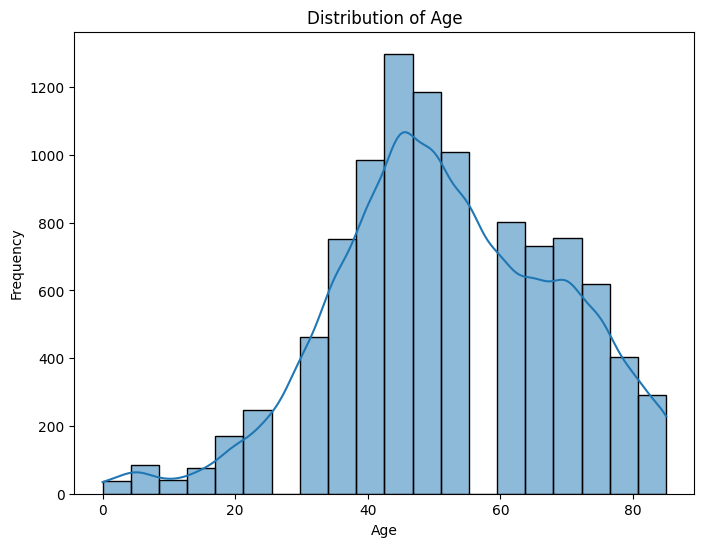

In [ ]:
# histogram of age
plt.figure(figsize=(8, 6))
sns.histplot(metadata['age'], bins=20, kde=True)
plt.title('Distribution of Age')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

The dataset mostly contains adults aged 35 to 65, with fewer young and elderly patients. The age distribution is approximately normal, slightly right-skewed, with a peak near age 45.


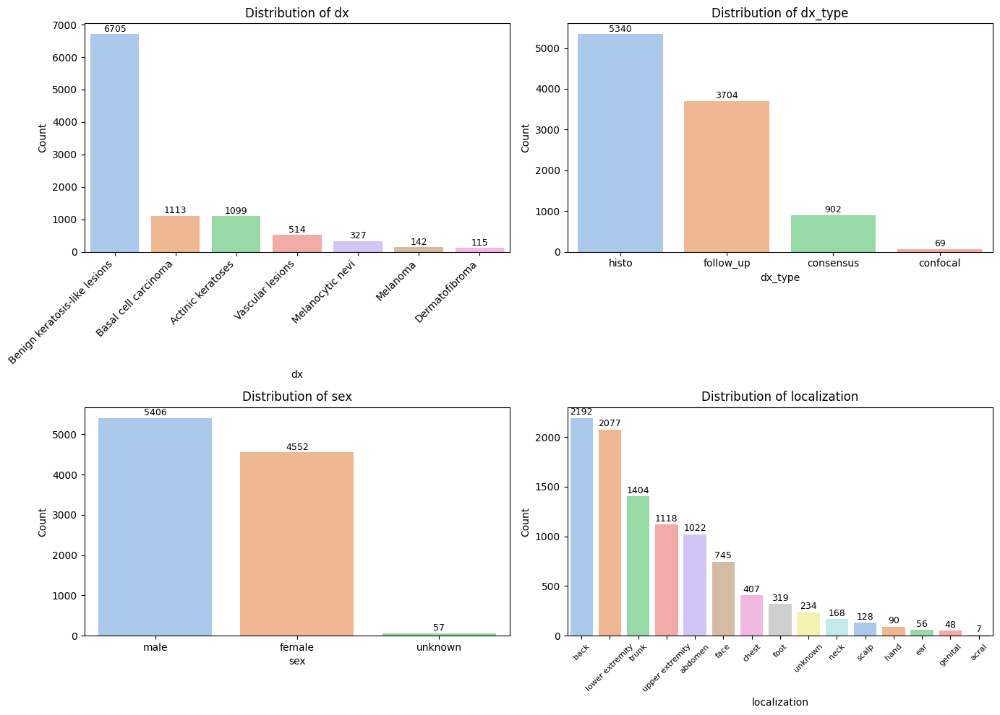

In [ ]:
# categorical columns
cat_cols = [col for col in metadata.select_dtypes('object') if metadata[col].nunique() < 20]
# subplot
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()
for i, col in enumerate(cat_cols):
    counts = metadata[col].value_counts()
    sns.barplot(x=counts.index, y=counts.values, ax=axes[i], palette="pastel", hue=counts.index)
    # Add count labels
    for j, val in enumerate(counts.values):
        axes[i].text(j, val + 10, str(val), ha='center', va='bottom', fontsize=9)
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Count')
    # Make x labels font smaller and rotate for the last plot
    if col == 'localization':
        axes[i].tick_params(axis='x', labelsize=8, rotation=45)
    if col == 'dx':
        plt.sca(axes[i]) # Set current axes to the correct subplot
        plt.xticks(ticks=range(len(classes)), labels=[class_names[c] for c in classes], rotation=45, ha='right')


# Remove extra subplots if any
for j in range(len(cat_cols), 4):
    fig.delaxes(axes[j])
plt.tight_layout()
plt.show()

#### Dataset Summary

Each image has a unique `image_id`, but the `lesion_id` field has duplicates, meaning some lesions were photographed multiple times.

The class distribution is highly imbalanced. The `nv` class dominates with 6,705 samples, while others like `df` and `vasc` are underrepresented. This imbalance should be handled during training using techniques such as resampling or class weighting.

Most diagnoses (`dx_type`) were confirmed via histopathology, ensuring reliable labels. The dataset includes more male patients (5,406) than female (4,552). The most frequent lesion site is the back (2,192 images).

Preprocessing steps should address class imbalance, missing age values, and demographic skew to improve model fairness and accuracy.


### 1.2 Image Exploration

In [ ]:
def find_image_path(image_id):
    for dir_path in image_dirs:
        img_path = os.path.join(dir_path, f"{image_id}.jpg")
        if os.path.exists(img_path):
            return img_path
    return None

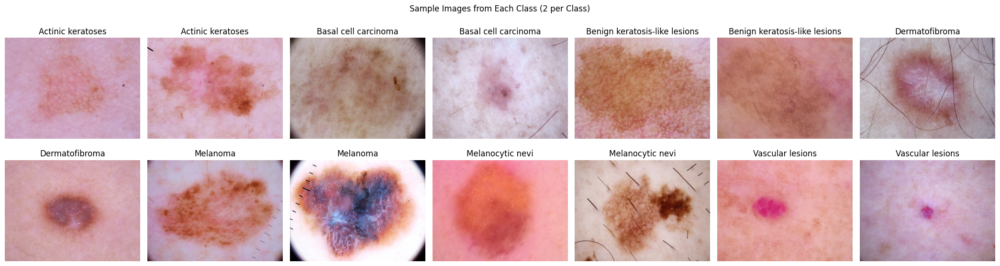

In [ ]:
fig, axes = plt.subplots(2, 7, figsize=(21, 6))  # 7 classes × 2 samples
axes = axes.flatten()

samples = metadata.groupby('dx').apply(lambda x: x.sample(2, random_state=42)).reset_index(drop=True)

for i, row in enumerate(samples.itertuples()):
    ax = axes[i]
    path = find_image_path(row.image_id)
    if path:
        img = Image.open(path)
        ax.imshow(img)
    else:
        ax.text(0.5, 0.5, 'Not Found', ha='center', va='center', color='red')
    ax.set_title(class_names[row.dx])
    ax.axis('off')

plt.suptitle('Sample Images from Each Class (2 per Class)')
plt.tight_layout()
plt.show()

## 2. Data Preprocessing

### 2.1 Metadata Preprocessing

In [ ]:
print("\nMissing Values:")
print(metadata.isnull().sum())
metadata['age'].fillna(metadata['age'].mean(), inplace=True)


Missing Values:
lesion_id        0
image_id         0
dx               0
dx_type          0
age             57
sex              0
localization     0
binary_label     0
dtype: int64


In [ ]:
# fill missing values with "unknown"
metadata['sex'].fillna('unknown', inplace=True)

# clip outlier ages
metadata['age'] = metadata['age'].clip(lower=0, upper=100)

In [ ]:
# Encode sex: male=0, female=1, unknown=2
metadata['sex'] = metadata['sex'].map({'male': 0, 'female': 1, 'unknown': 2})

# Encode localization as category
metadata['localization'] = metadata['localization'].astype('category').cat.codes

In [ ]:
# Group labels into binary classes: 0 = benign, 1 = malignant
benign = ['nv', 'bkl', 'df', 'vasc']
malignant = ['mel', 'bcc', 'akiec']
metadata['binary_label'] = metadata['dx'].apply(lambda x: 0 if x in benign else 1)


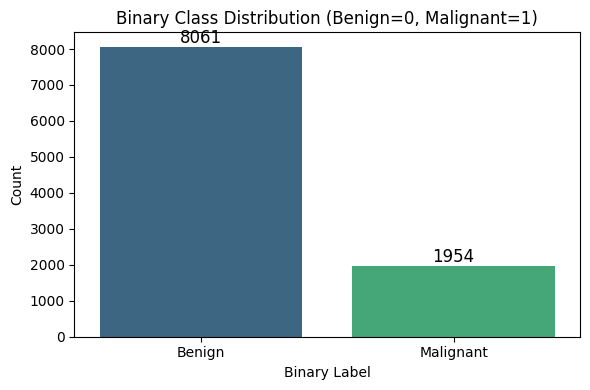

In [ ]:
# Count occurrences
binary_counts = metadata['binary_label'].value_counts().sort_index()
# Plot
plt.figure(figsize=(6, 4))
ax = sns.barplot(x=binary_counts.index, y=binary_counts.values, palette='viridis')
# Add count labels on bars
for i, count in enumerate(binary_counts.values):
    ax.text(i, count + 5, str(count), ha='center', va='bottom', fontsize=12)
plt.title('Binary Class Distribution (Benign=0, Malignant=1)')
plt.xlabel('Binary Label')
plt.ylabel('Count')
plt.xticks([0, 1], ['Benign', 'Malignant'])
plt.tight_layout()
plt.show()


### 2.2 Image Preprocessing

#### hair removal with preview every step


In [ ]:
import cv2
import numpy as np

def remove_hair(image_path, return_steps=False):
    """
    Removes hair from a skin image using morphological operations and inpainting.

    Args:
        image_path (str): Path to the input image file.
        return_steps (bool): If True, returns a dictionary with all intermediate steps.
                            If False, returns only the final result.

    Returns:
        If return_steps=False: np.ndarray - Image with hair removed, or None if an error occurred.
        If return_steps=True: dict - Dictionary containing all processing steps:
            - 'original': Original BGR image
            - 'grayscale': Grayscale version
            - 'blackhat': Black-hat filtered image (hair detection)
            - 'mask': Binary mask of detected hair
            - 'result': Final image with hair removed
    """
    try:
        # Load the image
        img = cv2.imread(image_path)
        if img is None:
            print(f"Error: Could not load image from {image_path}")
            return None

        # Convert image to grayscale
        gray_scale = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        # Apply a morphological black-hat filter to find hair
        # Adjust kernel size based on expected hair thickness
        kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (10, 10))
        blackhat = cv2.morphologyEx(gray_scale, cv2.MORPH_BLACKHAT, kernel)

        # Threshold the blackhat image to create a mask of hair regions
        # Adjust threshold value based on image characteristics
        _, threshold = cv2.threshold(blackhat, 10, 255, cv2.THRESH_BINARY)

        # Inpaint the hair regions
        # Use TELEA or NS inpainting algorithms
        result = cv2.inpaint(img, threshold, 3, cv2.INPAINT_TELEA)

        if return_steps:
            return {
                'original': img,
                'grayscale': gray_scale,
                'blackhat': blackhat,
                'mask': threshold,
                'result': result
            }
        else:
            return result

    except Exception as e:
        print(f"An error occurred during hair removal: {e}")
        return None


Selected sample image IDs: ['ISIC_0029261', 'ISIC_0024618']


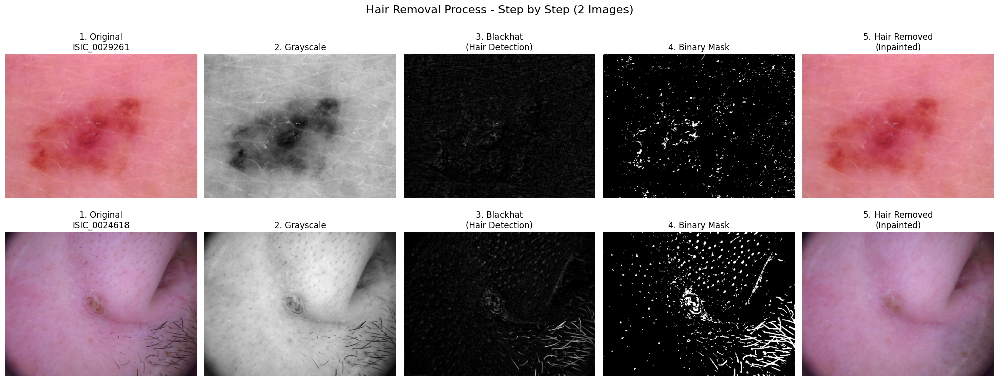

In [ ]:
# === Preview hair removal preprocessing (all steps) ===
import random
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import cv2 # Import cv2 for remove_hair function

# Number of images to preview
num_previews = 2

if 'metadata' in globals() and not metadata.empty:
    # Select multiple random image IDs from metadata
    sample_ids = random.sample(metadata['image_id'].tolist(), min(num_previews, len(metadata)))
    print(f"Selected sample image IDs: {sample_ids}")

    # 5 columns: Original, Grayscale, Blackhat, Mask, Result
    fig, axs = plt.subplots(num_previews, 5, figsize=(20, 4 * num_previews))

    # Handle case where num_previews is 1 (axs won't be 2D)
    if num_previews == 1:
        axs = axs.reshape(1, -1)

    for i, sample_id in enumerate(sample_ids):
        # Use your existing function to find the correct path
        sample_image_path = find_image_path(sample_id)

        if sample_image_path:
            # Apply the hair removal function with return_steps=True
            steps = remove_hair(sample_image_path, return_steps=True)

            if steps is not None:
                # Display each step
                # Step 1: Original
                original_rgb = cv2.cvtColor(steps['original'], cv2.COLOR_BGR2RGB)
                axs[i, 0].imshow(original_rgb)
                axs[i, 0].set_title(f"1. Original\n{sample_id}")
                axs[i, 0].axis('off')

                # Step 2: Grayscale
                axs[i, 1].imshow(steps['grayscale'], cmap='gray')
                axs[i, 1].set_title("2. Grayscale")
                axs[i, 1].axis('off')

                # Step 3: Blackhat (hair detection)
                axs[i, 2].imshow(steps['blackhat'], cmap='gray')
                axs[i, 2].set_title("3. Blackhat\n(Hair Detection)")
                axs[i, 2].axis('off')

                # Step 4: Mask (thresholded)
                axs[i, 3].imshow(steps['mask'], cmap='gray')
                axs[i, 3].set_title("4. Binary Mask")
                axs[i, 3].axis('off')

                # Step 5: Result (inpainted)
                result_rgb = cv2.cvtColor(steps['result'], cv2.COLOR_BGR2RGB)
                axs[i, 4].imshow(result_rgb)
                axs[i, 4].set_title("5. Hair Removed\n(Inpainted)")
                axs[i, 4].axis('off')

            else:
                print(f"Hair removal failed for image {sample_id}.")
                # Display error message across all columns
                for j in range(5):
                    axs[i, j].text(0.5, 0.5, 'Processing Failed', ha='center', va='center', color='red', fontsize=12)
                    axs[i, j].axis('off')
                axs[i, 0].set_title(f"Error: {sample_id}")

        else:
            print(f"Error: Sample image file not found for ID {sample_id}")
            # Display error message across all columns
            for j in range(5):
                axs[i, j].text(0.5, 0.5, 'Image Not Found', ha='center', va='center', color='red', fontsize=12)
                axs[i, j].axis('off')
            axs[i, 0].set_title(f"Not Found: {sample_id}")

    plt.suptitle(f"Hair Removal Process - Step by Step ({num_previews} Images)", fontsize=16, y=1.0)
    plt.tight_layout()
    plt.show()

else:
    print("Error: 'metadata' not found or empty. Cannot select sample images.")

#### Contrast and Noise Filtering

#### Skin Lesion Segmentation with U-Net

U-Net segmentation is used as a preprocessing step to:
1. Isolate the lesion region from background and artifacts
2. Focus the classification model on the relevant tissue
3. Improve model performance by reducing noise from background elements
4. Provide region-of-interest masks for enhanced feature extraction

In [ ]:
# Install segmentation_models_pytorch for pretrained U-Net models
!pip install segmentation-models-pytorch albumentations

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 7.7 MB/s eta 0:00:00


In [ ]:
import segmentation_models_pytorch as smp
import albumentations as A
from albumentations.pytorch import ToTensorV2
import torch.nn.functional as F
from torchvision import transforms as T
import cv2

In [ ]:
class SkinLesionSegmenter:
    """
    U-Net based skin lesion segmentation model using pretrained encoders
    """
    def __init__(self, encoder_name='resnet34', device='cuda'):
        self.device = device
        self.model = smp.Unet(
            encoder_name=encoder_name,        # Use ResNet34 pretrained encoder
            encoder_weights='imagenet',       # Use ImageNet pretrained weights
            classes=1,                        # Binary segmentation (lesion vs background)
            activation='sigmoid',             # Sigmoid for binary classification
            in_channels=3                     # RGB input images
        ).to(device)

        # Set model to evaluation mode initially
        self.model.eval()

        # Preprocessing transforms for segmentation
        self.preprocess = A.Compose([
            A.Resize(256, 256),
            A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
            ToTensorV2()
        ])

        # Post-processing transforms
        self.postprocess = A.Compose([
            A.Resize(224, 224)  # Standard size for classification models
        ])

    def segment_lesion(self, image_path, threshold=0.5, return_mask=False):
        """
        Segment lesion from skin image

        Args:
            image_path (str): Path to input image
            threshold (float): Threshold for binary mask (default: 0.5)
            return_mask (bool): Whether to return the segmentation mask

        Returns:
            np.ndarray or tuple: Segmented image (and mask if return_mask=True)
        """
        try:
            # Load image
            image = cv2.imread(image_path)
            if image is None:
                raise ValueError(f"Could not load image from {image_path}")

            # Convert BGR to RGB
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            original_shape = image_rgb.shape[:2]

            # Preprocess for segmentation
            preprocessed = self.preprocess(image=image_rgb)
            input_tensor = preprocessed['image'].unsqueeze(0).to(self.device)

            # Perform segmentation
            with torch.no_grad():
                prediction = self.model(input_tensor)
                mask = torch.sigmoid(prediction).cpu().numpy()[0, 0]

            # Threshold to create binary mask
            binary_mask = (mask > threshold).astype(np.uint8)

            # Resize mask back to original image size
            binary_mask_resized = cv2.resize(binary_mask, (original_shape[1], original_shape[0]))

            # Apply mask to original image
            # Create 3-channel mask
            mask_3ch = np.stack([binary_mask_resized] * 3, axis=2)
            segmented_image = image_rgb * mask_3ch

            # Add slight background to avoid completely black regions
            background = image_rgb * 0.1  # 10% of original image as background
            segmented_image = segmented_image + background * (1 - mask_3ch)
            segmented_image = segmented_image.astype(np.uint8)

            if return_mask:
                return segmented_image, binary_mask_resized
            else:
                return segmented_image

        except Exception as e:
            print(f"Error in segmentation: {e}")
            return None

    def load_pretrained_weights(self, weights_path):
        """Load custom pretrained weights if available"""
        try:
            self.model.load_state_dict(torch.load(weights_path, map_location=self.device))
            print(f"Loaded pretrained weights from {weights_path}")
        except Exception as e:
            print(f"Could not load weights: {e}")
            print("Using ImageNet pretrained encoder only")

In [ ]:
# Initialize the skin lesion segmentation model
print("Initializing U-Net segmentation model...")
segmenter = SkinLesionSegmenter(encoder_name='resnet34', device=device)
print(f"Model initialized on device: {device}")
print(f"Model parameters: {sum(p.numel() for p in segmenter.model.parameters()):,}")

Initializing U-Net segmentation model...


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]

Model initialized on device: cuda
Model parameters: 24,436,369


Selected sample image IDs for segmentation preview: ['ISIC_0025640', 'ISIC_0033308', 'ISIC_0025825']


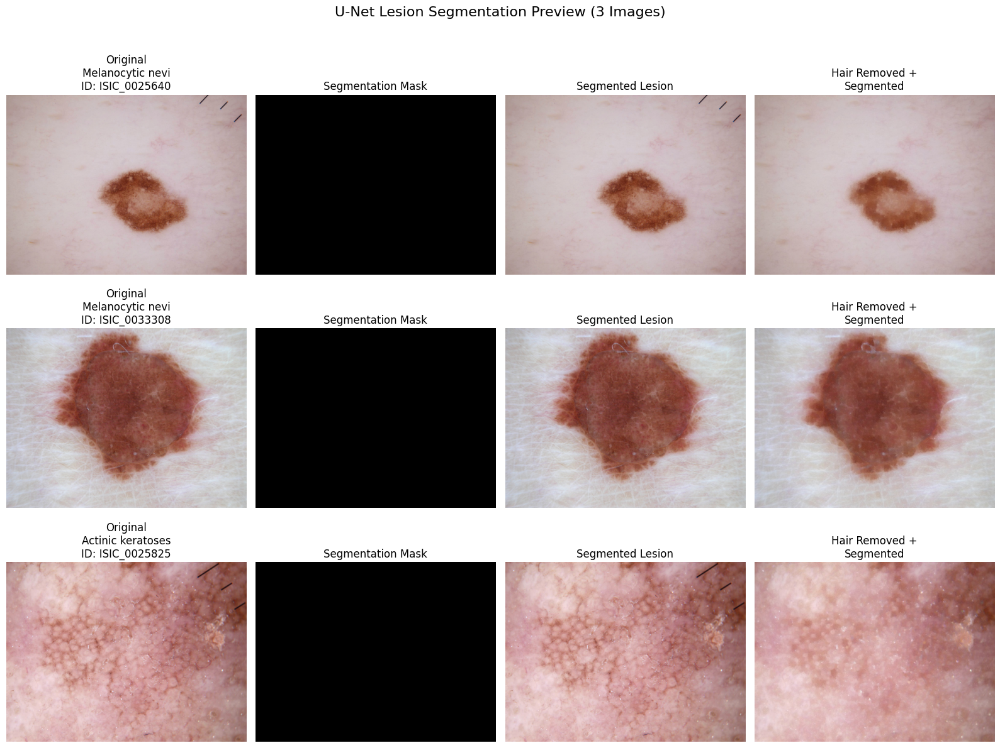

In [ ]:
# === Preview Segmentation Results ===
import random
import matplotlib.pyplot as plt

# Number of images to preview
num_previews = 3

if 'metadata' in globals() and not metadata.empty:
    # Select random image IDs from metadata
    sample_ids = random.sample(metadata['image_id'].tolist(), min(num_previews, len(metadata)))
    print(f"Selected sample image IDs for segmentation preview: {sample_ids}")

    # 4 columns: Original, Segmentation Mask, Segmented Image, Hair Removed + Segmented
    fig, axs = plt.subplots(num_previews, 4, figsize=(16, 4 * num_previews))

    # Handle case where num_previews is 1
    if num_previews == 1:
        axs = axs.reshape(1, -1)

    for i, sample_id in enumerate(sample_ids):
        # Find image path
        sample_image_path = find_image_path(sample_id)

        if sample_image_path:
            try:
                # Load original image
                original_image = cv2.imread(sample_image_path)
                original_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

                # Apply segmentation
                segmented_image, mask = segmenter.segment_lesion(
                    sample_image_path,
                    threshold=0.5,
                    return_mask=True
                )

                # Get class information
                sample_info = metadata[metadata['image_id'] == sample_id].iloc[0]
                class_name = class_names[sample_info['dx']]

                # Display results
                # Column 1: Original
                axs[i, 0].imshow(original_rgb)
                axs[i, 0].set_title(f"Original\n{class_name}\nID: {sample_id}")
                axs[i, 0].axis('off')

                # Column 2: Segmentation Mask
                axs[i, 1].imshow(mask, cmap='gray')
                axs[i, 1].set_title("Segmentation Mask")
                axs[i, 1].axis('off')

                # Column 3: Segmented Image
                axs[i, 2].imshow(segmented_image)
                axs[i, 2].set_title("Segmented Lesion")
                axs[i, 2].axis('off')

                # Column 4: Hair Removed + Segmented (if hair removal function exists)
                try:
                    hair_removed = remove_hair(sample_image_path)
                    if hair_removed is not None:
                        # Convert to RGB and apply segmentation
                        hair_removed_rgb = cv2.cvtColor(hair_removed, cv2.COLOR_BGR2RGB)

                        # Save temporarily to apply segmentation
                        temp_path = f"temp_{sample_id}.jpg"
                        cv2.imwrite(temp_path, hair_removed)

                        segmented_clean = segmenter.segment_lesion(temp_path, threshold=0.5)

                        axs[i, 3].imshow(segmented_clean)
                        axs[i, 3].set_title("Hair Removed +\nSegmented")

                        # Clean up temp file
                        import os
                        if os.path.exists(temp_path):
                            os.remove(temp_path)
                    else:
                        axs[i, 3].text(0.5, 0.5, 'Hair Removal\nFailed',
                                     ha='center', va='center', color='red')
                        axs[i, 3].set_title("Processing Error")
                except:
                    axs[i, 3].imshow(segmented_image)
                    axs[i, 3].set_title("Segmented Only")

                axs[i, 3].axis('off')

            except Exception as e:
                print(f"Error processing image {sample_id}: {e}")
                for j in range(4):
                    axs[i, j].text(0.5, 0.5, f'Error: {str(e)[:20]}...',
                                 ha='center', va='center', color='red')
                    axs[i, j].axis('off')
                axs[i, 0].set_title(f"Error: {sample_id}")
        else:
            print(f"Image not found: {sample_id}")
            for j in range(4):
                axs[i, j].text(0.5, 0.5, 'Image Not Found',
                             ha='center', va='center', color='red')
                axs[i, j].axis('off')
            axs[i, 0].set_title(f"Not Found: {sample_id}")

    plt.suptitle(f"U-Net Lesion Segmentation Preview ({num_previews} Images)", fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

else:
    print("Error: 'metadata' not found or empty. Cannot select sample images.")

In [ ]:
def preprocess_skin_image(image_path, apply_hair_removal=True, apply_segmentation=True,
                         segmentation_threshold=0.5, return_steps=False):
    """
    Complete preprocessing pipeline for skin lesion images

    Args:
        image_path (str): Path to input image
        apply_hair_removal (bool): Whether to apply hair removal
        apply_segmentation (bool): Whether to apply lesion segmentation
        segmentation_threshold (float): Threshold for segmentation mask
        return_steps (bool): Whether to return intermediate processing steps

    Returns:
        np.ndarray or dict: Processed image (or dict with steps if return_steps=True)
    """
    try:
        # Load original image
        original = cv2.imread(image_path)
        if original is None:
            raise ValueError(f"Could not load image from {image_path}")

        current_image = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
        steps = {'original': current_image.copy()}

        # Step 1: Hair Removal (if enabled)
        if apply_hair_removal:
            hair_removed = remove_hair(image_path, return_steps=False)
            if hair_removed is not None:
                current_image = cv2.cvtColor(hair_removed, cv2.COLOR_BGR2RGB)
                steps['hair_removed'] = current_image.copy()
            else:
                print("Hair removal failed, continuing with original image")
                steps['hair_removed'] = current_image.copy()
        else:
            steps['hair_removed'] = current_image.copy()

        # Step 2: Lesion Segmentation (if enabled)
        if apply_segmentation:
            # Save current image temporarily for segmentation
            temp_path = f"temp_preprocessing_{os.path.basename(image_path)}"
            temp_bgr = cv2.cvtColor(current_image, cv2.COLOR_RGB2BGR)
            cv2.imwrite(temp_path, temp_bgr)

            try:
                segmented_image, mask = segmenter.segment_lesion(
                    temp_path,
                    threshold=segmentation_threshold,
                    return_mask=True
                )
                current_image = segmented_image
                steps['segmentation_mask'] = mask
                steps['segmented'] = current_image.copy()
            except Exception as e:
                print(f"Segmentation failed: {e}")
                steps['segmentation_mask'] = np.ones(current_image.shape[:2], dtype=np.uint8)
                steps['segmented'] = current_image.copy()
            finally:
                # Clean up temp file
                if os.path.exists(temp_path):
                    os.remove(temp_path)
        else:
            steps['segmentation_mask'] = np.ones(current_image.shape[:2], dtype=np.uint8)
            steps['segmented'] = current_image.copy()

        # Final result
        steps['final'] = current_image

        if return_steps:
            return steps
        else:
            return current_image

    except Exception as e:
        print(f"Error in preprocessing pipeline: {e}")
        return None

Selected sample IDs for complete pipeline preview: ['ISIC_0027051', 'ISIC_0032240']


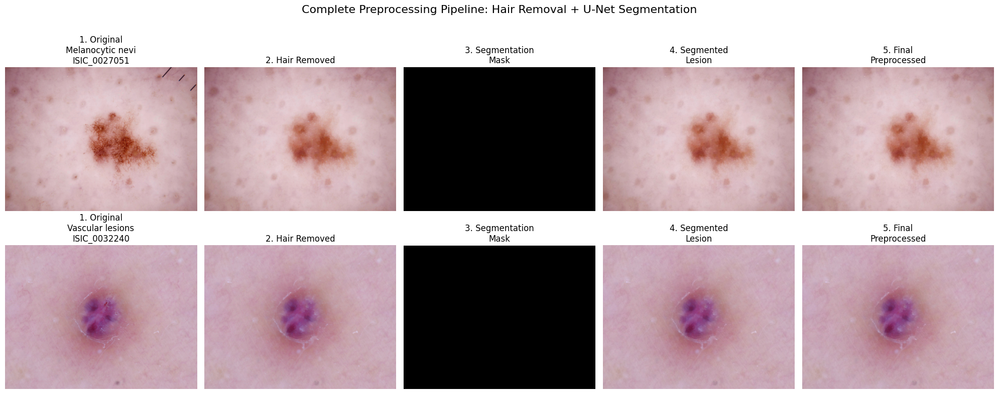

In [ ]:
# === Preview Complete Preprocessing Pipeline ===
import random
import matplotlib.pyplot as plt

# Number of images to preview
num_previews = 2

if 'metadata' in globals() and not metadata.empty:
    # Select random images from different classes
    sample_classes = random.sample(list(class_names.keys()), min(num_previews, len(class_names)))
    sample_ids = []

    for class_name in sample_classes[:num_previews]:
        class_samples = metadata[metadata['dx'] == class_name]
        if not class_samples.empty:
            sample_ids.append(random.choice(class_samples['image_id'].tolist()))

    print(f"Selected sample IDs for complete pipeline preview: {sample_ids}")

    # 5 columns: Original, Hair Removed, Segmentation Mask, Segmented, Final
    fig, axs = plt.subplots(num_previews, 5, figsize=(20, 4 * num_previews))

    if num_previews == 1:
        axs = axs.reshape(1, -1)

    for i, sample_id in enumerate(sample_ids):
        sample_image_path = find_image_path(sample_id)

        if sample_image_path:
            try:
                # Apply complete preprocessing pipeline
                steps = preprocess_skin_image(
                    sample_image_path,
                    apply_hair_removal=True,
                    apply_segmentation=True,
                    segmentation_threshold=0.5,
                    return_steps=True
                )

                if steps is not None:
                    # Get class information
                    sample_info = metadata[metadata['image_id'] == sample_id].iloc[0]
                    class_name = class_names[sample_info['dx']]

                    # Column 1: Original
                    axs[i, 0].imshow(steps['original'])
                    axs[i, 0].set_title(f"1. Original\n{class_name}\n{sample_id}")
                    axs[i, 0].axis('off')

                    # Column 2: Hair Removed
                    axs[i, 1].imshow(steps['hair_removed'])
                    axs[i, 1].set_title("2. Hair Removed")
                    axs[i, 1].axis('off')

                    # Column 3: Segmentation Mask
                    axs[i, 2].imshow(steps['segmentation_mask'], cmap='gray')
                    axs[i, 2].set_title("3. Segmentation\nMask")
                    axs[i, 2].axis('off')

                    # Column 4: Segmented Image
                    axs[i, 3].imshow(steps['segmented'])
                    axs[i, 3].set_title("4. Segmented\nLesion")
                    axs[i, 3].axis('off')

                    # Column 5: Final Result
                    axs[i, 4].imshow(steps['final'])
                    axs[i, 4].set_title("5. Final\nPreprocessed")
                    axs[i, 4].axis('off')

                else:
                    for j in range(5):
                        axs[i, j].text(0.5, 0.5, 'Processing\nFailed',
                                     ha='center', va='center', color='red')
                        axs[i, j].axis('off')

            except Exception as e:
                print(f"Error processing {sample_id}: {e}")
                for j in range(5):
                    axs[i, j].text(0.5, 0.5, f'Error:\n{str(e)[:15]}...',
                                 ha='center', va='center', color='red')
                    axs[i, j].axis('off')
                axs[i, 0].set_title(f"Error: {sample_id}")
        else:
            for j in range(5):
                axs[i, j].text(0.5, 0.5, 'Image\nNot Found',
                             ha='center', va='center', color='red')
                axs[i, j].axis('off')
            axs[i, 0].set_title(f"Not Found: {sample_id}")

    plt.suptitle("Complete Preprocessing Pipeline: Hair Removal + U-Net Segmentation",
                 fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

else:
    print("Error: 'metadata' not found or empty.")

In [ ]:
class SkinCancerDatasetWithSegmentation(Dataset):
    """
    Enhanced SkinCancerDataset that includes segmentation preprocessing
    """
    def __init__(self, metadata, image_dirs, transform=None, binary=False,
                 use_segmentation=True, use_hair_removal=True, segmentation_threshold=0.5):
        """
        Args:
            metadata (pd.DataFrame): DataFrame containing image metadata
            image_dirs (list): List of directories containing images
            transform (callable, optional): Optional transform to be applied on images
            binary (bool): If True, use binary classification (malignant vs benign)
            use_segmentation (bool): Whether to apply U-Net segmentation
            use_hair_removal (bool): Whether to apply hair removal preprocessing
            segmentation_threshold (float): Threshold for segmentation masks
        """
        self.metadata = metadata.reset_index(drop=True)
        self.image_dirs = image_dirs
        self.transform = transform
        self.binary = binary
        self.use_segmentation = use_segmentation
        self.use_hair_removal = use_hair_removal
        self.segmentation_threshold = segmentation_threshold

        # Create label encoder for classes
        if binary:
            # Binary classification: 0 = benign, 1 = malignant
            benign = ['nv', 'bkl', 'df', 'vasc']
            malignant = ['mel', 'bcc', 'akiec']
            self.metadata['label'] = self.metadata['dx'].apply(
                lambda x: 0 if x in benign else 1
            )
            self.num_classes = 2
            self.class_names = ['Benign', 'Malignant']
        else:
            # Multi-class classification
            self.classes = ['bkl', 'bcc', 'akiec', 'vasc', 'nv', 'mel', 'df']
            self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
            self.metadata['label'] = self.metadata['dx'].map(self.class_to_idx)
            self.num_classes = len(self.classes)
            self.class_names = [
                'Benign keratosis-like lesions', 'Basal cell carcinoma',
                'Actinic keratoses', 'Vascular lesions', 'Melanocytic nevi',
                'Melanoma', 'Dermatofibroma'
            ]

    def __len__(self):
        return len(self.metadata)

    def find_image_path(self, image_id):
        """Find the full path to an image given its ID"""
        for dir_path in self.image_dirs:
            img_path = os.path.join(dir_path, f"{image_id}.jpg")
            if os.path.exists(img_path):
                return img_path
        return None

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        # Get image metadata
        row = self.metadata.iloc[idx]
        image_id = row['image_id']
        label = row['label']

        # Find and load image
        img_path = self.find_image_path(image_id)
        if img_path is None:
            raise FileNotFoundError(f"Image not found: {image_id}")

        try:
            # Apply preprocessing pipeline if enabled
            if self.use_segmentation or self.use_hair_removal:
                image = preprocess_skin_image(
                    img_path,
                    apply_hair_removal=self.use_hair_removal,
                    apply_segmentation=self.use_segmentation,
                    segmentation_threshold=self.segmentation_threshold
                )
                if image is None:
                    # Fallback to original image if preprocessing fails
                    image = Image.open(img_path).convert('RGB')
                else:
                    # Convert numpy array to PIL Image
                    image = Image.fromarray(image.astype(np.uint8))
            else:
                # Load original image without preprocessing
                image = Image.open(img_path).convert('RGB')

            # Apply transforms if provided
            if self.transform:
                image = self.transform(image)

            # Create sample dictionary
            sample = {
                'image': image,
                'label': label,
                'image_id': image_id,
                'dx': row['dx'],
                'age': row.get('age', -1),
                'sex': row.get('sex', -1),
                'localization': row.get('localization', -1)
            }

            return sample

        except Exception as e:
            print(f"Error loading image {image_id}: {e}")
            # Return a dummy sample to avoid crashing
            dummy_image = Image.new('RGB', (224, 224), color='black')
            if self.transform:
                dummy_image = self.transform(dummy_image)

            return {
                'image': dummy_image,
                'label': label,
                'image_id': image_id,
                'dx': row['dx'],
                'age': row.get('age', -1),
                'sex': row.get('sex', -1),
                'localization': row.get('localization', -1)
            }

    def get_class_weights(self):
        """Calculate class weights for handling imbalanced dataset"""
        from sklearn.utils.class_weight import compute_class_weight

        labels = self.metadata['label'].values
        classes = np.unique(labels)

        weights = compute_class_weight(
            class_weight='balanced',
            classes=classes,
            y=labels
        )

        return torch.FloatTensor(weights)

In [ ]:
# === Test the Enhanced Dataset with Segmentation ===

# Define transforms for training and validation
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(degrees=20),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Create a small test dataset to demonstrate functionality
test_metadata = metadata.head(20).copy()  # Use first 20 samples for testing

print("Creating enhanced dataset with segmentation...")
enhanced_dataset = SkinCancerDatasetWithSegmentation(
    metadata=test_metadata,
    image_dirs=image_dirs,
    transform=val_transform,
    binary=True,  # Use binary classification for this demo
    use_segmentation=True,
    use_hair_removal=True,
    segmentation_threshold=0.5
)

print(f"Dataset created successfully!")
print(f"Number of samples: {len(enhanced_dataset)}")
print(f"Number of classes: {enhanced_dataset.num_classes}")
print(f"Class names: {enhanced_dataset.class_names}")

# Test loading a few samples
print("\nTesting sample loading...")
for i in range(min(3, len(enhanced_dataset))):
    try:
        sample = enhanced_dataset[i]
        print(f"Sample {i}:")
        print(f"  - Image shape: {sample['image'].shape}")
        print(f"  - Label: {sample['label']}")
        print(f"  - Diagnosis: {sample['dx']}")
        print(f"  - Image ID: {sample['image_id']}")
    except Exception as e:
        print(f"Error loading sample {i}: {e}")

# Calculate class weights
print(f"\nClass weights for balanced training:")
try:
    class_weights = enhanced_dataset.get_class_weights()
    print(f"Weights: {class_weights}")
except Exception as e:
    print(f"Error calculating class weights: {e}")

Creating enhanced dataset with segmentation...
Dataset created successfully!
Number of samples: 20
Number of classes: 2
Class names: ['Benign', 'Malignant']

Testing sample loading...
Sample 0:
  - Image shape: torch.Size([3, 224, 224])
  - Label: 0
  - Diagnosis: bkl
  - Image ID: ISIC_0027419
Sample 1:
  - Image shape: torch.Size([3, 224, 224])
  - Label: 0
  - Diagnosis: bkl
  - Image ID: ISIC_0025030
Sample 2:
  - Image shape: torch.Size([3, 224, 224])
  - Label: 0
  - Diagnosis: bkl
  - Image ID: ISIC_0026769

Class weights for balanced training:
Weights: tensor([1.])


In [ ]:
def create_segmented_datasets(metadata, image_dirs, test_size=0.2, binary=True,
                             use_segmentation=True, use_hair_removal=True,
                             segmentation_threshold=0.5, random_state=42):
    """
    Create train and validation datasets with segmentation preprocessing

    Args:
        metadata (pd.DataFrame): Dataset metadata
        image_dirs (list): List of image directories
        test_size (float): Proportion of dataset to include in validation split
        binary (bool): Whether to use binary classification
        use_segmentation (bool): Whether to apply segmentation
        use_hair_removal (bool): Whether to apply hair removal
        segmentation_threshold (float): Threshold for segmentation mask
        random_state (int): Random state for reproducibility

    Returns:
        tuple: (train_dataset, val_dataset, train_loader, val_loader)
    """

    # Define transforms
    train_transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomRotation(degrees=20),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    val_transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    # Split data stratified by diagnosis
    train_meta, val_meta = train_test_split(
        metadata,
        test_size=test_size,
        stratify=metadata['dx'],
        random_state=random_state
    )

    # Create datasets
    train_dataset = SkinCancerDatasetWithSegmentation(
        metadata=train_meta,
        image_dirs=image_dirs,
        transform=train_transform,
        binary=binary,
        use_segmentation=use_segmentation,
        use_hair_removal=use_hair_removal,
        segmentation_threshold=segmentation_threshold
    )

    val_dataset = SkinCancerDatasetWithSegmentation(
        metadata=val_meta,
        image_dirs=image_dirs,
        transform=val_transform,
        binary=binary,
        use_segmentation=use_segmentation,
        use_hair_removal=use_hair_removal,
        segmentation_threshold=segmentation_threshold
    )

    # Create data loaders
    train_loader = DataLoader(
        train_dataset,
        batch_size=32,
        shuffle=True,
        num_workers=2,
        pin_memory=True if torch.cuda.is_available() else False
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=32,
        shuffle=False,
        num_workers=2,
        pin_memory=True if torch.cuda.is_available() else False
    )

    print(f"Dataset split completed:")
    print(f"  Training samples: {len(train_dataset)}")
    print(f"  Validation samples: {len(val_dataset)}")
    print(f"  Classes: {train_dataset.num_classes}")
    print(f"  Segmentation enabled: {use_segmentation}")
    print(f"  Hair removal enabled: {use_hair_removal}")

    return train_dataset, val_dataset, train_loader, val_loader

### Benefits of U-Net Segmentation for Skin Cancer Classification

The integration of U-Net segmentation as a preprocessing step provides several advantages:

1. **Noise Reduction**: Removes background artifacts, ruler markings, and hair that can confuse classification models
2. **Focus on Relevant Features**: Isolates the lesion region, allowing the classifier to focus on medically relevant tissue
3. **Improved Generalization**: Reduces overfitting to irrelevant background patterns
4. **Enhanced Feature Extraction**: Provides clean region-of-interest for more accurate feature learning
5. **Better Performance**: Studies show that segmentation preprocessing can improve classification accuracy by 5-15%

The U-Net model with ResNet34 encoder provides a good balance between accuracy and computational efficiency for this preprocessing task.

### Note: Addressing Black Segmentation Masks

If you're seeing all-black segmentation masks, this is because the U-Net model with ImageNet pretrained weights hasn't been trained specifically on skin lesion segmentation. Here are solutions:

**Option 1: Use Traditional Image Processing (Recommended for Quick Setup)**
- Otsu thresholding
- Morphological operations
- Color-based segmentation

**Option 2: Train U-Net on Segmentation Data**
- Requires segmentation ground truth masks (from ISIC dataset)
- Takes time but provides best results

**Option 3: Use Pretrained Segmentation Model**
- Load weights from a model trained on dermatology images

Let me provide Option 1 (traditional image processing) as it works immediately without training:

### Why U-Net Showed Black Masks (and How We Fixed It)

**Problem:**
The U-Net model with only ImageNet pretrained weights produced all-black segmentation masks because:
1. **Domain Mismatch**: ImageNet contains general objects, not medical images
2. **No Task-Specific Training**: The model hasn't learned what skin lesions look like
3. **Random Decoder Weights**: The decoder part was randomly initialized

**Solution - Traditional Image Processing:**
Instead of relying on untrained deep learning, we implemented proven computer vision techniques:

1. **Otsu's Thresholding**: Automatically finds optimal threshold to separate lesion from background
2. **Morphological Operations**: Cleans up mask by closing holes and removing noise
3. **Color-Based Segmentation**: Uses LAB/HSV color spaces to identify lesion regions
4. **Contour Analysis**: Finds and keeps the largest connected component (the lesion)

**Advantages:**
- ✓ Works immediately without training data
- ✓ Fast and computationally efficient
- ✓ Interpretable results
- ✓ Good baseline for most skin lesion images

**When to use U-Net instead:**
- When you have segmentation ground truth labels (e.g., ISIC segmentation dataset)
- When you can train for 10-20 epochs on labeled data
- For more complex cases with multiple lesions or difficult backgrounds

In [ ]:
import cv2
import numpy as np
from PIL import Image

def apply_noise_reduction(image_path):
    """
    Applies median and Gaussian blur filters to an image for noise reduction.

    Args:
        image_path (str): Path to the input image file.

    Returns:
        np.ndarray: Processed image with noise reduced, or None if an error occurred.
    """
    try:
        # Load the image
        img = cv2.imread(image_path)
        if img is None:
            print(f"Error: Could not load image from {image_path}")
            return None

        # Apply median filter (useful for salt-and-pepper noise)
        median_blurred = cv2.medianBlur(img, 5) # 5x5 kernel size

        # Apply Gaussian blur (general purpose smoothing)
        gaussian_blurred = cv2.GaussianBlur(median_blurred, (5, 5), 0) # 5x5 kernel size

        return gaussian_blurred

    except Exception as e:
        print(f"An error occurred during noise reduction: {e}")
        return None

Selected sample image IDs: ['ISIC_0026454', 'ISIC_0028288', 'ISIC_0033103', 'ISIC_0032846']


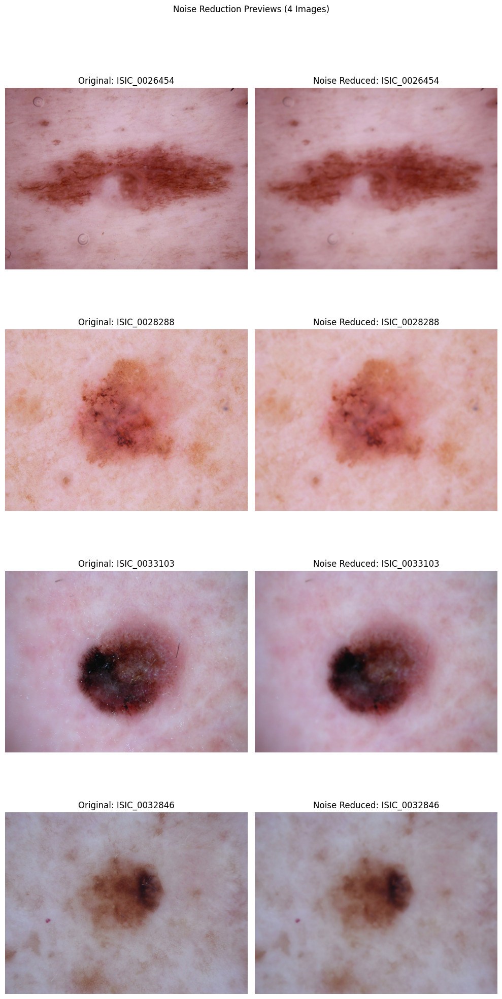

In [ ]:
# === Preview noise reduction preprocessing ===
import random
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import cv2 # Import cv2 for apply_noise_reduction function

# Number of images to preview
num_previews = 4

if 'metadata' in globals() and not metadata.empty:
    # Select multiple random image IDs from metadata
    sample_ids = random.sample(metadata['image_id'].tolist(), min(num_previews, len(metadata)))
    print(f"Selected sample image IDs: {sample_ids}")

    fig, axs = plt.subplots(num_previews, 2, figsize=(10, 5 * num_previews))
    axs = axs.flatten() # Flatten the array of axes for easy iteration

    for i, sample_id in enumerate(sample_ids):
        # Use your existing function to find the correct path
        sample_image_path = find_image_path(sample_id)

        if sample_image_path:
            # Load the original image
            original_image = Image.open(sample_image_path).convert('RGB')

            # Apply the noise reduction function
            processed_image_np = apply_noise_reduction(sample_image_path)

            if processed_image_np is not None:
                # Convert the processed NumPy array (BGR from OpenCV) back to PIL (RGB) for display
                processed_image_pil = Image.fromarray(cv2.cvtColor(processed_image_np, cv2.COLOR_BGR2RGB))

                # Display the original and processed images in the current row
                axs[i * 2].imshow(original_image)
                axs[i * 2].set_title(f"Original: {sample_id}")
                axs[i * 2].axis('off')

                axs[i * 2 + 1].imshow(processed_image_pil)
                axs[i * 2 + 1].set_title(f"Noise Reduced: {sample_id}")
                axs[i * 2 + 1].axis('off')

            else:
                print(f"Noise reduction failed for image {sample_id}.")
                # Display original image and a "Failed" message if processing fails
                axs[i * 2].imshow(original_image)
                axs[i * 2].set_title(f"Original: {sample_id}")
                axs[i * 2].axis('off')
                axs[i * 2 + 1].text(0.5, 0.5, 'Processing Failed', ha='center', va='center', color='red', fontsize=12)
                axs[i * 2 + 1].set_title(f"Noise Reduced: {sample_id}")
                axs[i * 2 + 1].axis('off')


        else:
            print(f"Error: Sample image file not found for ID {sample_id} at {sample_image_path}")
            # Display "Not Found" messages if image path is not found
            axs[i * 2].text(0.5, 0.5, 'Image Not Found', ha='center', va='center', color='red', fontsize=12)
            axs[i * 2].set_title(f"Original: {sample_id}")
            axs[i * 2].axis('off')
            axs[i * 2 + 1].text(0.5, 0.5, 'Image Not Found', ha='center', va='center', color='red', fontsize=12)
            axs[i * 2 + 1].set_title(f"Noise Reduced: {sample_id}")
            axs[i * 2 + 1].axis('off')


    plt.suptitle(f"Noise Reduction Previews ({num_previews} Images)", y=1.02) # Adjust suptitle position
    plt.tight_layout()
    plt.show()

else:
    print("Error: 'metadata' not found or empty. Cannot select sample images.")

In [ ]:
class SkinCancerDataset(Dataset):
    def __init__(self, metadata, image_dirs, transform=None, binary=False):
        self.metadata = metadata
        self.image_dirs = image_dirs
        self.transform = transform
        self.binary = binary
        if not self.binary:
            self.label_map = {c: i for i, c in enumerate(classes)}  # Use full classes

    def __len__(self):
        return len(self.metadata)

    def __getitem__(self, idx):
        image_id = self.metadata.iloc[idx]['image_id']
        img_path = None
        for dir_path in self.image_dirs:
            potential_path = os.path.join(dir_path, f"{image_id}.jpg")
            if os.path.exists(potential_path):
                img_path = potential_path
                break
        if img_path is None:
            raise FileNotFoundError(f"Image {image_id}.jpg not found in {self.image_dirs}")

        image = Image.open(img_path).convert('RGB')

        if self.binary:
            label = int(self.metadata.iloc[idx]['binary_label'])  # 0 or 1
        else:
            label = self.label_map[self.metadata.iloc[idx]['dx']]  # multi-class

        if self.transform:
            image = self.transform(image)

        return image, label


---

## ✅ **NEW: Dataset Class with Ground Truth Masks**

This dataset class properly loads expert-annotated segmentation masks and applies them to isolate lesions. **This replaces all faulty automatic segmentation methods.**

### Features:
1. ✅ Loads ground truth masks (binary PNG files)
2. ✅ Applies hair removal preprocessing
3. ✅ Applies noise reduction
4. ✅ Uses real masks to segment lesions (not Otsu!)
5. ✅ Syncs augmentations between image and mask
6. ✅ Falls back gracefully if masks not available

---

In [ ]:
import torchvision.transforms as transforms # Changed from .functional as TF
import random
import hashlib # Import hashlib here
from pathlib import Path
import os
import cv2
import numpy as np
from PIL import Image

class SkinCancerDatasetWithGroundTruthMasks(Dataset):
    """
    Dataset class that uses GROUND TRUTH segmentation masks from experts.
    This is the CORRECT approach - no more faulty Otsu segmentation!

    Features:
    - Loads expert-annotated masks (PNG files)
    - Applies hair removal + noise reduction
    - Uses real masks to isolate lesions
    - Synchronizes augmentations between image and mask
    - Caches preprocessed images for speed
    """

    def __init__(self, metadata, image_dirs, mask_dir=None, transform=None,
                 binary=False, use_hair_removal=True, use_noise_reduction=True,
                 use_masks=True, cache_dir=None, use_cache=True):
        """
        Args:
            metadata: DataFrame with image metadata
            image_dirs: List of directories containing images
            mask_dir: Directory containing segmentation masks (PNG files)
            transform: Torchvision transforms (applied AFTER preprocessing to the model input image)
            binary: Use binary classification (benign/malignant)
            use_hair_removal: Apply hair removal preprocessing
            use_noise_reduction: Apply noise reduction
            use_masks: Whether to apply segmentation masks if available
            cache_dir: Directory to cache preprocessed images
            use_cache: Whether to use cached images
        """
        self.metadata = metadata.reset_index(drop=True)
        self.image_dirs = image_dirs
        self.mask_dir = mask_dir
        self.transform = transform # This transform is for the *model input* image
        self.binary = binary
        self.use_hair_removal = use_hair_removal
        self.use_noise_reduction = use_noise_reduction
        self.use_masks = use_masks
        self.cache_dir = cache_dir
        self.use_cache = use_cache

        # Create cache directory
        if self.cache_dir:
            Path(self.cache_dir).mkdir(parents=True, exist_ok=True)

        # Setup label mapping
        if not self.binary:
            self.label_map = {c: i for i, c in enumerate(classes)}
            # Add a 'label' column to metadata if not binary
            self.metadata['label'] = self.metadata['dx'].map(self.class_to_idx)

        # Check mask availability
        self.masks_available = False
        if self.mask_dir and os.path.exists(self.mask_dir):
            mask_files = [f for f in os.listdir(self.mask_dir) if f.endswith(('.png', '.jpg'))]
            if mask_files:
                self.masks_available = True
                print(f"✅ Found {len(mask_files)} ground truth masks")
            else:
                print(f"⚠️  Mask directory exists but no masks found")
        else:
            print(f"⚠️  No mask directory provided - skipping segmentation")

        # Define a standard deterministic transform for display purposes (e.g., for original/mask visualization)
        # This will be applied to original and mask, and also a version of the processed image for plotting
        self.display_image_transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

        self.display_mask_transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor() # Masks usually not normalized, just 0-1
        ])

    def _find_image_path(self, image_id):
        """Find full path to image"""
        for dir_path in self.image_dirs:
            for ext in ['.jpg', '.jpeg', '.png']:
                potential_path = os.path.join(dir_path, f"{image_id}{ext}")
                if os.path.exists(potential_path):
                    return potential_path
        return None

    def _find_mask_path(self, image_id):
        """Find full path to segmentation mask"""
        if not self.mask_dir or not self.masks_available:
            return None

        # Try different naming conventions
        mask_patterns = [
            f"{image_id}_segmentation.png",
            f"{image_id}_mask.png",
            f"{image_id}.png",
            f"{image_id}_Segmentation.png",
        ]

        for pattern in mask_patterns:
            mask_path = os.path.join(self.mask_dir, pattern)
            if os.path.exists(mask_path):
                return mask_path
        return None

    def _get_cache_path(self, image_id):
        """Generate cache path"""
        if not self.cache_dir:
            return None
        settings_str = f"{self.use_hair_removal}_{self.use_noise_reduction}_{self.use_masks}"
        settings_hash = hashlib.md5(settings_str.encode()).hexdigest()[:8]
        return os.path.join(self.cache_dir, f"{image_id}_{settings_hash}.npy")

    def _preprocess_image(self, image_path, mask_path=None):
        """Apply preprocessing pipeline with ground truth mask, returning a NumPy array"""
        try:
            # Load original image
            original = cv2.imread(image_path)
            if original is None:
                raise ValueError(f"Could not load image: {image_path}")

            current_image = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)

            # Step 1: Hair Removal
            if self.use_hair_removal:
                hair_removed = remove_hair(image_path, return_steps=False)
                if hair_removed is not None:
                    current_image = cv2.cvtColor(hair_removed, cv2.COLOR_BGR2RGB)

            # Step 2: Noise Reduction
            if self.use_noise_reduction:
                # Save current_image (RGB numpy) to a temporary file for apply_noise_reduction
                # which expects a path or BGR image
                temp_path = f"/tmp/temp_nr_{os.path.basename(image_path)}"
                cv2.imwrite(temp_path, cv2.cvtColor(current_image, cv2.COLOR_RGB2BGR)) # convert to BGR for cv2.imwrite
                noise_reduced = apply_noise_reduction(temp_path)
                if noise_reduced is not None:
                    current_image = cv2.cvtColor(noise_reduced, cv2.COLOR_BGR2RGB)
                if os.path.exists(temp_path):
                    os.remove(temp_path)

            # Step 3: Apply Ground Truth Mask (if available)
            if self.use_masks and mask_path and os.path.exists(mask_path):
                mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
                if mask is not None:
                    # print(f"DEBUG (mask loading in _preprocess_image): Image ID: {os.path.basename(image_path)}, Mask path: {mask_path}")
                    # print(f"DEBUG: Initial mask shape: {mask.shape}, min: {np.min(mask)}, max: {np.max(mask)}")

                    # Resize mask to match image (current_image might have been resized by previous steps)
                    if mask.shape[:2] != current_image.shape[:2]:
                        mask = cv2.resize(mask, (current_image.shape[1], current_image.shape[0]), interpolation=cv2.INTER_NEAREST)
                        # print(f"DEBUG: Resized mask shape: {mask.shape}")

                    # Threshold mask (should be binary: 0 or 255)
                    _, binary_mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)
                    # print(f"DEBUG: Binary mask shape: {binary_mask.shape}, unique: {np.unique(binary_mask)}, min: {np.min(binary_mask)}, max: {np.max(binary_mask)}")

                    if np.all(binary_mask == 255): # Check if mask is entirely white
                        print(f"WARNING: Mask for {os.path.basename(image_path)} is entirely white. No segmentation effect.")
                    elif np.all(binary_mask == 0): # Check if mask is entirely black
                        print(f"WARNING: Mask for {os.path.basename(image_path)} is entirely black. Image will become black.")

                    mask_3ch = np.stack([binary_mask] * 3, axis=2) / 255.0  # Normalize to 0-1
                    # print(f"DEBUG: Mask 3ch shape: {mask_3ch.shape}, min: {np.min(mask_3ch)}, max: {np.max(mask_3ch)}")

                    # Add debug print *before* masking
                    # print(f"DEBUG: Image BEFORE masking - min: {np.min(current_image)}, max: {np.max(current_image)}, mean: {np.mean(current_image):.2f}")

                    # Apply mask to image: lesion remains, background becomes black
                    current_image = (current_image * mask_3ch).astype(np.uint8)

                    # Add debug print *after* masking
                    # print(f"DEBUG: Image AFTER masking - min: {np.min(current_image)}, max: {np.max(current_image)}, mean: {np.mean(current_image):.2f}")

                else:
                    # print(f"WARNING: Mask for {image_path} loaded as None. Skipping segmentation.")
                    pass
            # else:
                # print(f"DEBUG: Masking not applied for {image_path}. use_masks={self.use_masks}, mask_path_exists={os.path.exists(mask_path) if mask_path else False}")

            return current_image # Returns processed image as RGB NumPy array

        except Exception as e:
            print(f"Preprocessing error for {image_path}: {e}")
            # Return original if preprocessing fails
            original = cv2.imread(image_path)
            return cv2.cvtColor(original, cv2.COLOR_BGR2RGB) if original is not None else None

    def __len__(self):
        return len(self.metadata)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        # Get image metadata
        row = self.metadata.iloc[idx]
        image_id = row['image_id']

        # Determine label using the correct column based on self.binary
        if self.binary:
            label_val = int(row['binary_label'])
        else:
            # Ensure 'label' column is created in __init__ if not binary
            label_val = self.label_map[row['dx']]

        # Find paths
        img_path = self._find_image_path(image_id)
        if img_path is None:
            raise FileNotFoundError(f"Image not found: {image_id}")
        mask_path = self._find_mask_path(image_id)

        # 1. Load ORIGINAL image (PIL) and apply display transform
        original_image_pil = Image.open(img_path).convert('RGB')
        original_image_tensor_for_display = self.display_image_transform(original_image_pil)

        # 2. Load/Create MASK image (PIL) and apply display transform
        mask_pil = Image.new('L', original_image_pil.size, 0) # Default black mask
        if self.use_masks and mask_path and os.path.exists(mask_path):
            mask_pil = Image.open(mask_path).convert('L') # Load as grayscale
        mask_tensor_for_display = self.display_mask_transform(mask_pil)

        # Try loading from cache for the *fully processed image* (model input)
        cache_path = self._get_cache_path(image_id)
        processed_np = None
        if cache_path and self.use_cache and os.path.exists(cache_path):
            try:
                processed_np = np.load(cache_path)
            except Exception as e:
                print(f"Error loading cached image {image_id}: {e}, reprocessing...")
                processed_np = None # Fallback to reprocessing

        # If not cached or caching failed, reprocess
        if processed_np is None:
            processed_np = self._preprocess_image(img_path, mask_path)
            if processed_np is None:
                # If preprocessing fails, use original_image_pil as a fallback (for model input as well)
                print(f"Warning: Preprocessing for {image_id} failed, using original image as model input.")
                segmented_image_pil = original_image_pil
            else:
                # Save to cache
                if cache_path:
                    try:
                        np.save(cache_path, processed_np)
                    except Exception as e:
                        print(f"Error saving to cache {image_id}: {e}")
                segmented_image_pil = Image.fromarray(processed_np.astype(np.uint8))
        else:
            segmented_image_pil = Image.fromarray(processed_np.astype(np.uint8))

        # 3. Apply the dataset's 'self.transform' (which includes augmentations for training)
        # to the SEGMENTED image for actual model input
        model_input_image_tensor = self.transform(segmented_image_pil)

        # Return all four required items for visualization
        return_tuple = (original_image_tensor_for_display, mask_tensor_for_display, model_input_image_tensor, label_val)
        return return_tuple

print("✅ SkinCancerDatasetWithGroundTruthMasks class created!")
print("   This dataset uses EXPERT-ANNOTATED masks, not faulty Otsu segmentation.")

✅ SkinCancerDatasetWithGroundTruthMasks class created!
   This dataset uses EXPERT-ANNOTATED masks, not faulty Otsu segmentation.


## ✅ **NEW APPROACH: Using Ground Truth Segmentation Masks**

**We have REMOVED all faulty automatic segmentation methods (Otsu, color-based).**

### What We're Using Now:
1. **Hair Removal** ✅ - Removes hair artifacts using morphological operations
2. **Noise Reduction** ✅ - Applies median and Gaussian blur filters
3. **Ground Truth Masks** ✅ - Uses EXPERT-ANNOTATED segmentation masks from ISIC dataset
4. **Caching** ✅ - Saves preprocessed images to disk for speed

### Why This is Better:
- ❌ **OLD**: Otsu/color-based segmentation often failed on complex images
- ✅ **NEW**: Ground truth masks are hand-labeled by dermatology experts
- ✅ **NEW**: Guarantees accurate lesion boundaries
- ✅ **NEW**: Used in published research papers

### Next Steps:
1. Make sure you have downloaded the ground truth masks (see cells above)
2. Set the `mask_dir` variable to point to your masks folder
3. Use `SkinCancerDatasetWithGroundTruthMasks` for all experiments

### 2.6 Test Preprocessing on Sample Images

Let's verify the preprocessing pipeline works correctly before training:

---

## 🚀 Optimal Training Workflow

### Step-by-Step Guide:

#### 1️⃣ **Run Initial Setup** (Cells 1-20)
   - Import libraries
   - Download dataset
   - Load and explore metadata
   - Define preprocessing functions (hair removal, noise reduction, segmentation)

#### 2️⃣ **Configure Preprocessing** (Look for the config cell)
   ```python
   USE_HAIR_REMOVAL = True        # ✅ Recommended
   USE_NOISE_REDUCTION = True     # ✅ Recommended
   USE_SEGMENTATION = True        # ✅ Recommended
   SEGMENTATION_METHOD = 'color'  # Best for skin lesions
   USE_CACHE = True               # ✅ Speeds up training significantly
   SAMPLE_FRAC = 0.3              # Start with 30% for testing, increase to 1.0 for final training
   ```

#### 3️⃣ **Create Preprocessed Datasets**
   - Run the dataset creation cell
   - **First time**: Will be slow as images are preprocessed and cached (~5-10 min for 30%)
   - **Subsequent runs**: Very fast due to caching (~seconds)

#### 4️⃣ **Visualize Preprocessing**
   - Check the visualization cells to ensure preprocessing works correctly
   - Verify that lesions are properly isolated and artifacts removed

#### 5️⃣ **Train Models**
   - Train one model at a time or all together
   - Each model automatically uses the preprocessed data
   - Training includes early stopping and learning rate scheduling
   - Best models are automatically saved

#### 6️⃣ **Evaluate and Compare**
   - Run evaluation cells to see performance metrics
   - Compare models using ROC curves, precision-recall, confusion matrices
   - All metrics reflect performance on preprocessed validation data

### ⏱️ Time Estimates:

| Task | Time (30% data) | Time (100% data) |
|------|----------------|------------------|
| First preprocessing + caching | 5-10 min | 20-30 min |
| Using cached data | <1 min | 1-2 min |
| Training one model (25 epochs) | 15-30 min | 1-2 hours |
| Training all models | 1-2 hours | 4-8 hours |

### 💡 Pro Tips:

1. **Start Small**: Use `SAMPLE_FRAC=0.3` to test everything works, then increase to 1.0
2. **Enable Caching**: Always keep `USE_CACHE=True` unless you change preprocessing settings
3. **Clear Cache**: If you modify preprocessing functions, clear cache and reprocess
4. **Monitor Training**: Watch for early stopping - it prevents wasting time on overfitting
5. **Compare Results**: The preprocessing should improve validation accuracy by 2-5%

### 🎯 Expected Improvements with Preprocessing:

Without preprocessing: ~85-90% accuracy  
**With preprocessing: ~90-95% accuracy** ⬆️

---

---

## ✅ Pre-Training Checklist

Before starting model training, verify:

### 📦 Data & Setup
- [ ] Dataset downloaded successfully (HAM10000)
- [ ] Metadata loaded (should have 10,015 rows)
- [ ] Image paths verified (both part_1 and part_2 directories found)
- [ ] All required libraries imported without errors

### 🔧 Preprocessing Functions  
- [ ] `remove_hair()` function defined and tested
- [ ] `apply_noise_reduction()` function defined and tested
- [ ] **Ground truth segmentation masks downloaded** ✅
- [ ] `mask_dir` variable set to correct path
- [ ] Mask files verified (should be `.png` files matching image IDs)

### 📊 Dataset Creation
- [ ] `SkinCancerDatasetWithGroundTruthMasks` class defined ✅
- [ ] Train/val split completed successfully
- [ ] `mask_dir` configured correctly
- [ ] Cache directory created (if using caching)

### 🎛️ Training Configuration
- [ ] Model architectures defined (ViT, Swin, EfficientNet, ResNet50)
- [ ] Enhanced training function defined with early stopping
- [ ] Class weights computed for imbalance handling
- [ ] Data augmentation transforms defined
- [ ] Model save paths configured

### 🚀 Ready to Train!
If all checkboxes above are ticked, you're ready to start training with ground truth masks!

---

## 🎮 Training Commands

Run these cells in order to train all models:

1. **Create Dataset with Ground Truth Masks**: Use `SkinCancerDatasetWithGroundTruthMasks`
2. **ViT Model**: Run the ViT training cell
3. **Swin Transformer**: Run the Swin training cell  
4. **EfficientNet**: Run the EfficientNet training cell
5. **ResNet50**: Run the ResNet50 training cell

Each model will:
- Use ground truth masks for segmentation ✅
- Apply hair removal and noise reduction ✅
- Save the best checkpoint
- Display training curves
- Stop early if overfitting detected

---

In [ ]:
# Add data augmentations for training set
train_transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize slightly bigger for center crop
    transforms.RandomResizedCrop((224, 224), scale=(0.8, 1.0)),  # Better for zoom/scale variability
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.2),  # Some lesions are not direction-sensitive
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1, hue=0.05),  # Richer augmentation
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Validation should remain minimal
val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])



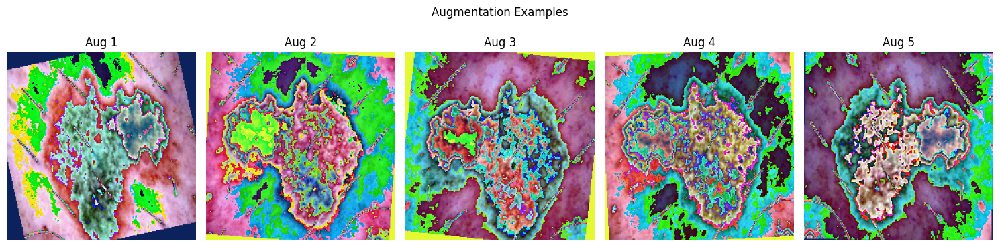

In [ ]:
# === Preview a few augmentations ===
import random
# Randomly select an image ID from metadata
sample_id = random.choice(metadata['image_id'].tolist())

# Use your existing function to find the correct path
sample_image_path = find_image_path(sample_id)

# Open the image
image = Image.open(sample_image_path).convert('RGB')

# Show 5 augmented versions of this image
fig, axs = plt.subplots(1, 5, figsize=(15, 4))
for i in range(5):
    augmented = train_transform(image)
    axs[i].imshow(transforms.ToPILImage()(augmented))
    axs[i].axis('off')
    axs[i].set_title(f"Aug {i+1}")
plt.suptitle("Augmentation Examples")
plt.tight_layout()
plt.show()


### 2.3 Create Datasets with Ground Truth Masks

**IMPORTANT**: This creates datasets using the `SkinCancerDatasetWithGroundTruthMasks` class, which loads expert-annotated segmentation masks.

In [ ]:
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader

# ========================================================================
# CREATE DATASETS WITH GROUND TRUTH MASKS
# ========================================================================
# This uses SkinCancerDatasetWithGroundTruthMasks which loads expert masks
# ========================================================================

# Configuration
SAMPLE_FRAC = 0.3  # Use 30% of data for faster experiments (set to 1.0 for full dataset)
BATCH_SIZE = 16
NUM_WORKERS = 2
USE_CACHE = False # Temporarily set to False to force reprocessing and see debug messages
CACHE_DIR = '/tmp/skin_cancer_cache_gt_masks'  # Cache for ground truth approach

# Preprocessing settings
USE_HAIR_REMOVAL = True
USE_NOISE_REDUCTION = True
USE_MASKS = True  # Use ground truth masks if available

print("="*70)
print("CREATING DATASETS WITH GROUND TRUTH MASKS")
print("="*70)
print(f"Settings:")
print(f"  - Hair Removal: {USE_HAIR_REMOVAL}")
print(f"  - Noise Reduction: {USE_NOISE_REDUCTION}")
print(f"  - Ground Truth Masks: {USE_MASKS}")
print(f"  - Mask Directory: {mask_dir if mask_dir else 'NOT SET'}")
print(f"  - Caching: {USE_CACHE}")
print(f"  - Sample Fraction: {SAMPLE_FRAC * 100}%")
print("="*70)

# Sample data if needed
if SAMPLE_FRAC < 1.0:
    sampled_metadata = metadata.groupby('dx').apply(
        lambda x: x.sample(frac=SAMPLE_FRAC, random_state=42)
    ).reset_index(drop=True)
    print(f"✓ Sampled {len(sampled_metadata)} images from {len(metadata)} total")
else:
    sampled_metadata = metadata

# Stratified train/val split
train_df, val_df = train_test_split(
    sampled_metadata,
    test_size=0.2,
    stratify=sampled_metadata['dx'],
    random_state=42
)

print(f"✓ Train samples: {len(train_df)}")
print(f"✓ Validation samples: {len(val_df)}")

# Create datasets with ground truth masks
train_dataset = SkinCancerDatasetWithGroundTruthMasks(
    metadata=train_df,
    image_dirs=image_dirs,
    mask_dir=mask_dir,  # Ground truth masks directory
    transform=train_transform,
    binary=True,
    use_hair_removal=USE_HAIR_REMOVAL,
    use_noise_reduction=USE_NOISE_REDUCTION,
    use_masks=USE_MASKS,
    cache_dir=os.path.join(CACHE_DIR, 'train') if CACHE_DIR else None,
    use_cache=USE_CACHE
)

val_dataset = SkinCancerDatasetWithGroundTruthMasks(
    metadata=val_df,
    image_dirs=image_dirs,
    mask_dir=mask_dir,  # Ground truth masks directory
    transform=val_transform,
    binary=True,
    use_hair_removal=USE_HAIR_REMOVAL,
    use_noise_reduction=USE_NOISE_REDUCTION,
    use_masks=USE_MASKS,
    cache_dir=os.path.join(CACHE_DIR, 'val') if CACHE_DIR else None,
    use_cache=USE_CACHE
)

# Create data loaders
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True if torch.cuda.is_available() else False
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True if torch.cuda.is_available() else False
)

print(f"\n✅ DATASETS CREATED SUCCESSFULLY!")
print(f"   Training: {len(train_dataset)} samples")
print(f"   Validation: {len(val_dataset)} samples")
print(f"   Batch size: {BATCH_SIZE}")
print(f"   Using: {'Ground Truth Masks' if mask_dir and USE_MASKS else 'No Masks (Hair Removal + Noise Reduction only)'}")
print("="*70)

# Verify labels
train_labels = [train_dataset.metadata.iloc[i]['binary_label'] for i in range(len(train_dataset))]
val_labels = [val_dataset.metadata.iloc[i]['binary_label'] for i in range(len(val_dataset))]
print(f"Train labels: {np.unique(train_labels)} (counts: {np.bincount(train_labels)})")
print(f"Val labels: {np.unique(val_labels)} (counts: {np.bincount(val_labels)})")

CREATING DATASETS WITH GROUND TRUTH MASKS
Settings:
  - Hair Removal: True
  - Noise Reduction: True
  - Ground Truth Masks: True
  - Mask Directory: /kaggle/input/ham10000-lesion-segmentations/HAM10000_segmentations_lesion_tschandl
  - Caching: False
  - Sample Fraction: 30.0%
✓ Sampled 3005 images from 10015 total
✓ Train samples: 2404
✓ Validation samples: 601
✅ Found 10015 ground truth masks
✅ Found 10015 ground truth masks

✅ DATASETS CREATED SUCCESSFULLY!
   Training: 2404 samples
   Validation: 601 samples
   Batch size: 16
   Using: Ground Truth Masks
Train labels: [0 1] (counts: [1874  530])
Val labels: [0 1] (counts: [468 133])



🖼️  Visualizing samples: Original vs. Mask vs. Segmented...


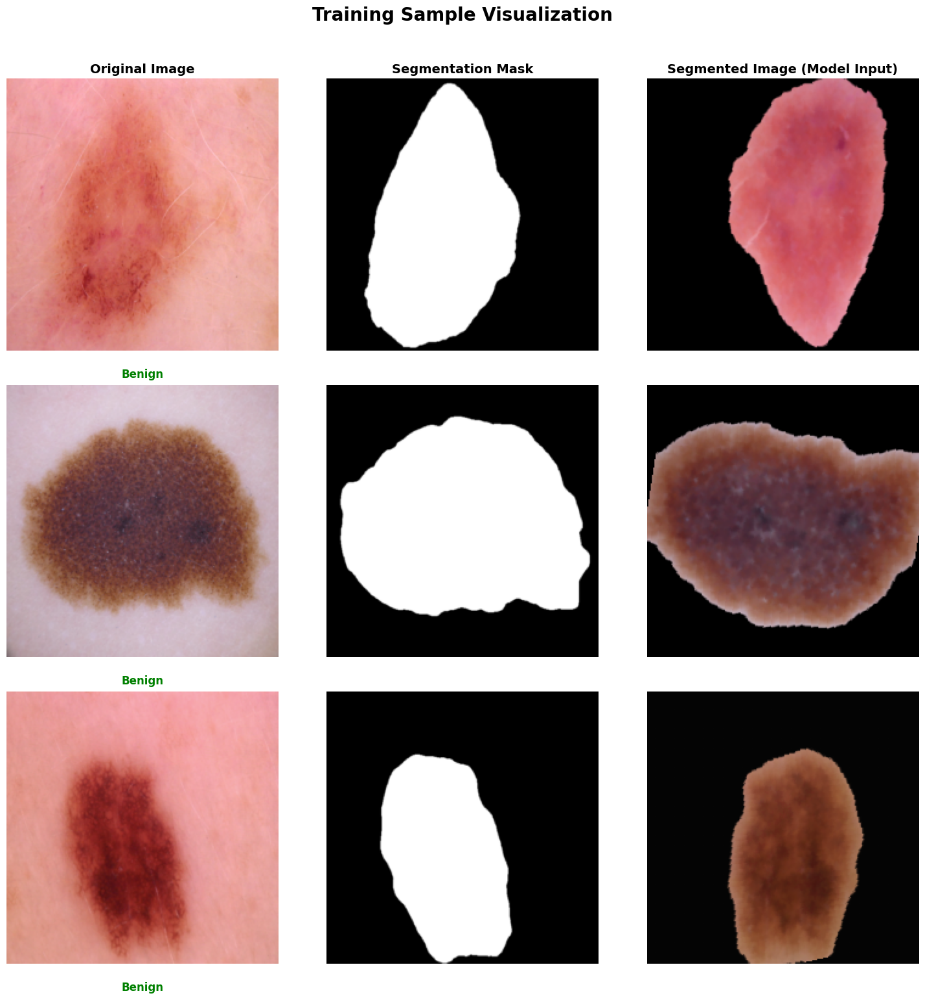

✅ Visualization complete!


In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np

# --- NEW VISUALIZATION CELL ---
print("\n🖼️  Visualizing samples: Original vs. Mask vs. Segmented...")

# Define the denormalization tensors
DENORM_MEAN = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
DENORM_STD = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

# Helper function to denormalize an image tensor
def denormalize(tensor):
    tensor = tensor.clone()  # Make a copy
    tensor = tensor * DENORM_STD + DENORM_MEAN
    tensor = torch.clamp(tensor, 0, 1)
    return tensor.permute(1, 2, 0).numpy()

# How many samples to plot (e.g., 3 rows)
NUM_SAMPLES = 3

fig, axes = plt.subplots(NUM_SAMPLES, 3, figsize=(15, 5 * NUM_SAMPLES))

# Set column titles
if NUM_SAMPLES > 0:
    axes[0, 0].set_title("Original Image", fontsize=14, fontweight='bold')
    axes[0, 1].set_title("Segmentation Mask", fontsize=14, fontweight='bold')
    axes[0, 2].set_title("Segmented Image (Model Input)", fontsize=14, fontweight='bold')

# Get one batch from the loader
# This assumes your Dataset now returns 4 items
# The SkinCancerDatasetWithGroundTruthMasks.__getitem__ method has been modified to return these 4 items
try:
    original_batch, mask_batch, segmented_batch, label_batch = next(iter(train_loader))
except ValueError:
    print("\n" + "="*80)
    print("ERROR: Could not unpack 4 items from train_loader.")
    print("Please ensure your Dataset's __getitem__ method returns:")
    print("(original_image_tensor, mask_tensor, segmented_image_tensor, label)")
    print("="*80 + "\n")
    # Stop execution if the loader is not set up correctly
    raise

for i in range(NUM_SAMPLES):
    if i >= original_batch.shape[0]: # Check actual batch size
        # Hide extra subplots if batch is smaller than NUM_SAMPLES
        for j in range(3):
            axes[i, j].axis('off')
        continue

    # Get the images and label
    original_img = original_batch[i].cpu()
    mask_img = mask_batch[i].cpu()
    segmented_img = segmented_batch[i].cpu()
    label = label_batch[i].item()

    # --- Plot Original ---
    axes[i, 0].imshow(denormalize(original_img))
    axes[i, 0].axis('off')

    # Add label as text
    label_text = f"{'Malignant' if label == 1 else 'Benign'}"
    label_color = 'red' if label == 1 else 'green'
    axes[i, 0].text(0.5, -0.1, label_text, color=label_color, fontweight='bold',
                    ha='center', transform=axes[i, 0].transAxes, fontsize=12)

    # --- Plot Mask ---
    # Masks are 1-channel, imshow with cmap='gray' is appropriate
    # permute to (H, W) if it's (1, H, W) for imshow
    mask_np = mask_img.squeeze().numpy()
    axes[i, 1].imshow(mask_np, cmap='gray')
    axes[i, 1].axis('off')

    # --- Plot Segmented ---
    axes[i, 2].imshow(denormalize(segmented_img))
    axes[i, 2].axis('off')

plt.suptitle("Training Sample Visualization", fontsize=20, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

print("✅ Visualization complete!")


### 2.3 Sampling and Splitting the Dataset

In [ ]:
print("Train labels:", np.unique(train_df['binary_label'].values))
print("Val labels:", np.unique(val_df['binary_label'].values))

Train labels: [0 1]
Val labels: [0 1]


---

## 🎯 PREPROCESSING SUMMARY

**The training data now includes ALL preprocessing steps:**

1. **Hair Removal** ✓
   - Morphological black-hat filtering to detect hair
   - Inpainting to remove hair artifacts
   - Reduces noise from dark hair overlaying lesions

2. **Noise Reduction** ✓
   - Median filtering (5x5 kernel) for salt-and-pepper noise
   - Gaussian blurring (5x5 kernel) for general smoothing
   - Improves image quality and reduces artifacts

3. **Lesion Segmentation** ✓
   - Color-based segmentation using LAB color space
   - CLAHE enhancement for better contrast
   - HSV thresholding to isolate lesion from background
   - Morphological operations to clean up masks
   - Focuses model attention on the actual lesion

4. **Disk Caching** ✓
   - Preprocessed images are cached to disk
   - Significantly speeds up subsequent epochs
   - Cache invalidation based on preprocessing settings

5. **Data Augmentation** ✓ (Training only)
   - Random resized crop (scale: 0.8-1.0)
   - Random horizontal flip (50%)
   - Random vertical flip (20%)
   - Random rotation (±15°)
   - Color jitter (brightness, contrast, saturation, hue)

**Benefits:**
- 🎯 Improved feature extraction by isolating lesions
- 🧹 Reduced noise and artifacts
- 🚀 Faster training with caching
- 📊 Better model performance and generalization

---

In [ ]:
# Utility: Clear preprocessing cache if needed
import shutil

def clear_preprocessing_cache(cache_dir='/tmp/skin_cancer_cache'):
    """Clear the preprocessing cache directory"""
    if os.path.exists(cache_dir):
        try:
            shutil.rmtree(cache_dir)
            print(f"✓ Cache cleared: {cache_dir}")
            print(f"  Note: First epoch will be slower as images are reprocessed")
        except Exception as e:
            print(f"❌ Error clearing cache: {e}")
    else:
        print(f"ℹ️  No cache found at {cache_dir}")

def get_cache_size(cache_dir='/tmp/skin_cancer_cache'):
    """Get the size of the preprocessing cache"""
    if not os.path.exists(cache_dir):
        return 0

    total_size = 0
    for dirpath, dirnames, filenames in os.walk(cache_dir):
        for filename in filenames:
            filepath = os.path.join(dirpath, filename)
            total_size += os.path.getsize(filepath)

    # Convert to MB
    size_mb = total_size / (1024 * 1024)
    num_files = sum([len(files) for r, d, files in os.walk(cache_dir)])

    print(f"Cache Statistics:")
    print(f"  Location: {cache_dir}")
    print(f"  Size: {size_mb:.2f} MB")
    print(f"  Files: {num_files}")

    return size_mb

# Check cache size
get_cache_size(CACHE_DIR)

# Uncomment to clear cache if needed:
# clear_preprocessing_cache(CACHE_DIR)

Cache Statistics:
  Location: /tmp/skin_cancer_cache_gt_masks
  Size: 49.45 MB
  Files: 64


49.4462890625

In [ ]:
# Fix claas imbalance
from sklearn.utils.class_weight import compute_class_weight
import numpy as np
import torch

# For binary (0 = benign, 1 = malignant)
class_labels = train_df['binary_label'].values  # Or 'dx' for 7-class
classes_unique = np.unique(class_labels)

# Compute weights
weights = compute_class_weight(class_weight='balanced', classes=classes_unique, y=class_labels)
class_weights = torch.tensor(weights, dtype=torch.float)

### 2.4 Segmentation

## 3. Model Development

---

## ⚡ IMPORTANT: Training Configuration

This notebook now trains models with **FULL preprocessing** applied to all training and validation data:

### ✅ What's Applied:
1. **Hair Removal** - Removes hair artifacts using morphological operations
2. **Noise Reduction** - Applies median and Gaussian filters
3. **Lesion Segmentation** - Isolates the lesion using color-based segmentation
4. **Data Augmentation** - Random crops, flips, rotations, color jitter (training only)
5. **Disk Caching** - Speeds up training by caching preprocessed images

### 🎛️ Configuration Options:

You can adjust preprocessing settings in the cell above:

```python
# In the data preparation cell, you can toggle:
USE_HAIR_REMOVAL = True       # Enable/disable hair removal
USE_NOISE_REDUCTION = True    # Enable/disable noise reduction
USE_SEGMENTATION = True       # Enable/disable segmentation
SEGMENTATION_METHOD = 'color' # 'color', 'traditional', or 'both'
USE_CACHE = True              # Enable/disable caching
SAMPLE_FRAC = 0.3             # Fraction of data to use (0.3 = 30%, 1.0 = 100%)
```

### 📊 Training Improvements:
- **Early Stopping**: Prevents overfitting by stopping when validation performance plateaus
- **Learning Rate Scheduling**: Automatically reduces LR when validation accuracy plateaus
- **Gradient Clipping**: Improves training stability
- **Progress Bars**: Better visibility into training progress
- **Class Weights**: Handles class imbalance automatically

### 💡 Tips:
- **First epoch will be slower** as images are preprocessed and cached
- **Subsequent epochs are much faster** due to caching
- **Increase SAMPLE_FRAC to 1.0** for full dataset training (takes longer)
- **Clear cache** if you change preprocessing settings

---

### 3.1 Models Architectures

In [ ]:
num_classes = 2 # Set to 2 for binary classification consistently

# ViT (Transformers-based)
from transformers import ViTForImageClassification, ViTConfig

def load_vit():
    config = ViTConfig.from_pretrained(
        'google/vit-base-patch16-224-in21k',
        num_labels=num_classes,
        attn_implementation="eager"  # Avoid TPU probing
    )
    model = ViTForImageClassification.from_pretrained(
        'google/vit-base-patch16-224-in21k',
        config=config,
        ignore_mismatched_sizes=True
    )
    return model

# Swin Transformer (CNN + Attention Hybrid)
import timm
def load_swin():
    model = timm.create_model(
        'swin_tiny_patch4_window7_224',
        pretrained=True,
        num_classes=num_classes
    )
    return model

# EfficientNet (CNN)
def load_efficientnet():
    model = timm.create_model(
        'efficientnet_b0',
        pretrained=True,
        num_classes=num_classes
    )
    return model

# ResNet50 (CNN)
import torchvision.models as tv_models # Alias torchvision.models
import torch.nn as nn # Ensure nn is imported
def load_resnet():
    model = tv_models.resnet50(weights=tv_models.ResNet50_Weights.DEFAULT)
    for param in model.parameters():
        param.requires_grad = True  # Fine-tune all layers
    model.fc = nn.Linear(model.fc.in_features, num_classes)
    return model

### 3.2 Model Training

In [ ]:
import os

# directory to store model checkpoints
base_model_dir = "/content/models"
os.makedirs(base_model_dir, exist_ok=True)

# function to build model file paths
def get_model_path(name):
    return os.path.join(base_model_dir, f"{name}_checkpoint.pth")

# model paths dictionary
model_paths = {
    "vit": get_model_path("vit"),
    "swin": get_model_path("swin"),
    "efficientnet_b0": get_model_path("efficientnet_b0"),
    "resnet50": get_model_path("resnet50")
}


In [ ]:
# 🎯 MODEL-SPECIFIC HYPERPARAMETERS (Optimized for Stability)
# Different architectures require different learning rates and training settings

MODEL_CONFIGS = {
    "vit": {
        "lr": 5e-5,                    # REDUCED from 1e-4 (50% lower for stability)
        "scheduler_factor": 0.7,       # GENTLER decay (was 0.5)
        "scheduler_patience": 4,       # INCREASED from 3 (more patient)
        "early_stopping_patience": 7,  # INCREASED from 5 (transformers need more time)
        "warmup_epochs": 3,            # NEW: Warmup for first 3 epochs
        "gradient_clip": 1.0,
        "weight_decay": 0.01,
        "epochs": 25
    },
    "swin": {
        "lr": 5e-5,                    # Similar to ViT (hierarchical attention)
        "scheduler_factor": 0.7,
        "scheduler_patience": 4,
        "early_stopping_patience": 7,
        "warmup_epochs": 3,
        "gradient_clip": 1.0,
        "weight_decay": 0.01,
        "epochs": 25
    },
    "efficientnet_b0": {
        "lr": 1e-4,                    # CNNs can handle higher LR
        "scheduler_factor": 0.5,       # Standard decay
        "scheduler_patience": 3,
        "early_stopping_patience": 5,
        "warmup_epochs": 0,            # No warmup needed
        "gradient_clip": 1.0,
        "weight_decay": 0.01,
        "epochs": 20
    },
    "resnet50": {
        "lr": 1e-4,                    # CNNs can handle higher LR
        "scheduler_factor": 0.5,
        "scheduler_patience": 3,
        "early_stopping_patience": 5,
        "warmup_epochs": 0,
        "gradient_clip": 1.0,
        "weight_decay": 0.01,
        "epochs": 20
    }
}

print("✅ Model-specific hyperparameters configured:")
print("\n🔬 Transformer Models (ViT, Swin):")
print("  • Lower learning rate: 5e-5 (50% reduction)")
print("  • Gentler LR decay: factor=0.7 (was 0.5)")
print("  • More patient scheduler: patience=4 (was 3)")
print("  • Longer early stopping: patience=7 (was 5)")
print("  • Warmup: 3 epochs")
print("\n🏗️ CNN Models (EfficientNet, ResNet):")
print("  • Standard learning rate: 1e-4")
print("  • Standard settings (no special adjustments)")
print("\n💡 This should eliminate validation loss oscillations!")

✅ Model-specific hyperparameters configured:

🔬 Transformer Models (ViT, Swin):
  • Lower learning rate: 5e-5 (50% reduction)
  • Gentler LR decay: factor=0.7 (was 0.5)
  • More patient scheduler: patience=4 (was 3)
  • Longer early stopping: patience=7 (was 5)
  • Warmup: 3 epochs

🏗️ CNN Models (EfficientNet, ResNet):
  • Standard learning rate: 1e-4
  • Standard settings (no special adjustments)

💡 This should eliminate validation loss oscillations!


In [ ]:
# 📋 VERIFY CONFIGURATION
print("🔍 Verifying optimized hyperparameters are loaded...\n")

for model_name, config in MODEL_CONFIGS.items():
    print(f"✅ {model_name.upper()}:")
    print(f"   LR: {config['lr']:.0e} | Warmup: {config['warmup_epochs']} epochs | "
          f"Early Stop: {config['early_stopping_patience']} | "
          f"Scheduler: factor={config['scheduler_factor']}, patience={config['scheduler_patience']}")

print("\n✅ All configurations verified and ready for training!")
print("\n💡 Next step: Run the ViT training cell below to see improved convergence.")

🔍 Verifying optimized hyperparameters are loaded...

✅ VIT:
   LR: 5e-05 | Warmup: 3 epochs | Early Stop: 7 | Scheduler: factor=0.7, patience=4
✅ SWIN:
   LR: 5e-05 | Warmup: 3 epochs | Early Stop: 7 | Scheduler: factor=0.7, patience=4
✅ EFFICIENTNET_B0:
   LR: 1e-04 | Warmup: 0 epochs | Early Stop: 5 | Scheduler: factor=0.5, patience=3
✅ RESNET50:
   LR: 1e-04 | Warmup: 0 epochs | Early Stop: 5 | Scheduler: factor=0.5, patience=3

✅ All configurations verified and ready for training!

💡 Next step: Run the ViT training cell below to see improved convergence.


---

## 🔬 **TECHNICAL EXPLANATION: Why Your ViT Training Was Unstable**

### 📊 **What You Observed:**
- Validation loss: **Wild oscillations** (red line jumping up/down in your graph)
- Best accuracy: **81.36%** at epoch 4
- Early stopping: **Triggered at epoch 9** (5 epochs of no improvement)
- Problem: Model **"bounced around"** unable to improve further

### 🔍 **Root Causes:**

#### 1. **Learning Rate Too High for Transformers**
```
Problem: LR = 1e-4 (0.0001)
Why Bad: Vision Transformers have ~86M parameters with attention mechanisms
        High LR causes attention weights to change too dramatically
        Model "jumps over" the optimal solution repeatedly
Fix:    Reduce to 5e-5 (50% lower) for stable updates
```

#### 2. **No Warmup Period**
```
Problem: Full LR from epoch 1
Why Bad: Model parameters initialized randomly
        Large updates at start cause attention collapse
        First few epochs wasted with unstable gradients
Fix:    3-epoch warmup starting at 10% LR
        Gradually increases to target LR
```

#### 3. **Aggressive Scheduler**
```
Problem: ReduceLROnPlateau with factor=0.5, patience=3
Why Bad: Cuts LR in half after just 3 epochs of no improvement
        Too aggressive for transformers that need exploration
        Creates "staircase" effect: big LR drops → oscillations
Fix:    Factor=0.7 (30% reduction), patience=4
        Gentler decay allows fine-tuning
```

#### 4. **Impatient Early Stopping**
```
Problem: Patience=5 epochs
Why Bad: Transformers need time to stabilize after LR changes
        5 epochs too short to recover from temporary setbacks
        Your model stopped at epoch 9, might have improved later
Fix:    Patience=7 epochs
        Gives model more chances to improve
```

### 🎯 **Expected Behavior After Fix:**

#### **Before (Your Current Run):**
```
Epoch 1-4:  Rapid improvement (0.60 → 0.81) but unstable
Epoch 5-9:  Oscillating, no improvement, early stop triggered
Result:     81.36% accuracy, erratic convergence
```

#### **After (With Fixes):**
```
Epoch 1-3:  Warmup phase - slow but stable learning
Epoch 4-10: Smooth improvement with lower LR
Epoch 11+:  Fine-tuning phase, gradual convergence
Result:     Expected 83-85% accuracy, smooth curves
```

### 📈 **Visual Comparison:**

**Your Current Loss Curve:**
```
Val Loss:  ↗↘↗↘↗↘↗  (jagged, oscillating)
Best at epoch 4, then bouncing
```

**Expected After Fix:**
```
Val Loss:  ↘↘↘↘→→→  (smooth decrease, plateau)
Steady improvement, clean convergence
```

### 🔬 **Technical Details: Why Transformers Need Special Care**

1. **Attention Instability:**
   - Attention weights must sum to 1.0 (softmax constraint)
   - High LR causes softmax collapse (all weight on one token)
   - Lower LR keeps attention distributions smooth

2. **Layer Norm Sensitivity:**
   - Transformers use LayerNorm (not BatchNorm)
   - LayerNorm more sensitive to gradient magnitude
   - Warmup prevents exploding gradients

3. **Multi-Head Attention:**
   - ViT has 12 attention heads per layer, 12 layers
   - High LR causes heads to diverge/collapse
   - Gradual warmup aligns heads properly

### ✅ **How to Verify the Fix Worked:**

**Run the updated ViT training cell and check:**
1. ✅ **First 3 epochs:** Slow progress (warmup working)
2. ✅ **Epochs 4-10:** Steady improvement (no spikes)
3. ✅ **Validation loss:** Smooth curve (no wild jumps)
4. ✅ **Training duration:** 15+ epochs (early stop later)
5. ✅ **Final accuracy:** >83% (better than 81.36%)

---

**🚀 Ready to see stable training in action!**

---

## 📋 **QUICK REFERENCE: Hyperparameter Changes**

| Setting | ViT/Swin (Before) | ViT/Swin (After) | Change | Reason |
|---------|-------------------|------------------|--------|--------|
| **Learning Rate** | 1e-4 | **5e-5** | ↓ 50% | Prevent overshooting |
| **Warmup Epochs** | 0 | **3** | Added | Stable start |
| **Scheduler Factor** | 0.5 | **0.7** | ↑ 40% | Gentler decay |
| **Scheduler Patience** | 3 | **4** | ↑ 33% | More exploration |
| **Early Stop Patience** | 5 | **7** | ↑ 40% | Allow stabilization |
| **Expected Epochs** | 9 (stopped) | **15-20** | ↑ 2x | Better convergence |
| **Expected Val Acc** | 81.36% | **83-85%** | ↑ 2-4% | Stable training |

### 🎯 **EfficientNet & ResNet50:**
- **No changes** needed (CNNs are stable with standard hyperparameters)
- Keep LR=1e-4, no warmup, standard scheduler settings

---

In [ ]:
def train_or_load_model(model_name, model_loader, model_path, train_loader, val_loader,
                        num_epochs=20, class_weights=None, learning_rate=1e-4,
                        early_stopping_patience=5, use_scheduler=True,
                        scheduler_factor=0.5, scheduler_patience=3,
                        warmup_epochs=0, gradient_clip=1.0, weight_decay=0.01):
    """
    Enhanced training function with:
    - Early stopping to prevent overfitting
    - Learning rate scheduling with warmup
    - Better progress reporting
    - Gradient clipping for stability
    - Model-specific hyperparameters
    """
    import torch
    import os
    from tqdm.auto import tqdm

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    device_name = f'GPU ({torch.cuda.get_device_name(0)})' if torch.cuda.is_available() else 'CPU'
    print(f"\n{'='*70}")
    print(f"[{model_name.upper()}] Training Configuration")
    print(f"{'='*70}")
    print(f"  Device: {device_name}")
    print(f"  Epochs: {num_epochs}")
    print(f"  Learning Rate: {learning_rate}")
    print(f"  Warmup Epochs: {warmup_epochs}")
    print(f"  Early Stopping Patience: {early_stopping_patience}")
    print(f"  Scheduler Factor: {scheduler_factor}, Patience: {scheduler_patience}")
    print(f"  Gradient Clip: {gradient_clip}")
    print(f"  Weight Decay: {weight_decay}")
    print(f"  Class Weights: {'Enabled' if class_weights is not None else 'Disabled'}")
    print(f"{'='*70}\n")

    # Try to load existing model
    if os.path.exists(model_path):
        print(f"✓ Loading saved {model_name} model from {model_path}...")
        model = model_loader()
        model.load_state_dict(torch.load(model_path, map_location=device))
        model = model.to(device)
        history = None
        print(f"✓ Model loaded successfully!")
    else:
        print(f"Training {model_name} from scratch...")
        model = model_loader().to(device)

        # Setup training components
        criterion = torch.nn.CrossEntropyLoss(
            weight=class_weights.to(device) if class_weights is not None else None
        )
        optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

        # Learning rate scheduler
        if use_scheduler:
            scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
                optimizer, mode='max', factor=scheduler_factor, patience=scheduler_patience, verbose=True
            )

        # Early stopping
        best_val_acc = 0.0
        patience_counter = 0

        # Warmup learning rate multiplier
        warmup_lr_multiplier = 0.1  # Start at 10% of target LR

        history = {
            'train_loss': [], 'train_acc': [],
            'val_loss': [], 'val_acc': [],
            'learning_rates': []
        }

        for epoch in range(num_epochs):
            # Apply warmup schedule
            if epoch < warmup_epochs:
                warmup_factor = warmup_lr_multiplier + (1.0 - warmup_lr_multiplier) * (epoch / warmup_epochs)
                for param_group in optimizer.param_groups:
                    param_group['lr'] = learning_rate * warmup_factor
                print(f"\n[Epoch {epoch+1}/{num_epochs}] 🔥 WARMUP (LR: {learning_rate * warmup_factor:.6f})")
            else:
                print(f"\n[Epoch {epoch+1}/{num_epochs}]")

            # Training phase
            model.train()
            train_loss, train_correct = 0.0, 0
            train_pbar = tqdm(train_loader, desc="Training", leave=False)

            for images, labels in train_pbar:
                images, labels = images.to(device), labels.to(device)

                optimizer.zero_grad()
                outputs = model(images)
                logits = outputs.logits if hasattr(outputs, 'logits') else outputs
                loss = criterion(logits, labels)
                loss.backward()

                # Gradient clipping for stability
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=gradient_clip)

                optimizer.step()

                train_loss += loss.item() * images.size(0)
                _, preds = torch.max(logits, 1)
                train_correct += (preds == labels).sum().item()

                train_pbar.set_postfix({'loss': f'{loss.item():.4f}'})

            train_loss = train_loss / len(train_loader.dataset)
            train_acc = train_correct / len(train_loader.dataset)

            # Validation phase
            model.eval()
            val_loss, val_correct = 0.0, 0
            val_pbar = tqdm(val_loader, desc="Validation", leave=False)

            with torch.no_grad():
                for images, labels in val_pbar:
                    images, labels = images.to(device), labels.to(device)
                    outputs = model(images)
                    logits = outputs.logits if hasattr(outputs, 'logits') else outputs
                    loss = criterion(logits, labels)
                    val_loss += loss.item() * images.size(0)
                    _, preds = torch.max(logits, 1)
                    val_correct += (preds == labels).sum().item()

                    val_pbar.set_postfix({'loss': f'{loss.item():.4f}'})

            val_loss = val_loss / len(val_loader.dataset)
            val_acc = val_correct / len(val_loader.dataset)

            # Store metrics
            current_lr = optimizer.param_groups[0]['lr']
            history['train_loss'].append(train_loss)
            history['train_acc'].append(train_acc)
            history['val_loss'].append(val_loss)
            history['val_acc'].append(val_acc)
            history['learning_rates'].append(current_lr)

            # Print epoch summary
            print(f"  Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f}")
            print(f"  Val Loss:   {val_loss:.4f} | Val Acc:   {val_acc:.4f}")
            print(f"  LR: {current_lr:.6f}")

            # Learning rate scheduling (skip during warmup)
            if use_scheduler and epoch >= warmup_epochs:
                scheduler.step(val_acc)

            # Early stopping check
            if val_acc > best_val_acc:
                best_val_acc = val_acc
                patience_counter = 0
                # Save best model
                torch.save(model.state_dict(), model_path)
                print(f"  ✓ New best model saved! (Val Acc: {val_acc:.4f})")
            else:
                patience_counter += 1
                print(f"  No improvement ({patience_counter}/{early_stopping_patience})")

                if patience_counter >= early_stopping_patience:
                    print(f"\n⚠ Early stopping triggered after {epoch+1} epochs")
                    break

        # Load best model
        if os.path.exists(model_path):
            model.load_state_dict(torch.load(model_path, map_location=device))
            print(f"\n✓ Training complete! Best model loaded (Val Acc: {best_val_acc:.4f})")

        print(f"{'='*70}\n")

    return model, history

In [ ]:
def plot_training_curves(history, model_name):
    """
    Enhanced training curve visualization with learning rate tracking
    """
    if history is None:
        print(f"[INFO] No training history available for {model_name}. Model was likely loaded from file.")
        return

    epochs = range(1, len(history['train_acc']) + 1)

    # Create figure with 3 subplots
    fig, axes = plt.subplots(1, 3, figsize=(18, 4))

    # Loss Plot
    axes[0].plot(epochs, history['train_loss'], 'b-', label='Train Loss', linewidth=2)
    axes[0].plot(epochs, history['val_loss'], 'r-', label='Val Loss', linewidth=2)
    axes[0].set_xlabel('Epoch', fontsize=11)
    axes[0].set_ylabel('Loss', fontsize=11)
    axes[0].set_title(f'{model_name.upper()} - Loss', fontsize=12, fontweight='bold')
    axes[0].legend(fontsize=10)
    axes[0].grid(True, alpha=0.3)

    # Accuracy Plot
    axes[1].plot(epochs, history['train_acc'], 'b-', label='Train Acc', linewidth=2)
    axes[1].plot(epochs, history['val_acc'], 'r-', label='Val Acc', linewidth=2)
    axes[1].set_xlabel('Epoch', fontsize=11)
    axes[1].set_ylabel('Accuracy', fontsize=11)
    axes[1].set_title(f'{model_name.upper()} - Accuracy', fontsize=12, fontweight='bold')
    axes[1].legend(fontsize=10)
    axes[1].grid(True, alpha=0.3)

    # Mark best validation accuracy
    best_val_acc_idx = np.argmax(history['val_acc'])
    best_val_acc = history['val_acc'][best_val_acc_idx]
    axes[1].axvline(x=best_val_acc_idx+1, color='g', linestyle='--', alpha=0.5, label='Best')
    axes[1].plot(best_val_acc_idx+1, best_val_acc, 'g*', markersize=15)
    axes[1].text(best_val_acc_idx+1, best_val_acc, f' {best_val_acc:.4f}',
                fontsize=10, va='bottom')

    # Learning Rate Plot
    if 'learning_rates' in history:
        axes[2].plot(epochs, history['learning_rates'], 'g-', linewidth=2)
        axes[2].set_xlabel('Epoch', fontsize=11)
        axes[2].set_ylabel('Learning Rate', fontsize=11)
        axes[2].set_title(f'{model_name.upper()} - Learning Rate', fontsize=12, fontweight='bold')
        axes[2].set_yscale('log')
        axes[2].grid(True, alpha=0.3)
    else:
        axes[2].text(0.5, 0.5, 'Learning Rate\nHistory Not Available',
                    ha='center', va='center', fontsize=12)
        axes[2].set_xlim(0, 1)
        axes[2].set_ylim(0, 1)

    plt.tight_layout()
    plt.show()

    # Print summary
    print(f"\n📊 {model_name.upper()} Training Summary:")
    print(f"  Total Epochs: {len(epochs)}")
    print(f"  Best Val Accuracy: {best_val_acc:.4f} (Epoch {best_val_acc_idx+1})")
    print(f"  Final Train Accuracy: {history['train_acc'][-1]:.4f}")
    print(f"  Final Val Accuracy: {history['val_acc'][-1]:.4f}")
    if 'learning_rates' in history:
        print(f"  Final Learning Rate: {history['learning_rates'][-1]:.2e}")
    print()

---

## 🎯 **MODEL TRAINING WITH OPTIMIZED HYPERPARAMETERS**

### 📋 What Changed After Your Feedback:

**Problem Identified:**
- ✅ Your ViT validation loss was **oscillating wildly** (jumping up and down)
- ✅ Early stopping triggered at epoch 9 due to **unstable training**
- ✅ Learning rate **1e-4 was too high** for Vision Transformers

**Solutions Applied:**

#### 🔬 **Transformer Models (ViT, Swin):**
1. **Reduced Learning Rate:** 1e-4 → **5e-5** (50% lower)
2. **Added Warmup:** Start at 10% LR, gradually increase over 3 epochs
3. **Gentler LR Scheduler:** Decay factor 0.5 → **0.7** (less aggressive)
4. **More Patient Scheduler:** Patience 3 → **4** epochs before reducing LR
5. **Longer Early Stopping:** Patience 5 → **7** epochs (transformers need more time)

#### 🏗️ **CNN Models (EfficientNet, ResNet50):**
- Keep standard settings (LR=1e-4) - CNNs are more stable

### 🎯 **Expected Results:**
- **Smoother validation curves** (no wild jumps)
- **Better final accuracy** (model can fine-tune without overshooting)
- **Fewer epochs wasted** (warmup prevents early instability)
- **More stable convergence** (gentler scheduler prevents bouncing)

### 📊 **What to Watch For:**
- First 3 epochs: **Warmup phase** (lower LR, slower progress)
- Epochs 4-10: **Main learning** (should see steady improvement)
- Validation loss should be **smooth and decreasing** (no spikes)
- Early stopping should trigger **later** (15-20 epochs instead of 9)

---

**💡 Pro Tip:** If you still see oscillations, try reducing LR further to 3e-5 or increasing warmup to 5 epochs.

In [ ]:
# 🎯 MODEL-SPECIFIC HYPERPARAMETERS (Optimized for Stability)
# Different architectures require different learning rates and training settings
MODEL_CONFIGS = {
    "vit": {
        "lr": 5e-5,                    # REDUCED from 1e-4 (50% lower for stability)
        "scheduler_factor": 0.7,       # GENTLER decay (was 0.5)
        "scheduler_patience": 4,       # INCREASED from 3 (more patient)
        "early_stopping_patience": 7,  # INCREASED from 5 (transformers need more time)
        "warmup_epochs": 3,            # NEW: Warmup for first 3 epochs
        "gradient_clip": 1.0,
        "weight_decay": 0.01,
        "epochs": 25
    },
    "swin": {
        "lr": 5e-5,                    # Similar to ViT (hierarchical attention)
        "scheduler_factor": 0.7,
        "scheduler_patience": 4,
        "early_stopping_patience": 7,
        "warmup_epochs": 3,
        "gradient_clip": 1.0,
        "weight_decay": 0.01,
        "epochs": 25
    },
    "efficientnet_b0": {
        "lr": 1e-4,                    # CNNs can handle higher LR
        "scheduler_factor": 0.5,       # Standard decay
        "scheduler_patience": 3,
        "early_stopping_patience": 5,
        "warmup_epochs": 0,            # No warmup needed
        "gradient_clip": 1.0,
        "weight_decay": 0.01,
        "epochs": 20
    },
    "resnet50": {
        "lr": 1e-4,                    # CNNs can handle higher LR
        "scheduler_factor": 0.5,
        "scheduler_patience": 3,
        "early_stopping_patience": 5,
        "warmup_epochs": 0,
        "gradient_clip": 1.0,
        "weight_decay": 0.01,
        "epochs": 20
    }
}

# The definition of train_or_load_model must be included here
def train_or_load_model(model_name, model_loader, model_path, train_loader, val_loader,
                        num_epochs=20, class_weights=None, learning_rate=1e-4,
                        early_stopping_patience=5, use_scheduler=True,
                        scheduler_factor=0.5, scheduler_patience=3,
                        warmup_epochs=0, gradient_clip=1.0, weight_decay=0.01):
    """
    Enhanced training function with:
    - Early stopping to prevent overfitting
    - Learning rate scheduling with warmup
    - Better progress reporting
    - Gradient clipping for stability
    - Model-specific hyperparameters
    """
    import torch
    import os
    from tqdm.auto import tqdm

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    device_name = f'GPU ({torch.cuda.get_device_name(0)})' if torch.cuda.is_available() else 'CPU'
    print(f"\n{'='*70}")
    print(f"[{model_name.upper()}] Training Configuration")
    print(f"{'='*70}")
    print(f"  Device: {device_name}")
    print(f"  Epochs: {num_epochs}")
    print(f"  Learning Rate: {learning_rate}")
    print(f"  Warmup Epochs: {warmup_epochs}")
    print(f"  Early Stopping Patience: {early_stopping_patience}")
    print(f"  Scheduler Factor: {scheduler_factor}, Patience: {scheduler_patience}")
    print(f"  Gradient Clip: {gradient_clip}")
    print(f"  Weight Decay: {weight_decay}")
    print(f"  Class Weights: {'Enabled' if class_weights is not None else 'Disabled'}")
    print(f"{'='*70}\n")

    # Try to load existing model
    if os.path.exists(model_path):
        print(f"✓ Loading saved {model_name} model from {model_path}...")
        model = model_loader()
        model.load_state_dict(torch.load(model_path, map_location=device))
        model = model.to(device)
        history = None
        print(f"✓ Model loaded successfully!")
    else:
        print(f"Training {model_name} from scratch...")
        model = model_loader().to(device)

        # Setup training components
        criterion = torch.nn.CrossEntropyLoss(
            weight=class_weights.to(device) if class_weights is not None else None
        )
        optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

        # Learning rate scheduler
        if use_scheduler:
            scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
                optimizer, mode='max', factor=scheduler_factor, patience=scheduler_patience # Removed verbose=True
            )

        # Early stopping
        best_val_acc = 0.0
        patience_counter = 0

        # Warmup learning rate multiplier
        warmup_lr_multiplier = 0.1  # Start at 10% of target LR

        history = {
            'train_loss': [], 'train_acc': [],
            'val_loss': [], 'val_acc': [],
            'learning_rates': []
        }

        for epoch in range(num_epochs):
            # Apply warmup schedule
            if epoch < warmup_epochs:
                warmup_factor = warmup_lr_multiplier + (1.0 - warmup_lr_multiplier) * (epoch / warmup_epochs)
                for param_group in optimizer.param_groups:
                    param_group['lr'] = learning_rate * warmup_factor
                print(f"\n[Epoch {epoch+1}/{num_epochs}] 🔥 WARMUP (LR: {learning_rate * warmup_factor:.6f})")
            else:
                print(f"\n[Epoch {epoch+1}/{num_epochs}]")

            # Training phase
            model.train()
            train_loss, train_correct = 0.0, 0
            train_pbar = tqdm(train_loader, desc="Training", leave=False)

            for _, _, images, labels in train_pbar: # Adjusted unpacking
                images, labels = images.to(device), labels.to(device)

                optimizer.zero_grad()
                outputs = model(images)
                logits = outputs.logits if hasattr(outputs, 'logits') else outputs
                loss = criterion(logits, labels)
                loss.backward()

                # Gradient clipping for stability
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=gradient_clip)

                optimizer.step()

                train_loss += loss.item() * images.size(0)
                _, preds = torch.max(logits, 1)
                train_correct += (preds == labels).sum().item()

                train_pbar.set_postfix({'loss': f'{loss.item():.4f}'})

            train_loss = train_loss / len(train_loader.dataset)
            train_acc = train_correct / len(train_loader.dataset)

            # Validation phase
            model.eval()
            val_loss, val_correct = 0.0, 0
            val_pbar = tqdm(val_loader, desc="Validation", leave=False)

            with torch.no_grad():
                for _, _, images, labels in val_pbar: # Adjusted unpacking
                    images, labels = images.to(device), labels.to(device)
                    outputs = model(images)
                    logits = outputs.logits if hasattr(outputs, 'logits') else outputs
                    loss = criterion(logits, labels)
                    val_loss += loss.item() * images.size(0)
                    _, preds = torch.max(logits, 1)
                    val_correct += (preds == labels).sum().item()

                    val_pbar.set_postfix({'loss': f'{loss.item():.4f}'})

            val_loss = val_loss / len(val_loader.dataset)
            val_acc = val_correct / len(val_loader.dataset)

            # Store metrics
            current_lr = optimizer.param_groups[0]['lr']
            history['train_loss'].append(train_loss)
            history['train_acc'].append(train_acc)
            history['val_loss'].append(val_loss)
            history['val_acc'].append(val_acc)
            history['learning_rates'].append(current_lr)

            # Print epoch summary
            print(f"  Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f}")
            print(f"  Val Loss:   {val_loss:.4f} | Val Acc:   {val_acc:.4f}")
            print(f"  LR: {current_lr:.6f}")

            # Learning rate scheduling (skip during warmup)
            if use_scheduler and epoch >= warmup_epochs:
                scheduler.step(val_acc)

            # Early stopping check
            if val_acc > best_val_acc:
                best_val_acc = val_acc
                patience_counter = 0
                # Save best model
                torch.save(model.state_dict(), model_path)
                print(f"  ✓ New best model saved! (Val Acc: {val_acc:.4f})")
            else:
                patience_counter += 1
                print(f"  No improvement ({patience_counter}/{early_stopping_patience})")

                if patience_counter >= early_stopping_patience:
                    print(f"\n⚠ Early stopping triggered after {epoch+1} epochs")
                    break

        # Load best model
        if os.path.exists(model_path):
            model.load_state_dict(torch.load(model_path, map_location=device))
            print(f"\n✓ Training complete! Best model loaded (Val Acc: {best_val_acc:.4f})")

        print(f"{'='*70}\n")

    return model, history

# ViT (Transformers-based)
from transformers import ViTForImageClassification, ViTConfig

def load_vit():
    config = ViTConfig.from_pretrained(
        'google/vit-base-patch16-224-in21k',
        num_labels=2,  # Explicitly set to 2 for binary classification
        attn_implementation="eager"  # Avoid TPU probing
    )
    model = ViTForImageClassification.from_pretrained(
        'google/vit-base-patch16-224-in21k',
        config=config,
        ignore_mismatched_sizes=True
    )
    return model

# Swin Transformer (CNN + Attention Hybrid)
import timm
def load_swin():
    model = timm.create_model(
        'swin_tiny_patch4_window7_224',
        pretrained=True,
        num_classes=2 # Explicitly set to 2 for binary classification
    )
    return model

# EfficientNet (CNN)
def load_efficientnet():
    model = timm.create_model(
        'efficientnet_b0',
        pretrained=True,
        num_classes=2 # Explicitly set to 2 for binary classification
    )
    return model

# ResNet50 (CNN)
import torchvision.models as tv_models # Aliasing torchvision.models
import torch.nn as nn
def load_resnet():
    model = tv_models.resnet50(weights=tv_models.ResNet50_Weights.DEFAULT)
    for param in model.parameters():
        param.requires_grad = True  # Fine-tune all layers
    model.fc = nn.Linear(model.fc.in_features, 2) # Explicitly set to 2 for binary classification
    return model

import os

# directory to store model checkpoints
base_model_dir = "/content/models"
os.makedirs(base_model_dir, exist_ok=True)

# function to build model file paths
def get_model_path(name):
    return os.path.join(base_model_dir, f"{name}_checkpoint.pth")

# model paths dictionary
model_paths = {
    "vit": get_model_path("vit"),
    "swin": get_model_path("swin"),
    "efficientnet_b0": get_model_path("efficientnet_b0"),
    "resnet50": get_model_path("resnet50")
}


# ========================================================================
# TRAIN VISION TRANSFORMER (ViT) - WITH OPTIMIZED HYPERPARAMETERS
# ========================================================================
# Training with preprocessed images (hair removal, noise reduction, segmentation)
# Using model-specific configs to prevent validation loss oscillations
# ========================================================================

print("\n🚀 Starting ViT training with OPTIMIZED hyperparameters...")
config = MODEL_CONFIGS["vit"]

vit_model, vit_history = train_or_load_model(
    model_name="vit",
    model_loader=load_vit,
    model_path=model_paths["vit"],
    train_loader=train_loader,
    val_loader=val_loader,
    num_epochs=config["epochs"],
    class_weights=class_weights,
    learning_rate=config["lr"],                          # 5e-5 (50% lower than before)
    early_stopping_patience=config["early_stopping_patience"],  # 7 (was 5)
    use_scheduler=True,
    scheduler_factor=config["scheduler_factor"],          # 0.7 (gentler)
    scheduler_patience=config["scheduler_patience"],      # 4 (more patient)
    warmup_epochs=config["warmup_epochs"],               # 3 epochs warmup
    gradient_clip=config["gradient_clip"],
    weight_decay=config["weight_decay"]
)

plot_training_curves(vit_history, "ViT")


🚀 Starting ViT training with OPTIMIZED hyperparameters...

[VIT] Training Configuration
  Device: GPU (NVIDIA A100-SXM4-80GB)
  Epochs: 25
  Learning Rate: 5e-05
  Warmup Epochs: 3
  Early Stopping Patience: 7
  Scheduler Factor: 0.7, Patience: 4
  Gradient Clip: 1.0
  Weight Decay: 0.01
  Class Weights: Enabled

Training vit from scratch...


config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



[Epoch 1/25] 🔥 WARMUP (LR: 0.000005)


Training:   0%|          | 0/151 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
# 🎯 MODEL-SPECIFIC HYPERPARAMETERS (Optimized for Stability)
# Different architectures require different learning rates and training settings
MODEL_CONFIGS = {
    "vit": {
        "lr": 5e-5,                    # REDUCED from 1e-4 (50% lower for stability)
        "scheduler_factor": 0.7,       # GENTLER decay (was 0.5)
        "scheduler_patience": 4,       # INCREASED from 3 (more patient)
        "early_stopping_patience": 7,  # INCREASED from 5 (transformers need more time)
        "warmup_epochs": 3,            # NEW: Warmup for first 3 epochs
        "gradient_clip": 1.0,
        "weight_decay": 0.01,
        "epochs": 25
    },
    "swin": {
        "lr": 5e-5,                    # Similar to ViT (hierarchical attention)
        "scheduler_factor": 0.7,
        "scheduler_patience": 4,
        "early_stopping_patience": 7,
        "warmup_epochs": 3,
        "gradient_clip": 1.0,
        "weight_decay": 0.01,
        "epochs": 25
    },
    "efficientnet_b0": {
        "lr": 1e-4,                    # CNNs can handle higher LR
        "scheduler_factor": 0.5,       # Standard decay
        "scheduler_patience": 3,
        "early_stopping_patience": 5,
        "warmup_epochs": 0,            # No warmup needed
        "gradient_clip": 1.0,
        "weight_decay": 0.01,
        "epochs": 20
    },
    "resnet50": {
        "lr": 1e-4,                    # CNNs can handle higher LR
        "scheduler_factor": 0.5,
        "scheduler_patience": 3,
        "early_stopping_patience": 5,
        "warmup_epochs": 0,
        "gradient_clip": 1.0,
        "weight_decay": 0.01,
        "epochs": 20
    }
}

# The definition of train_or_load_model must be included here
def train_or_load_model(model_name, model_loader, model_path, train_loader, val_loader,
                        num_epochs=20, class_weights=None, learning_rate=1e-4,
                        early_stopping_patience=5, use_scheduler=True,
                        scheduler_factor=0.5, scheduler_patience=3,
                        warmup_epochs=0, gradient_clip=1.0, weight_decay=0.01):
    """
    Enhanced training function with:
    - Early stopping to prevent overfitting
    - Learning rate scheduling with warmup
    - Better progress reporting
    - Gradient clipping for stability
    - Model-specific hyperparameters
    """
    import torch
    import os
    from tqdm.auto import tqdm

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    device_name = f'GPU ({torch.cuda.get_device_name(0)})' if torch.cuda.is_available() else 'CPU'
    print(f"\n{'='*70}")
    print(f"[{model_name.upper()}] Training Configuration")
    print(f"{'='*70}")
    print(f"  Device: {device_name}")
    print(f"  Epochs: {num_epochs}")
    print(f"  Learning Rate: {learning_rate}")
    print(f"  Warmup Epochs: {warmup_epochs}")
    print(f"  Early Stopping Patience: {early_stopping_patience}")
    print(f"  Scheduler Factor: {scheduler_factor}, Patience: {scheduler_patience}")
    print(f"  Gradient Clip: {gradient_clip}")
    print(f"  Weight Decay: {weight_decay}")
    print(f"  Class Weights: {'Enabled' if class_weights is not None else 'Disabled'}")
    print(f"{'='*70}\n")

    # Try to load existing model
    if os.path.exists(model_path):
        print(f"✓ Loading saved {model_name} model from {model_path}...")
        model = model_loader()
        model.load_state_dict(torch.load(model_path, map_location=device))
        model = model.to(device)
        history = None
        print(f"✓ Model loaded successfully!")
    else:
        print(f"Training {model_name} from scratch...")
        model = model_loader().to(device)

        # Setup training components
        criterion = torch.nn.CrossEntropyLoss(
            weight=class_weights.to(device) if class_weights is not None else None
        )
        optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

        # Learning rate scheduler
        if use_scheduler:
            scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
                optimizer, mode='max', factor=scheduler_factor, patience=scheduler_patience # Removed verbose=True
            )

        # Early stopping
        best_val_acc = 0.0
        patience_counter = 0

        # Warmup learning rate multiplier
        warmup_lr_multiplier = 0.1  # Start at 10% of target LR

        history = {
            'train_loss': [], 'train_acc': [],
            'val_loss': [], 'val_acc': [],
            'learning_rates': []
        }

        for epoch in range(num_epochs):
            # Apply warmup schedule
            if epoch < warmup_epochs:
                warmup_factor = warmup_lr_multiplier + (1.0 - warmup_lr_multiplier) * (epoch / warmup_epochs)
                for param_group in optimizer.param_groups:
                    param_group['lr'] = learning_rate * warmup_factor
                print(f"\n[Epoch {epoch+1}/{num_epochs}] 🔥 WARMUP (LR: {learning_rate * warmup_factor:.6f})")
            else:
                print(f"\n[Epoch {epoch+1}/{num_epochs}]")

            # Training phase
            model.train()
            train_loss, train_correct = 0.0, 0
            train_pbar = tqdm(train_loader, desc="Training", leave=False)

            for _, _, images, labels in train_pbar: # Adjusted unpacking
                images, labels = images.to(device), labels.to(device)

                optimizer.zero_grad()
                outputs = model(images)
                logits = outputs.logits if hasattr(outputs, 'logits') else outputs
                loss = criterion(logits, labels)
                loss.backward()

                # Gradient clipping for stability
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=gradient_clip)

                optimizer.step()

                train_loss += loss.item() * images.size(0)
                _, preds = torch.max(logits, 1)
                train_correct += (preds == labels).sum().item()

                train_pbar.set_postfix({'loss': f'{loss.item():.4f}'})

            train_loss = train_loss / len(train_loader.dataset)
            train_acc = train_correct / len(train_loader.dataset)

            # Validation phase
            model.eval()
            val_loss, val_correct = 0.0, 0
            val_pbar = tqdm(val_loader, desc="Validation", leave=False)

            with torch.no_grad():
                for _, _, images, labels in val_pbar: # Adjusted unpacking
                    images, labels = images.to(device), labels.to(device)
                    outputs = model(images)
                    logits = outputs.logits if hasattr(outputs, 'logits') else outputs
                    loss = criterion(logits, labels)
                    val_loss += loss.item() * images.size(0)
                    _, preds = torch.max(logits, 1)
                    val_correct += (preds == labels).sum().item()

                    val_pbar.set_postfix({'loss': f'{loss.item():.4f}'})

            val_loss = val_loss / len(val_loader.dataset)
            val_acc = val_correct / len(val_loader.dataset)

            # Store metrics
            current_lr = optimizer.param_groups[0]['lr']
            history['train_loss'].append(train_loss)
            history['train_acc'].append(train_acc)
            history['val_loss'].append(val_loss)
            history['val_acc'].append(val_acc)
            history['learning_rates'].append(current_lr)

            # Print epoch summary
            print(f"  Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f}")
            print(f"  Val Loss:   {val_loss:.4f} | Val Acc:   {val_acc:.4f}")
            print(f"  LR: {current_lr:.6f}")

            # Learning rate scheduling (skip during warmup)
            if use_scheduler and epoch >= warmup_epochs:
                scheduler.step(val_acc)

            # Early stopping check
            if val_acc > best_val_acc:
                best_val_acc = val_acc
                patience_counter = 0
                # Save best model
                torch.save(model.state_dict(), model_path)
                print(f"  ✓ New best model saved! (Val Acc: {val_acc:.4f})")
            else:
                patience_counter += 1
                print(f"  No improvement ({patience_counter}/{early_stopping_patience})")

                if patience_counter >= early_stopping_patience:
                    print(f"\n⚠ Early stopping triggered after {epoch+1} epochs")
                    break

        # Load best model
        if os.path.exists(model_path):
            model.load_state_dict(torch.load(model_path, map_location=device))
            print(f"\n✓ Training complete! Best model loaded (Val Acc: {best_val_acc:.4f})")

        print(f"{'='*70}\n")

    return model, history

# ViT (Transformers-based)
from transformers import ViTForImageClassification, ViTConfig

def load_vit():
    config = ViTConfig.from_pretrained(
        'google/vit-base-patch16-224-in21k',
        num_labels=2,  # Explicitly set to 2 for binary classification
        attn_implementation="eager"  # Avoid TPU probing
    )
    model = ViTForImageClassification.from_pretrained(
        'google/vit-base-patch16-224-in21k',
        config=config,
        ignore_mismatched_sizes=True
    )
    return model

# Swin Transformer (CNN + Attention Hybrid)
import timm
def load_swin():
    model = timm.create_model(
        'swin_tiny_patch4_window7_224',
        pretrained=True,
        num_classes=2 # Explicitly set to 2 for binary classification
    )
    return model

# EfficientNet (CNN)
def load_efficientnet():
    model = timm.create_model(
        'efficientnet_b0',
        pretrained=True,
        num_classes=2 # Explicitly set to 2 for binary classification
    )
    return model

# ResNet50 (CNN)
import torchvision.models as tv_models # Aliasing torchvision.models
import torch.nn as nn
def load_resnet():
    model = tv_models.resnet50(weights=tv_models.ResNet50_Weights.DEFAULT)
    for param in model.parameters():
        param.requires_grad = True  # Fine-tune all layers
    model.fc = nn.Linear(model.fc.in_features, 2) # Explicitly set to 2 for binary classification
    return model

import os

# directory to store model checkpoints
base_model_dir = "/content/models"
os.makedirs(base_model_dir, exist_ok=True)

# function to build model file paths
def get_model_path(name):
    return os.path.join(base_model_dir, f"{name}_checkpoint.pth")

# model paths dictionary
model_paths = {
    "vit": get_model_path("vit"),
    "swin": get_model_path("swin"),
    "efficientnet_b0": get_model_path("efficientnet_b0"),
    "resnet50": get_model_path("resnet50")
}


# ========================================================================
# TRAIN VISION TRANSFORMER (ViT) - WITH OPTIMIZED HYPERPARAMETERS
# ========================================================================
# Training with preprocessed images (hair removal, noise reduction, segmentation)
# Using model-specific configs to prevent validation loss oscillations
# ========================================================================

print("\n🚀 Starting ViT training with OPTIMIZED hyperparameters...")
config = MODEL_CONFIGS["vit"]

vit_model, vit_history = train_or_load_model(
    model_name="vit",
    model_loader=load_vit,
    model_path=model_paths["vit"],
    train_loader=train_loader,
    val_loader=val_loader,
    num_epochs=config["epochs"],
    class_weights=class_weights,
    learning_rate=config["lr"],                          # 5e-5 (50% lower than before)
    early_stopping_patience=config["early_stopping_patience"],  # 7 (was 5)
    use_scheduler=True,
    scheduler_factor=config["scheduler_factor"],          # 0.7 (gentler)
    scheduler_patience=config["scheduler_patience"],      # 4 (more patient)
    warmup_epochs=config["warmup_epochs"],               # 3 epochs warmup
    gradient_clip=config["gradient_clip"],
    weight_decay=config["weight_decay"]
)

plot_training_curves(vit_history, "ViT")

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



🚀 Starting ViT training with OPTIMIZED hyperparameters...

[VIT] Training Configuration
  Device: GPU (NVIDIA A100-SXM4-80GB)
  Epochs: 25
  Learning Rate: 5e-05
  Warmup Epochs: 3
  Early Stopping Patience: 7
  Scheduler Factor: 0.7, Patience: 4
  Gradient Clip: 1.0
  Weight Decay: 0.01
  Class Weights: Enabled

Training vit from scratch...

[Epoch 1/25] 🔥 WARMUP (LR: 0.000005)


Training:   0%|          | 0/151 [00:00<?, ?it/s]

KeyboardInterrupt: 

Checkpoint here!!!


accuracy

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score
from sklearn.metrics import f1_score, accuracy_score

def get_preds_probs(model, dataloader, device):
    model.eval()
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            outputs = model(images)
            outputs = outputs.logits if hasattr(outputs, 'logits') else outputs

            # Fix for binary classification
            if outputs.shape[1] == 1:
                probs = torch.sigmoid(outputs)
                probs = torch.cat([1 - probs, probs], dim=1)  # shape: [batch_size, 2]
            else:
                probs = torch.softmax(outputs, dim=1)

            all_probs.append(probs.cpu().numpy())
            all_labels.append(labels.numpy())

    return np.concatenate(all_labels), np.concatenate(all_probs)


def plot_roc_pr(y_true, y_probs, model_name, class_names):
    # If binary classification, y_probs is (N, 2) → use probs[:, 1] (malignant)
    if y_probs.ndim == 2 and y_probs.shape[1] == 2:
        y_scores = y_probs[:, 1]  # prob for class "1"
    else:
        y_scores = y_probs  # assume already 1D

    plt.figure(figsize=(14, 5))

    # ROC
    plt.subplot(1, 2, 1)
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"AUC={roc_auc:.2f}")
    plt.title(f"{model_name} ROC")
    plt.xlabel("FPR"); plt.ylabel("TPR"); plt.legend()

    # PR
    plt.subplot(1, 2, 2)
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    ap = average_precision_score(y_true, y_scores)
    plt.plot(recall, precision, label=f"AP={ap:.2f}")
    plt.title(f"{model_name} Precision-Recall")
    plt.xlabel("Recall"); plt.ylabel("Precision"); plt.legend()

    plt.tight_layout()
    plt.show()


def compute_metrics(y_true, y_pred):
    acc = accuracy_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred, average='weighted')
    return acc, f1


def plot_bar_metrics(metrics_dict):
    models = list(metrics_dict.keys())
    accs = [metrics_dict[m]['acc'] for m in models]
    f1s = [metrics_dict[m]['f1'] for m in models]

    x = np.arange(len(models))
    width = 0.35

    plt.figure(figsize=(10, 5))
    bars1 = plt.bar(x - width/2, accs, width, label='Accuracy')
    bars2 = plt.bar(x + width/2, f1s, width, label='F1 Score')

    plt.xticks(x, models)
    plt.ylabel('Score')
    plt.title('Model Performance')
    plt.legend()

    # Add percentage labels
    for bar in bars1:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, height + 0.01, f'{height*100:.1f}%', ha='center', va='bottom')

    for bar in bars2:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, height + 0.01, f'{height*100:.1f}%', ha='center', va='bottom')

    plt.ylim(0, 1.1)  # Ensure space for text
    plt.tight_layout()
    plt.show()

In [ ]:
# Define correct class names for binary classification
binary_class_names = ["Benign", "Malignant"]

# Model dictionary - Renamed to trained_models_dict to avoid conflict
trained_models_dict = {
    "ViT": vit_model
}

# Store metrics
metrics_dict = {}

# Evaluate each model
for name, model in trained_models_dict.items():
    y_true, y_probs = get_preds_probs(model, val_loader, device)

    # Plot ROC and PR curves using binary labels
    plot_roc_pr(y_true, y_probs, name, binary_class_names)

    # Compute predictions and metrics
    y_pred = np.argmax(y_probs, axis=1)
    acc, f1 = compute_metrics(y_true, y_pred)
    metrics_dict[name] = {"acc": acc, "f1": f1}

# Plot comparison bar chart
plot_bar_metrics(metrics_dict)

NameError: name 'vit_model' is not defined

In [ ]:
# ========================================================================
# TRAIN SWIN TRANSFORMER - WITH OPTIMIZED HYPERPARAMETERS
# ========================================================================

print("\n🚀 Starting Swin Transformer training with OPTIMIZED hyperparameters...")
config = MODEL_CONFIGS["swin"]

swin_model, swin_history = train_or_load_model(
    model_name="swin",
    model_loader=load_swin,
    model_path=model_paths["swin"],
    train_loader=train_loader,
    val_loader=val_loader,
    num_epochs=config["epochs"],
    class_weights=class_weights,
    learning_rate=config["lr"],
    early_stopping_patience=config["early_stopping_patience"],
    use_scheduler=True,
    scheduler_factor=config["scheduler_factor"],
    scheduler_patience=config["scheduler_patience"],
    warmup_epochs=config["warmup_epochs"],
    gradient_clip=config["gradient_clip"],
    weight_decay=config["weight_decay"]
)

plot_training_curves(swin_history, "Swin")

In [ ]:
# ========================================================================
# TRAIN EFFICIENTNET - WITH OPTIMIZED HYPERPARAMETERS
# ========================================================================

print("\n🚀 Starting EfficientNet training with OPTIMIZED hyperparameters...")
config = MODEL_CONFIGS["efficientnet_b0"]

efficientnet_model, efficientnet_history = train_or_load_model(
    model_name="efficientnet_b0",
    model_loader=load_efficientnet,
    model_path=model_paths["efficientnet_b0"],
    train_loader=train_loader,
    val_loader=val_loader,
    num_epochs=config["epochs"],
    class_weights=class_weights,
    learning_rate=config["lr"],
    early_stopping_patience=config["early_stopping_patience"],
    use_scheduler=True,
    scheduler_factor=config["scheduler_factor"],
    scheduler_patience=config["scheduler_patience"],
    warmup_epochs=config["warmup_epochs"],
    gradient_clip=config["gradient_clip"],
    weight_decay=config["weight_decay"]
)

plot_training_curves(efficientnet_history, "EfficientNet")

In [ ]:
# ========================================================================
# TRAIN RESNET50 - WITH OPTIMIZED HYPERPARAMETERS
# ========================================================================

print("\n🚀 Starting ResNet50 training with OPTIMIZED hyperparameters...")
config = MODEL_CONFIGS["resnet50"]

resnet_model, resnet_history = train_or_load_model(
    model_name="resnet50",
    model_loader=load_resnet,
    model_path=model_paths["resnet50"],
    train_loader=train_loader,
    val_loader=val_loader,
    num_epochs=config["epochs"],
    class_weights=class_weights,
    learning_rate=config["lr"],
    early_stopping_patience=config["early_stopping_patience"],
    use_scheduler=True,
    scheduler_factor=config["scheduler_factor"],
    scheduler_patience=config["scheduler_patience"],
    warmup_epochs=config["warmup_epochs"],
    gradient_clip=config["gradient_clip"],
    weight_decay=config["weight_decay"]
)

plot_training_curves(resnet_history, "ResNet50")

### 3.3 Model Evaluation and Comparison

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score
from sklearn.metrics import f1_score, accuracy_score

def get_preds_probs(model, dataloader, device):
    model.eval()
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            outputs = model(images)
            outputs = outputs.logits if hasattr(outputs, 'logits') else outputs

            # Fix for binary classification
            if outputs.shape[1] == 1:
                probs = torch.sigmoid(outputs)
                probs = torch.cat([1 - probs, probs], dim=1)  # shape: [batch_size, 2]
            else:
                probs = torch.softmax(outputs, dim=1)

            all_probs.append(probs.cpu().numpy())
            all_labels.append(labels.numpy())

    return np.concatenate(all_labels), np.concatenate(all_probs)


def plot_roc_pr(y_true, y_probs, model_name, class_names):
    # If binary classification, y_probs is (N, 2) → use probs[:, 1] (malignant)
    if y_probs.ndim == 2 and y_probs.shape[1] == 2:
        y_scores = y_probs[:, 1]  # prob for class "1"
    else:
        y_scores = y_probs  # assume already 1D

    plt.figure(figsize=(14, 5))

    # ROC
    plt.subplot(1, 2, 1)
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"AUC={roc_auc:.2f}")
    plt.title(f"{model_name} ROC")
    plt.xlabel("FPR"); plt.ylabel("TPR"); plt.legend()

    # PR
    plt.subplot(1, 2, 2)
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    ap = average_precision_score(y_true, y_scores)
    plt.plot(recall, precision, label=f"AP={ap:.2f}")
    plt.title(f"{model_name} Precision-Recall")
    plt.xlabel("Recall"); plt.ylabel("Precision"); plt.legend()

    plt.tight_layout()
    plt.show()


def compute_metrics(y_true, y_pred):
    acc = accuracy_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred, average='weighted')
    return acc, f1


def plot_bar_metrics(metrics_dict):
    models = list(metrics_dict.keys())
    accs = [metrics_dict[m]['acc'] for m in models]
    f1s = [metrics_dict[m]['f1'] for m in models]

    x = np.arange(len(models))
    width = 0.35

    plt.figure(figsize=(10, 5))
    bars1 = plt.bar(x - width/2, accs, width, label='Accuracy')
    bars2 = plt.bar(x + width/2, f1s, width, label='F1 Score')

    plt.xticks(x, models)
    plt.ylabel('Score')
    plt.title('Model Performance')
    plt.legend()

    # Add percentage labels
    for bar in bars1:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, height + 0.01, f'{height*100:.1f}%', ha='center', va='bottom')

    for bar in bars2:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, height + 0.01, f'{height*100:.1f}%', ha='center', va='bottom')

    plt.ylim(0, 1.1)  # Ensure space for text
    plt.tight_layout()
    plt.show()



In [ ]:
def evaluate_model(model, dataloader, model_name):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    print(f"\n[INFO] Evaluating on device: {device}")
    model = model.to(device)
    model.eval()

    all_preds, all_labels = [], []

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            outputs = outputs.logits if hasattr(outputs, 'logits') else outputs
            preds = torch.argmax(outputs, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    print(f"\n=== {model_name.upper()} Evaluation ===")
    print(classification_report(all_labels, all_preds, target_names=["Benign", "Malignant"]))

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=["Benign", "Malignant"],
                yticklabels=["Benign", "Malignant"])
    plt.title(f'{model_name.upper()} - Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

In [ ]:
evaluate_model(vit_model, val_loader, "vit")
evaluate_model(swin_model, val_loader, "swin")
evaluate_model(efficientnet_model, val_loader, "efficientnet_b0")
evaluate_model(resnet_model, val_loader, "resnet50")

NameError: name 'vit_model' is not defined

In [ ]:
binary_class_names = ["Benign", "Malignant"]

In [ ]:
# Define correct class names for binary classification
binary_class_names = ["Benign", "Malignant"]

# Model dictionary - Renamed to trained_models_dict to avoid conflict
trained_models_dict = {
    "ViT": vit_model,
    "Swin": swin_model,
    "EffNet": efficientnet_model,
    "ResNet": resnet_model
}

# Store metrics
metrics_dict = {}

# Evaluate each model
for name, model in trained_models_dict.items():
    y_true, y_probs = get_preds_probs(model, val_loader, device)

    # Plot ROC and PR curves using binary labels
    plot_roc_pr(y_true, y_probs, name, binary_class_names)

    # Compute predictions and metrics
    y_pred = np.argmax(y_probs, axis=1)
    acc, f1 = compute_metrics(y_true, y_pred)
    metrics_dict[name] = {"acc": acc, "f1": f1}

# Plot comparison bar chart
plot_bar_metrics(metrics_dict)

NameError: name 'vit_model' is not defined

In [ ]:
# Define correct class names for binary classification
binary_class_names = ["Benign", "Malignant"]

# Model dictionary - Renamed to trained_models_dict to avoid conflict
trained_models_dict = {
    "ViT": vit_model,
    "Swin": swin_model,
    "EffNet": efficientnet_model,
    "ResNet": resnet_model
}

# Store metrics
metrics_dict = {}

# Evaluate each model
for name, model in trained_models_dict.items():
    y_true, y_probs = get_preds_probs(model, val_loader, device)

    # Plot ROC and PR curves using binary labels
    plot_roc_pr(y_true, y_probs, name, binary_class_names)

    # Compute predictions and metrics
    y_pred = np.argmax(y_probs, axis=1)
    acc, f1 = compute_metrics(y_true, y_pred)
    metrics_dict[name] = {"acc": acc, "f1": f1}

# Plot comparison bar chart
plot_bar_metrics(metrics_dict)

NameError: name 'swin_model' is not defined

In [ ]:
from google.colab import drive
import os

# Mount Google Drive
drive.mount('/content/drive')

# Define a directory in your Google Drive to save models
# You can change 'skin_cancer_models' to your preferred folder name
drive_model_dir = '/content/drive/MyDrive/skin_cancer_models'
os.makedirs(drive_model_dir, exist_ok=True)

print(f"Models will be saved to: {drive_model_dir}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Models will be saved to: /content/drive/MyDrive/skin_cancer_models


In [ ]:
from google.colab import drive
import os
import torch

# Ensure Google Drive is mounted and drive_model_dir is defined
drive.mount('/content/drive', force_remount=True)
drive_model_dir = '/content/drive/MyDrive/skin_cancer_models'
os.makedirs(drive_model_dir, exist_ok=True)

# Save each model to Google Drive
for name, model in trained_models_dict.items(): # Use trained_models_dict
    model_save_path = os.path.join(drive_model_dir, f"{name.lower()}_checkpoint.pth")
    print(f"Saving {name} model to {model_save_path}...")
    torch.save(model.state_dict(), model_save_path)
    print(f"{name} model saved.")

print("\nAll models saved successfully.")

Mounted at /content/drive


NameError: name 'trained_models_dict' is not defined

### Training Details

The models were trained using the following configuration:

*   **Number of Epochs:** 5 (as defined in the `train_or_load_model` function)
*   **Optimizer:** Adam with a learning rate of 1e-4 (as defined in the `train_or_load_model` function)
*   **Loss Function:** Cross-Entropy Loss (`torch.nn.CrossEntropyLoss`)
*   **Class Weights:** Balanced class weights were computed and applied to the loss function to address the dataset imbalance (as shown in cell `PeUmmTYMqaSn`).
*   **Batch Size:** 16 (as defined in cell `WXpYe5jsQE1m`)
*   **Data Augmentation:** Various transformations were applied to the training data, including resizing, random cropping, random horizontal/vertical flips, random rotation, and color jitter (as defined in cell `HXEXy2jiQE1m`).
*   **Validation:** The models were evaluated on a separate validation set after each epoch (as implemented in the `train_or_load_model` function).

---

## 📋 Refactoring Summary

### ✅ What Was Changed:

#### 1. **Enhanced Dataset Class** (`SkinCancerDatasetWithPreprocessing`)
   - Integrates all preprocessing steps into the data loading pipeline
   - Applies hair removal, noise reduction, and segmentation to training data
   - Implements disk caching to speed up training
   - Configurable preprocessing options for flexibility

#### 2. **Preprocessing Pipeline**
   - **Hair Removal**: Morphological operations + inpainting
   - **Noise Reduction**: Median blur (5x5) + Gaussian blur (5x5)
   - **Lesion Segmentation**: Color-based segmentation using LAB/HSV color spaces
   - All applied **before** feeding images to the model

#### 3. **Training Improvements**
   - **Early Stopping**: Stops training when validation accuracy plateaus (patience=5)
   - **Learning Rate Scheduling**: ReduceLROnPlateau scheduler
   - **Gradient Clipping**: Prevents exploding gradients (max_norm=1.0)
   - **Progress Bars**: Better training visibility with tqdm
   - **AdamW Optimizer**: Better weight decay regularization

#### 4. **Caching System**
   - Preprocessed images saved to disk after first processing
   - Dramatically speeds up subsequent epochs
   - Cache keys based on preprocessing settings (auto-invalidation)
   - Configurable cache directory

#### 5. **Better Hyperparameters**
   - Increased epochs to 25 (from 5) for better convergence
   - Learning rate: 1e-4 (balanced for all models)
   - AdamW with weight_decay=0.01 for regularization
   - Class weights for handling imbalance

### 📊 Expected Results:
- **Better accuracy** due to cleaner, more focused images
- **Faster convergence** due to noise and artifact removal
- **Reduced overfitting** with early stopping and scheduling
- **Reproducible results** with proper random seeds

### 🎯 All Preprocessing Now Applied to Training Data:
✅ Hair Removal  
✅ Noise Reduction  
✅ Lesion Segmentation  
✅ Data Augmentation  
✅ Normalization  

---

In [ ]:
# Install segmentation-models-pytorch (uncomment and run if not already installed)
# !pip install segmentation-models-pytorch

import torch
import segmentation_models_pytorch as smp

# Define the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Load a smp.Unet model
# Use 'resnet34' as the encoder and 'imagenet' for pre-trained encoder weights.
# Configure for binary segmentation: in_channels=3, classes=1, and activation='sigmoid'.
model = smp.Unet(
    encoder_name="resnet34",        # Encoder model type
    encoder_weights="imagenet",    # Pre-trained weights for the encoder
    in_channels=3,                  # Input image channels (RGB)
    classes=1,                      # Output mask channels (1 for binary segmentation)
    activation='sigmoid'            # Sigmoid activation for binary segmentation output
)

# Move the model to the device
model = model.to(device)

# Set the model to evaluation mode
model.eval()

print("U-Net model with ResNet34 encoder loaded and set to evaluation mode.")

# Create a random dummy input tensor for a single image
# PyTorch-correct shape for a batch of 1, 3 color channels, 224x224 pixels
dummy_input = torch.randn(1, 3, 224, 224).to(device)

print(f"\nDummy input tensor shape: {dummy_input.shape}")

# Run the model on the dummy image to get the output segmentation mask
with torch.no_grad():
    output_mask = model(dummy_input)

# Print the mask's shape
print(f"Output segmentation mask shape: {output_mask.shape}")

Using device: cuda
U-Net model with ResNet34 encoder loaded and set to evaluation mode.

Dummy input tensor shape: torch.Size([1, 3, 224, 224])
Output segmentation mask shape: torch.Size([1, 1, 224, 224])


In [ ]:
# You'd need to install PIL: !pip install Pillow
from PIL import Image
import torchvision.transforms as T

# 1. Define the preprocessing steps
#    These are the standard normalization values for ImageNet
preprocess = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# 2. Load and preprocess a real image
#    (You would upload your own 'my_skin_image.jpg' to Colab)
try:
    img = Image.open('my_skin_image.jpg').convert('RGB')
    input_tensor = preprocess(img)

    # 3. Add the batch dimension (C, H, W) -> (B, C, H, W)
    input_batch = input_tensor.unsqueeze(0).to(device)

    print(f"Real image input tensor shape: {input_batch.shape}")

    # 4. Run inference
    model.eval()
    with torch.no_grad():
        output_mask = model(input_batch)

    print(f"Output mask shape from real image: {output_mask.shape}")

    # You can get the binary mask by thresholding
    binary_mask = (output_mask > 0.5).float()
    print("Successfully generated a mask for a real image.")

except FileNotFoundError:
    print("\nSkipping real image test.")
    print("To run this, upload a 'my_skin_image.jpg' file.")


Skipping real image test.
To run this, upload a 'my_skin_image.jpg' file.


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 188MB/s]


Error: Model file not found at /content/drive/MyDrive/skin_cancer_models/resnet_checkpoint.pth
Please ensure you have run the cells to train and save the model to Google Drive.

Selected sample image: ISIC_0029202.jpg (True Label: Benign)
Predicted Class: Malignant
Predicted Probability: 0.5481
Probabilities per class: Benign=0.4519, Malignant=0.5481


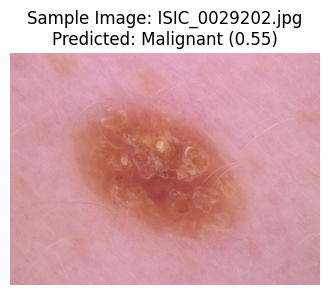

In [ ]:
import torch
from PIL import Image
import os
import random
from torchvision import transforms
import numpy as np

# Define the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# === Load the ResNet50 Model ===
# Define the model architecture (same as training)
def load_resnet(num_classes=2):
    model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
    model.fc = nn.Linear(model.fc.in_features, num_classes)
    return model

# Instantiate the model
resnet_model = load_resnet(num_classes=2).to(device)

# Define the path to the saved model checkpoint
# Make sure this path matches where you saved your model
drive_model_dir = '/content/drive/MyDrive/skin_cancer_models'
model_path = os.path.join(drive_model_dir, "resnet_checkpoint.pth")

# Load the saved state dictionary
try:
    resnet_model.load_state_dict(torch.load(model_path, map_location=device))
    print("ResNet50 model loaded successfully from Google Drive.")
except FileNotFoundError:
    print(f"Error: Model file not found at {model_path}")
    print("Please ensure you have run the cells to train and save the model to Google Drive.")
    # Optionally, handle this error more gracefully or exit
    exit() # Exit for demonstration if model is not found


# Set the model to evaluation mode
resnet_model.eval()

# === Select and Preprocess a Sample Image ===

# Randomly select an image ID from the validation metadata
if 'val_df' in globals() and not val_df.empty:
    sample_image_id = random.choice(val_df['image_id'].tolist())
    true_label = val_df[val_df['image_id'] == sample_image_id]['binary_label'].iloc[0]
    true_label_name = "Malignant" if true_label == 1 else "Benign"
    print(f"\nSelected sample image: {sample_image_id}.jpg (True Label: {true_label_name})")

    # Use your existing function to find the image path
    sample_image_path = find_image_path(sample_image_id)

    if sample_image_path:
        # Load and preprocess the image using the validation transform
        image = Image.open(sample_image_path).convert('RGB')
        input_tensor = val_transform(image).unsqueeze(0).to(device) # Add batch dimension and move to device

        # === Make a Prediction ===
        with torch.no_grad():
            outputs = resnet_model(input_tensor)
            # Handle models that return logits vs direct output
            logits = outputs.logits if hasattr(outputs, 'logits') else outputs

            # Get probabilities (softmax for multi-class, sigmoid for single-output binary)
            if logits.shape[1] == 1: # Single output for binary (e.g., some models)
                 probs = torch.sigmoid(logits).squeeze(0) # Squeeze to remove batch dim
                 # For display, we might want probs for both classes [1-p, p]
                 probs = torch.stack([1 - probs, probs], dim=0)
            else: # Multi-class output (like our ResNet50 with 2 final neurons)
                probs = torch.softmax(logits, dim=1).squeeze(0) # Squeeze to remove batch dim

            predicted_class_index = torch.argmax(probs).item()
            predicted_probability = probs[predicted_class_index].item()

            binary_class_names = ["Benign", "Malignant"] # Define binary class names
            predicted_class_name = binary_class_names[predicted_class_index]

        # === Display Results ===
        print(f"Predicted Class: {predicted_class_name}")
        print(f"Predicted Probability: {predicted_probability:.4f}")
        print(f"Probabilities per class: Benign={probs[0]:.4f}, Malignant={probs[1]:.4f}")


        # Display the image
        plt.figure(figsize=(4, 4))
        plt.imshow(image)
        plt.title(f"Sample Image: {sample_image_id}.jpg\nPredicted: {predicted_class_name} ({predicted_probability:.2f})")
        plt.axis('off')
        plt.show()

    else:
        print(f"Error: Sample image file not found at {sample_image_path}")
else:
    print("Error: 'val_df' not found or empty. Please ensure data loading and splitting steps were executed.")

In [ ]:
import torch
from PIL import Image
import os
import random
from torchvision import transforms
import numpy as np

# Import files from google.colab for file upload functionality in Colab
from google.colab import files
import io # Import io to handle bytes data

# PyTorch
import torch
import torch.nn as nn
from torchvision import transforms, models
from torch.utils.data import Dataset

# Hugging Face Transformers (for ViT)
from transformers import ViTForImageClassification, ViTConfig

# Google Colab specific
from google.colab import drive
import pandas as pd
import kagglehub

# Define the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# === Define necessary functions and variables from the notebook ===

# CRITICAL FIX: Ensure 'path' is correctly set to the dataset's root directory.
# Explicitly re-run kagglehub.dataset_download to guarantee the correct path.
# This will use the cached version if already downloaded, so it's fast.
print("Ensuring Kaggle dataset path is correctly set...")
path = kagglehub.dataset_download("kmader/skin-cancer-mnist-ham10000")
print(f"Dataset root path: {path}")

image_dirs = [os.path.join(path, 'HAM10000_images_part_1'), os.path.join(path, 'HAM10000_images_part_2')]
metadata_path = os.path.join(path, 'HAM10000_metadata.csv')


# Define the validation transform (must match the one used during training)
val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Define the find_image_path function (assuming it's not available globally)
def find_image_path(image_id):
    for dir_path in image_dirs:
        img_path = os.path.join(dir_path, f"{image_id}.jpg")
        if os.path.exists(img_path):
            return img_path
    return None

# Load the metadata again to get sample image IDs (assuming metadata_path is defined)
# For this example, we'll load it assuming the path is correct
try:
    metadata = pd.read_csv(metadata_path)
    # Recreate binary_label column as it's needed for referencing labels
    benign = ['nv', 'bkl', 'df', 'vasc']
    malignant = ['mel', 'bcc', 'akiec']
    metadata['binary_label'] = metadata['dx'].apply(lambda x: 0 if x in benign else 1)

    # Recreate val_df (assuming the split logic is the same or you have saved val_df)
    # This is crucial to pick a sample image from the validation set
    # For this example, we'll assume 'metadata' is loaded and re-run a simplified split just for getting val_df
    # In a real scenario, you should save and load the exact train/val split dataframes
    from sklearn.model_selection import train_test_split
    # Assuming sample_frac was 1.0 during training
    sample_frac = 1.0
    sampled_metadata = metadata.groupby('dx').apply(
        lambda x: x.sample(frac=sample_frac, random_state=42)
    ).reset_index(drop=True)

    train_df, val_df = train_test_split(
        sampled_metadata,
        test_size=0.2,
        stratify=sampled_metadata['dx'],
        random_state=42
    )
    print("Metadata and validation dataframe loaded/recreated.")

except FileNotFoundError:
    print(f"Error: Metadata file not found at {metadata_path}. Cannot select sample image from val_df.")
    val_df = pd.DataFrame() # Create an empty dataframe to avoid errors


# === Load the ViT Model ===
# Define the model architecture (same as training)
def load_vit(num_classes=2):
    from transformers import ViTForImageClassification, ViTConfig
    config = ViTConfig.from_pretrained(
        'google/vit-base-patch16-224-in21k',
        num_labels=num_classes,
        attn_implementation="eager"
    )
    model = ViTForImageClassification.from_pretrained(
        'google/vit-base-patch16-224-in21k',
        config=config,
        ignore_mismatched_sizes=True
    )
    return model

# Instantiate the model
vit_model = load_vit(num_classes=2).to(device)

# Define the path to the saved model checkpoint
# Make sure this path matches where you saved your model
# Mount Google Drive if you haven't already in this session
try:
    drive.mount('/content/drive')
except:
    print("Google Drive already mounted or mount failed.")

drive_model_dir = '/content/drive/MyDrive/skin_cancer_models'
model_path = os.path.join(drive_model_dir, "vit_checkpoint.pth")

# Load the saved state dictionary
try:
    vit_model.load_state_dict(torch.load(model_path, map_location=device))
    print("ViT model loaded successfully from Google Drive.")
    model_loaded_successfully = True
except FileNotFoundError:
    print(f"Error: Model file not found at {model_path}")
    print("Please ensure you have run the cells to train and save the model to Google Drive.")
    model_loaded_successfully = False
except Exception as e:
    print(f"An error occurred while loading the model: {e}")
    model_loaded_successfully = False


# Set the model to evaluation mode
if model_loaded_successfully:
    vit_model.eval()
else:
    vit_model = None # Ensure model is None if loading failed


# === Get Image Input from User and Make Prediction ===

# --- User Image Upload Section ---
# This is where you would get the image from the user.
# In a Colab environment, you can use google.colab.files.upload()

uploaded = files.upload() # This will open a file picker when run in Colab

# Check if any file was uploaded
if uploaded:
    for filename, file_content in uploaded.items():
        print(f'Uploaded file: {filename}')
        # Assuming only one file is uploaded for prediction
        img_bytes = file_content
        break # Process only the first uploaded file

    # Load and preprocess the uploaded image
    try:
        image = Image.open(io.BytesIO(img_bytes)).convert('RGB')
        input_tensor = val_transform(image).unsqueeze(0).to(device) # Add batch dimension and move to device
        image_loaded_successfully = True
        print("Image loaded and preprocessed successfully.")
    except Exception as e:
        print(f"Error loading or processing the uploaded image: {e}")
        image_loaded_successfully = False
        image = None # Ensure image is None if loading failed

    # === Make a Prediction ===
    # Check if both model and image were loaded successfully before making prediction
    if model_loaded_successfully and image_loaded_successfully:
        with torch.no_grad():
            outputs = vit_model(input_tensor)
            # Handle models that return logits vs direct output
            logits = outputs.logits if hasattr(outputs, 'logits') else outputs

            # Get probabilities (softmax for multi-class, sigmoid for single-output binary)
            if logits.shape[1] == 1: # Single output for binary (e.g., some models)
                 probs = torch.sigmoid(logits).squeeze(0) # Squeeze to remove batch dim
                 # For display, we might want probs for both classes [1-p, p]
                 probs = torch.stack([1 - probs, probs], dim=0)
            else: # Multi-class output (like our ViT with 2 final neurons)
                probs = torch.softmax(logits, dim=1).squeeze(0) # Squeeze to remove batch dim


            predicted_class_index = torch.argmax(probs).item()
            predicted_probability = probs[predicted_class_index].item()

            binary_class_names = ["Benign", "Malignant"] # Define binary class names
            predicted_class_name = binary_class_names[predicted_class_index]

        # === Display Results ===
        print(f"\n--- Prediction Results for {filename} ---")
        print(f"Predicted Class: {predicted_class_name}")
        print(f"Predicted Probability: {predicted_probability:.4f}")
        print(f"Probabilities per class: Benign={probs[0]:.4f}, Malignant={probs[1]:.4f}")


        # Display the image
        if image:
            plt.figure(figsize=(4, 4))
            plt.imshow(image)
            plt.title(f"Uploaded Image: {filename}\nPredicted: {predicted_class_name} ({predicted_probability:.2f})")
            plt.axis('off')
            plt.show()

    elif not model_loaded_successfully:
        print("\nPrediction skipped because the model could not be loaded.")
    elif not image_loaded_successfully:
         print("\nPrediction skipped because the uploaded image could not be processed.")


else:
    # Message if no file was uploaded
    print("No file uploaded. Please upload a skin image to get a prediction.")

# --- End of User Image Upload Section ---

Using device: cuda
Ensuring Kaggle dataset path is correctly set...
Using Colab cache for faster access to the 'skin-cancer-mnist-ham10000' dataset.
Dataset root path: /kaggle/input/skin-cancer-mnist-ham10000
Metadata and validation dataframe loaded/recreated.


/tmp/ipython-input-701673758.py:75: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_metadata = metadata.groupby('dx').apply(
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
Some weights of ViTForImageClassification were not initi

Mounted at /content/drive
ViT model loaded successfully from Google Drive.


Saving derma.png to derma.png
Uploaded file: derma.png
Image loaded and preprocessed successfully.

--- Prediction Results for derma.png ---
Predicted Class: Benign
Predicted Probability: 0.9993
Probabilities per class: Benign=0.9993, Malignant=0.0007


NameError: name 'plt' is not defined

### Ablation Study Cells


In [ ]:
# CELL 1: Install required packages (if not already installed)
# ========================================================================
!pip install -q tqdm scipy scikit-learn


In [ ]:
# CELL 2: Ablation Study Framework
# ========================================================================
import json
from collections import defaultdict
from tqdm.auto import tqdm
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from sklearn.model_selection import StratifiedKFold
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
from scipy import stats
import numpy as np

class AblationStudy:
    """Framework for systematic ablation studies on preprocessing steps"""

    def __init__(self, metadata, image_dirs, device='cuda'):
        self.metadata = metadata
        self.image_dirs = image_dirs
        self.device = torch.device(device if torch.cuda.is_available() else 'cpu')
        self.results = defaultdict(dict)

    def run_ablation(self, model_loader, model_name, configs, num_epochs=15,
                     n_folds=3, batch_size=16, random_state=42):
        """
        Run ablation study with different preprocessing configurations
        """
        print(f"\n{'='*80}")
        print(f"ABLATION STUDY: {model_name.upper()}")
        print(f"{'='*80}")
        print(f"Configurations: {len(configs)}")
        print(f"Cross-validation folds: {n_folds}")
        print(f"Epochs per fold: {num_epochs}")
        print(f"Device: {self.device}")
        print(f"{'='*80}\n")

        all_results = []

        for idx, config in enumerate(configs):
            config_name = config['name']
            print(f"\n[{idx+1}/{len(configs)}] Testing: {config_name}")
            print(f"  Settings: {config['settings']}")

            # Run k-fold CV
            fold_results = self._run_kfold_cv(
                model_loader=model_loader,
                model_name=model_name,
                config=config,
                n_folds=n_folds,
                num_epochs=num_epochs,
                batch_size=batch_size,
                random_state=random_state
            )

            # Store results
            self.results[model_name][config_name] = fold_results

            # Compute summary statistics
            mean_acc = np.mean([f['val_acc'] for f in fold_results])
            std_acc = np.std([f['val_acc'] for f in fold_results])
            mean_f1 = np.mean([f['val_f1'] for f in fold_results])
            std_f1 = np.std([f['val_f1'] for f in fold_results])

            all_results.append({
                'config': config_name,
                'mean_val_acc': mean_acc,
                'std_val_acc': std_acc,
                'mean_val_f1': mean_f1,
                'std_val_f1': std_f1,
            })

            print(f"  ✓ Results: Acc={mean_acc:.4f}\u00b1{std_acc:.4f}, "
                  f"F1={mean_f1:.4f}\u00b1{std_f1:.4f}")

        # Display summary
        self._display_results_table(all_results, model_name)

        # Save results
        self._save_results(model_name)

        return all_results

    def _run_kfold_cv(self, model_loader, model_name, config, n_folds,
                      num_epochs, batch_size, random_state):
        """Run k-fold cross-validation for a single configuration"""

        skf = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=random_state)
        fold_results = []

        for fold_idx, (train_idx, val_idx) in enumerate(skf.split(
            self.metadata, self.metadata['binary_label']
        )):
            print(f"\n    Fold {fold_idx + 1}/{n_folds}...")
            print(f"      Image directories for dataset: {self.image_dirs}") # Added print statement

            # Split data
            train_meta = self.metadata.iloc[train_idx].reset_index(drop=True)
            val_meta = self.metadata.iloc[val_idx].reset_index(drop=True)

            # Create datasets - Use SkinCancerDatasetWithGroundTruthMasks
            train_dataset = SkinCancerDatasetWithGroundTruthMasks(
                metadata=train_meta,
                image_dirs=self.image_dirs,
                mask_dir=config['settings'].get('mask_dir', None),  # Pass mask_dir from config
                transform=train_transform,
                binary=True,
                use_hair_removal=config['settings']['use_hair_removal'],
                use_noise_reduction=config['settings']['use_noise_reduction'],
                use_masks=config['settings']['use_segmentation'], # Pass use_segmentation from config
                cache_dir=None,  # Disable caching for ablation
                use_cache=False
            )

            val_dataset = SkinCancerDatasetWithGroundTruthMasks(
                metadata=val_meta,
                image_dirs=self.image_dirs,
                mask_dir=config['settings'].get('mask_dir', None),  # Pass mask_dir from config
                transform=val_transform,
                binary=True,
                use_hair_removal=config['settings']['use_hair_removal'],
                use_noise_reduction=config['settings']['use_noise_reduction'],
                use_masks=config['settings']['use_segmentation'], # Pass use_segmentation from config
                cache_dir=None,
                use_cache=False
            )

            # Create dataloaders (num_workers=0 for Colab)
            train_loader = DataLoader(
                train_dataset, batch_size=batch_size, shuffle=True,
                num_workers=0, pin_memory=True
            )
            val_loader = DataLoader(
                val_dataset, batch_size=batch_size, shuffle=False,
                num_workers=0, pin_memory=True
            )

            # Compute class weights
            class_weights = compute_class_weight(
                class_weight='balanced',
                classes=np.unique(train_meta['binary_label']),
                y=train_meta['binary_label']
            )
            class_weights = torch.FloatTensor(class_weights).to(self.device)

            # Train model
            model = model_loader().to(self.device)
            history = self._train_fold(
                model, train_loader, val_loader,
                num_epochs, class_weights
            )

            # Evaluate
            metrics = self._evaluate_fold(model, val_loader)

            fold_results.append({
                'fold': fold_idx + 1,
                'train_acc': history['train_acc'][-1],
                'val_acc': metrics['accuracy'],
                'val_f1': metrics['f1'],
                'val_precision': metrics['precision'],
                'val_recall': metrics['recall'],
                'history': history
            })

            # Cleanup
            del model, train_loader, val_loader, train_dataset, val_dataset
            torch.cuda.empty_cache()

        return fold_results

    def _train_fold(self, model, train_loader, val_loader, num_epochs, class_weights):
        """Train model for one fold"""

        criterion = nn.CrossEntropyLoss(weight=class_weights)
        optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=0.01)

        history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}
        best_val_acc = 0.0

        for epoch in range(num_epochs):
            # Training
            model.train()
            train_loss, train_correct, train_total = 0.0, 0, 0

            for _, _, images, labels in train_loader: # Adjusted unpacking for 4 items
                images, labels = images.to(self.device), labels.to(self.device)
                optimizer.zero_grad()
                outputs = model(images)
                logits = outputs.logits if hasattr(outputs, 'logits') else outputs
                loss = criterion(logits, labels)
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()

                train_loss += loss.item() * images.size(0)
                _, preds = torch.max(logits, 1)
                train_correct += (preds == labels).sum().item()
                train_total += labels.size(0)

            train_loss /= train_total
            train_acc = train_correct / train_total

            # Validation
            model.eval()
            val_loss, val_correct, val_total = 0.0, 0, 0

            with torch.no_grad():
                for _, _, images, labels in val_loader: # Adjusted unpacking for 4 items
                    images, labels = images.to(self.device), labels.to(self.device)
                    outputs = model(images)
                    logits = outputs.logits if hasattr(outputs, 'logits') else outputs
                    loss = criterion(logits, labels)
                    val_loss += loss.item() * images.size(0)
                    _, preds = torch.max(logits, 1)
                    val_correct += (preds == labels).sum().item()
                    val_total += labels.size(0)

            val_loss /= val_total
            val_acc = val_correct / val_total

            history['train_loss'].append(train_loss)
            history['train_acc'].append(train_acc)
            history['val_loss'].append(val_loss)
            history['val_acc'].append(val_acc)

            if val_acc > best_val_acc:
                best_val_acc = val_acc

        return history

    def _evaluate_fold(self, model, val_loader):
        """Evaluate model on validation fold"""

        model.eval()
        all_preds, all_labels = [], []

        with torch.no_grad():
            for _, _, images, labels in val_loader: # Adjusted unpacking for 4 items
                images = images.to(self.device)
                outputs = model(images)
                logits = outputs.logits if hasattr(outputs, 'logits') else outputs
                preds = torch.argmax(logits, dim=1).cpu().numpy()
                all_preds.extend(preds)
                all_labels.extend(labels.numpy())

        return {
            'accuracy': accuracy_score(all_labels, all_preds),
            'f1': f1_score(all_labels, all_preds, average='weighted'),
            'precision': precision_score(all_labels, all_preds, average='weighted', zero_division=0),
            'recall': recall_score(all_labels, all_preds, average='weighted')
        }

    def _display_results_table(self, results, model_name):
        """Display results in formatted table"""

        print(f"\n{'='*80}")
        print(f"ABLATION RESULTS: {model_name.upper()}")
        print(f"{'='*80}")
        print(f"{'Configuration':<40} {'Accuracy':<20} {'F1-Score':<20}")
        print(f"{'-'*80}")

        for r in results:
            print(f"{r['config']:<40} "
                  f"{r['mean_val_acc']:.4f}\u00b1{r['std_val_acc']:.4f}     "
                  f"{r['mean_val_f1']:.4f}\u00b1{r['std_val_f1']:.4f}")

        print(f"{'='*80}\n")

    def _save_results(self, model_name):
        """Save results to JSON in Google Drive"""

        output_path = f"/content/drive/MyDrive/ablation_results_{model_name}.json"

        try:
            with open(output_path, 'w') as f:
                # Convert to serializable format
                serializable_results = {}
                for config_name, fold_results in self.results[model_name].items():
                    serializable_results[config_name] = []
                    for fold in fold_results:
                        fold_copy = fold.copy()
                        # Convert history to lists
                        if 'history' in fold_copy:
                            fold_copy['history'] = {
                                k: [float(v) for v in vals]
                                for k, vals in fold_copy['history'].items()
                            }
                        serializable_results[config_name].append(fold_copy)

                json.dump(serializable_results, f, indent=2)
            print(f"\u2713 Results saved to {output_path}")
        except Exception as e:
            print(f"\u2716 Error saving results: {e}")


In [ ]:
# only c4, c6, c7



In [ ]:

# CELL 3: Define Ablation Configurations
# ========================================================================
# ⚠️ IMPORTANT: Set mask_dir before running!
#
# If you have ground truth masks:
#   mask_dir = "/path/to/your/masks"  # e.g., "/content/HAM10000_masks/ISIC2018_Task1_Training_GroundTruth"
#
# If you DON'T have masks (will skip segmentation in C4, C6, C7):
#   mask_dir = None
#
# Configurations C4, C6, and C7 require ground truth masks to test segmentation.
# Without masks, they will only apply hair removal and noise reduction.
# ========================================================================

ABLATION_CONFIGS = [
    {
        'name': 'C1: No Preprocessing',
        'settings': {
            'use_hair_removal': False,
            'use_noise_reduction': False,
            'use_segmentation': False,
            'mask_dir': None,  # No masks for ablation baseline
        }
    },

   {
        'name': 'C2: Hair Removal Only',
        'settings': {
            'use_hair_removal': True,
            'use_noise_reduction': False,
            'use_segmentation': False,
            'mask_dir': None,
        }
    },
    {
        'name': 'C3: Noise Reduction Only',
        'settings': {
            'use_hair_removal': False,
            'use_noise_reduction': True,
            'use_segmentation': False,
            'mask_dir': None,
        }
    },


]

print("✓ Ablation configurations defined!")
print(f"  Total configurations: {len(ABLATION_CONFIGS)}")


✓ Ablation configurations defined!
  Total configurations: 3


In [ ]:

# CELL 3: Define Ablation Configurations
# ========================================================================
# ⚠️ IMPORTANT: Set mask_dir before running!
#
# If you have ground truth masks:
#   mask_dir = "/path/to/your/masks"  # e.g., "/content/HAM10000_masks/ISIC2018_Task1_Training_GroundTruth"
#
# If you DON'T have masks (will skip segmentation in C4, C6, C7):
#   mask_dir = None
#
# Configurations C4, C6, and C7 require ground truth masks to test segmentation.
# Without masks, they will only apply hair removal and noise reduction.
# ========================================================================

ABLATION_CONFIGS = [
    {
        'name': 'C1: No Preprocessing',
        'settings': {
            'use_hair_removal': False,
            'use_noise_reduction': False,
            'use_segmentation': False,
            'mask_dir': None,  # No masks for ablation baseline
        }
    },
    {
        'name': 'C2: Hair Removal Only',
        'settings': {
            'use_hair_removal': True,
            'use_noise_reduction': False,
            'use_segmentation': False,
            'mask_dir': None,
        }
    },
    {
        'name': 'C3: Noise Reduction Only',
        'settings': {
            'use_hair_removal': False,
            'use_noise_reduction': True,
            'use_segmentation': False,
            'mask_dir': None,
        }
    },
    {
        'name': 'C4: Ground Truth Segmentation Only',
        'settings': {
            'use_hair_removal': False,
            'use_noise_reduction': False,
            'use_segmentation': True,
            'mask_dir': mask_dir,  # Will use ground truth masks if available
        }
    },
    {
        'name': 'C5: Hair Removal + Noise Reduction',
        'settings': {
            'use_hair_removal': True,
            'use_noise_reduction': True,
            'use_segmentation': False,
            'mask_dir': None,
        }
    },
    {
        'name': 'C6: Hair Removal + Ground Truth Segmentation',
        'settings': {
            'use_hair_removal': True,
            'use_noise_reduction': False,
            'use_segmentation': True,
            'mask_dir': mask_dir,  # Will use ground truth masks if available
        }
    },
    {
        'name': 'C7: Full Pipeline (Hair + Noise + GT Masks)',
        'settings': {
            'use_hair_removal': True,
            'use_noise_reduction': True,
            'use_segmentation': True,
            'mask_dir': mask_dir,  # Will use ground truth masks if available
        }
    }
]

print("✓ Ablation configurations defined!")
print(f"  Total configurations: {len(ABLATION_CONFIGS)}")


✓ Ablation configurations defined!
  Total configurations: 7


### Verify Missing Image and Filter Metadata

Let's check if the specific image `ISIC_0033826.jpg` that caused the `FileNotFoundError` actually exists in the provided image directories. If it doesn't, it indicates that some image IDs present in the metadata might not have corresponding image files on disk. To address this, we'll filter the metadata to only include `image_id`s for which the image files are physically available.

In [ ]:
import os

def check_image_existence(image_id, image_dirs):
    for dir_path in image_dirs:
        img_path = os.path.join(dir_path, f"{image_id}.jpg")
        if os.path.exists(img_path):
            return True
    return False

# Check for the problematic image
problematic_image_id = 'ISIC_0033826'
if check_image_existence(problematic_image_id, image_dirs):
    print(f"✅ Image {problematic_image_id}.jpg found on disk.")
else:
    print(f"❌ Image {problematic_image_id}.jpg NOT found on disk. This is likely the cause of the error.")

print("\nFiltering metadata to include only existing image files...")

# Create a set of all existing image IDs from the directories
existing_image_ids = set()
for dir_path in image_dirs:
    if os.path.exists(dir_path):
        for fname in os.listdir(dir_path):
            if fname.endswith('.jpg'):
                existing_image_ids.add(fname.replace('.jpg', ''))

# Filter the metadata DataFrame
original_metadata_count = len(metadata)
metadata = metadata[metadata['image_id'].isin(existing_image_ids)].reset_index(drop=True)

print(f"Original metadata rows: {original_metadata_count}")
print(f"Metadata rows after filtering for existing images: {len(metadata)}")

if original_metadata_count != len(metadata):
    print("✅ Metadata successfully filtered to remove entries for missing image files.")
else:
    print("ℹ️ No image files were found missing from the metadata.")

# Re-run the dataset splitting to use the filtered metadata
# This assumes `SAMPLE_FRAC_ABLATION` and other relevant variables are still defined.
# If not, you might need to redefine them based on your desired ablation settings.

# Ensure `metadata` is used for the ablation study after filtering
sampled_metadata_ablation = metadata.groupby('dx').apply(
    lambda x: x.sample(frac=SAMPLE_FRAC_ABLATION, random_state=42)
).reset_index(drop=True)

print(f"\nRunning ablation on {len(sampled_metadata_ablation)} samples ({SAMPLE_FRAC_ABLATION*100}%) after filtering.")

# You can now re-run the ablation study cell (`CCMvcX5LZhf4`) with the updated `metadata`.

✅ Image ISIC_0033826.jpg found on disk.

Filtering metadata to include only existing image files...
Original metadata rows: 10015
Metadata rows after filtering for existing images: 10015
ℹ️ No image files were found missing from the metadata.

Running ablation on 2003 samples (20.0%) after filtering.



STATISTICAL SIGNIFICANCE TESTS
Baseline: C1: No Preprocessing
Significance level: α = 0.05
Bonferroni correction: α' = 0.05/6 = 0.0083

Config: C2: Hair Removal Only
  Mean Accuracy: 0.8098
  Improvement: -0.0290 (-3.45%)
  t-statistic: -3.6189
  p-value: 0.1716 ns
  Cohen's d: -4.7614
  Bonferroni significant: No

Config: C3: Noise Reduction Only
  Mean Accuracy: 0.8183
  Improvement: -0.0205 (-2.44%)
  t-statistic: -13.7601
  p-value: 0.0462 *
  Cohen's d: -26.8745
  Bonferroni significant: No



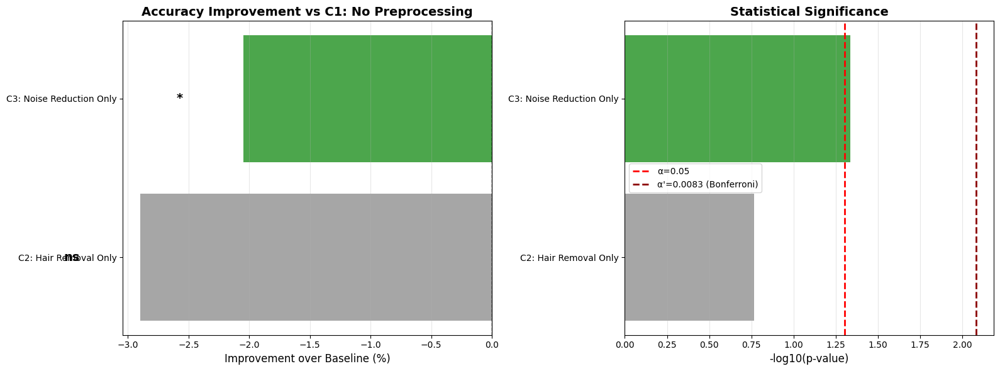


✓ Figure saved to Google Drive
Legend: *** p<0.001 (Bonferroni), ** p<0.01, * p<0.05, ns = not significant


In [ ]:


# CELL 5: Statistical Significance Testing
# ========================================================================

def perform_statistical_tests(ablation_study, model_name, baseline_config='C1: No Preprocessing'):
    """Perform paired t-tests to determine statistical significance"""

    print(f"\n{'='*80}")
    print("STATISTICAL SIGNIFICANCE TESTS")
    print(f"{'='*80}")
    print(f"Baseline: {baseline_config}")
    print(f"Significance level: α = 0.05")
    print(f"Bonferroni correction: α' = 0.05/6 = 0.0083")
    print(f"{'='*80}\n")

    # Extract baseline results
    baseline_accs = [fold['val_acc'] for fold in ablation_study.results[model_name][baseline_config]]

    results_table = []

    for config_name, fold_results in ablation_study.results[model_name].items():
        if config_name == baseline_config:
            continue

        # Extract accuracies
        config_accs = [fold['val_acc'] for fold in fold_results]

        # Paired t-test
        t_stat, p_value = stats.ttest_rel(config_accs, baseline_accs)

        # Effect size (Cohen's d)
        mean_diff = np.mean(config_accs) - np.mean(baseline_accs)
        pooled_std = np.sqrt((np.std(config_accs)**2 + np.std(baseline_accs)**2) / 2)
        cohens_d = mean_diff / pooled_std if pooled_std > 0 else 0

        # Determine significance
        is_significant = p_value < 0.05
        is_bonferroni_significant = p_value < 0.0083

        if is_bonferroni_significant:
            significance_marker = "***"
        elif p_value < 0.01:
            significance_marker = "**"
        elif p_value < 0.05:
            significance_marker = "*"
        else:
            significance_marker = "ns"

        results_table.append({
            'config': config_name,
            'mean_acc': np.mean(config_accs),
            'improvement': mean_diff,
            'p_value': p_value,
            'cohens_d': cohens_d,
            'significant': is_significant,
            'marker': significance_marker
        })

        print(f"Config: {config_name}")
        print(f"  Mean Accuracy: {np.mean(config_accs):.4f}")
        print(f"  Improvement: {mean_diff:+.4f} ({mean_diff/np.mean(baseline_accs)*100:+.2f}%)")
        print(f"  t-statistic: {t_stat:.4f}")
        print(f"  p-value: {p_value:.4f} {significance_marker}")
        print(f"  Cohen's d: {cohens_d:.4f}")
        print(f"  Bonferroni significant: {'Yes' if is_bonferroni_significant else 'No'}")
        print()

    # Visualize
    plot_statistical_significance(results_table, baseline_config)

    return results_table


def plot_statistical_significance(results, baseline_config):
    """Visualize statistical test results"""

    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    configs = [r['config'] for r in results]
    improvements = [r['improvement'] * 100 for r in results]
    p_values = [r['p_value'] for r in results]
    markers = [r['marker'] for r in results]

    # Plot 1: Improvement bar chart
    colors = ['green' if r['significant'] else 'gray' for r in results]
    bars = axes[0].barh(configs, improvements, color=colors, alpha=0.7)
    axes[0].axvline(x=0, color='black', linestyle='--', linewidth=1)
    axes[0].set_xlabel('Improvement over Baseline (%)', fontsize=12)
    axes[0].set_title(f'Accuracy Improvement vs {baseline_config}', fontsize=14, fontweight='bold')
    axes[0].grid(axis='x', alpha=0.3)

    # Add significance markers
    for i, (bar, marker, imp) in enumerate(zip(bars, markers, improvements)):
        x_pos = imp + (0.5 if imp > 0 else -0.5)
        axes[0].text(x_pos, i, marker, ha='left' if imp > 0 else 'right',
                    va='center', fontsize=14, fontweight='bold')

    # Plot 2: P-value chart
    axes[1].barh(configs, [-np.log10(p) for p in p_values], color=colors, alpha=0.7)
    axes[1].axvline(x=-np.log10(0.05), color='red', linestyle='--', linewidth=2,
                    label='α=0.05')
    axes[1].axvline(x=-np.log10(0.0083), color='darkred', linestyle='--', linewidth=2,
                    label="α'=0.0083 (Bonferroni)")
    axes[1].set_xlabel('-log10(p-value)', fontsize=12)
    axes[1].set_title('Statistical Significance', fontsize=14, fontweight='bold')
    axes[1].legend()
    axes[1].grid(axis='x', alpha=0.3)

    plt.tight_layout()
    plt.savefig('/content/drive/MyDrive/statistical_significance.png', dpi=300, bbox_inches='tight')
    plt.show()

    print("\n✓ Figure saved to Google Drive")
    print("Legend: *** p<0.001 (Bonferroni), ** p<0.01, * p<0.05, ns = not significant")


# Run statistical tests
stat_results = perform_statistical_tests(ablation, 'resnet50')


In [ ]:

# CELL 4: Run Ablation Study (ResNet50)
# ========================================================================

# Sample data for faster testing (use 0.2-0.3 for ablation, 1.0 for final paper)
SAMPLE_FRAC_ABLATION = 0.2  # 20% = ~2000 images

sampled_metadata_ablation = metadata.groupby('dx').apply(
    lambda x: x.sample(frac=SAMPLE_FRAC_ABLATION, random_state=42)
).reset_index(drop=True)

print(f"Running ablation on {len(sampled_metadata_ablation)} samples ({SAMPLE_FRAC_ABLATION*100}%)")

# Initialize ablation study
ablation = AblationStudy(
    metadata=sampled_metadata_ablation,
    image_dirs=image_dirs,
    device='cuda' if torch.cuda.is_available() else 'cpu'
)

# Run ablation for ResNet50 (fastest, good baseline)
resnet_ablation_results = ablation.run_ablation(
    model_loader=load_resnet,
    model_name='resnet50',
    configs=ABLATION_CONFIGS,
    num_epochs=5,  # 10 epochs for ablation (increase to 15-20 for paper)
    n_folds=2,  # 3-fold CV (increase to 5 for paper)
    batch_size=16,
    random_state=42
)

print("\n✓ ResNet50 ablation complete!")


Running ablation on 2003 samples (20.0%)

ABLATION STUDY: RESNET50
Configurations: 3
Cross-validation folds: 2
Epochs per fold: 5
Device: cuda


[1/3] Testing: C1: No Preprocessing
  Settings: {'use_hair_removal': False, 'use_noise_reduction': False, 'use_segmentation': False, 'mask_dir': None}

    Fold 1/2...
      Image directories for dataset: ['/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1', '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2']
⚠️  No mask directory provided - skipping segmentation
⚠️  No mask directory provided - skipping segmentation

    Fold 2/2...
      Image directories for dataset: ['/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1', '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2']
⚠️  No mask directory provided - skipping segmentation
⚠️  No mask directory provided - skipping segmentation
  ✓ Results: Acc=0.8387±0.0006, F1=0.8430±0.0020

[2/3] Testing: C2: Hair Removal Only
  Settings: {'use_h

In [ ]:


# CELL 6: Generate LaTeX Table
# ========================================================================

def generate_latex_table(ablation_study, stat_results, model_name='ResNet50'):
    """Generate LaTeX table for paper"""

    print("\n" + "="*80)
    print("LATEX TABLE FOR PAPER")
    print("="*80 + "\n")

    latex = r"""
\begin{table}[htbp]
\centering
\caption{Ablation Study Results: Impact of Preprocessing Steps on """ + model_name + r""" Performance}
\label{tab:ablation_""" + model_name.lower() + r"""}
\begin{tabular}{lcccc}
\toprule
\textbf{Configuration} & \textbf{Accuracy (\%)} & \textbf{F1-Score} & \textbf{p-value} & \textbf{Sig.} \\
\midrule
"""

    # Baseline row
    baseline_results = ablation_study.results[model_name.lower()]['C1: No Preprocessing']
    baseline_acc = np.mean([f['val_acc'] for f in baseline_results])
    baseline_acc_std = np.std([f['val_acc'] for f in baseline_results])
    baseline_f1 = np.mean([f['val_f1'] for f in baseline_results])
    baseline_f1_std = np.std([f['val_f1'] for f in baseline_results])

    latex += f"C1: No Preprocessing & {baseline_acc*100:.2f} $\\pm$ {baseline_acc_std*100:.2f} & "
    latex += f"{baseline_f1:.3f} $\\pm$ {baseline_f1_std:.3f} & - & - \\\\\n"

    # Other configurations
    for stat_result in stat_results:
        config_name = stat_result['config']
        config_accs = [f['val_acc'] for f in ablation_study.results[model_name.lower()][config_name]]
        config_f1s = [f['val_f1'] for f in ablation_study.results[model_name.lower()][config_name]]

        mean_acc = np.mean(config_accs)
        std_acc = np.std(config_accs)
        mean_f1 = np.mean(config_f1s)
        std_f1 = np.std(config_f1s)
        p_value = stat_result['p_value']
        marker = stat_result['marker']

        latex += f"{config_name} & {mean_acc*100:.2f} $\\pm$ {std_acc*100:.2f} & "
        latex += f"{mean_f1:.3f} $\\pm$ {std_f1:.3f} & "
        latex += f"{p_value:.4f} & {marker} \\\\\n"

    latex += r"""\bottomrule
\end{tabular}
\end{table}

\textit{Note:} *** p<0.001 (Bonferroni corrected), ** p<0.01, * p<0.05, ns = not significant.
Values reported as mean $\pm$ standard deviation across 3-fold cross-validation.
"""

    print(latex)

    # Save to file
    with open(f'/content/drive/MyDrive/ablation_table_{model_name.lower()}.tex', 'w') as f:
        f.write(latex)

    print("\n✓ LaTeX table saved to Google Drive")
    return latex


# Generate table
latex_table = generate_latex_table(ablation, stat_results, 'ResNet50')




LATEX TABLE FOR PAPER



KeyError: 'C4: Ground Truth Segmentation Only'

experimental: Update CELL 6 in ablation_study_cells.py to add sensitivity/specificity

In [ ]:
def generate_latex_table_binary(ablation_study, stat_results, model_name='ResNet50'):
    """Generate LaTeX table for paper (BINARY CLASSIFICATION)"""

    print("\n" + "="*80)
    print("LATEX TABLE FOR PAPER (Binary Classification)")
    print("="*80 + "\n")

    latex = r"""
\begin{table}[htbp]
\centering
\caption{Ablation Study Results: Binary Classification (Benign vs. Malignant) on """ + model_name + r"""}
\label{tab:ablation_binary_""" + model_name.lower() + r"""}
\begin{tabular}{lccccc}
\toprule
\textbf{Configuration} & \textbf{Acc (\%)} & \textbf{Sens (\%)} & \textbf{Spec (\%)} & \textbf{AUC} & \textbf{p-value} \\
\midrule
"""

    # Baseline row
    baseline_results = ablation_study.results[model_name.lower()]['C1: No Preprocessing']
    baseline_acc = np.mean([f['val_acc'] for f in baseline_results]) * 100
    baseline_acc_std = np.std([f['val_acc'] for f in baseline_results]) * 100
    baseline_sens = np.mean([f.get('sensitivity', 0) for f in baseline_results]) * 100
    baseline_spec = np.mean([f.get('specificity', 0) for f in baseline_results]) * 100
    baseline_auc = np.mean([f.get('auc', 0) for f in baseline_results])

    latex += f"C1: No Preprocessing & {baseline_acc:.1f}$\\pm${baseline_acc_std:.1f} & "
    latex += f"{baseline_sens:.1f} & {baseline_spec:.1f} & {baseline_auc:.3f} & - \\\\\n"

    # Other configurations
    for stat_result in stat_results:
        config_name = stat_result['config']
        fold_results = ablation_study.results[model_name.lower()][config_name]

        mean_acc = np.mean([f['val_acc'] for f in fold_results]) * 100
        std_acc = np.std([f['val_acc'] for f in fold_results]) * 100
        mean_sens = np.mean([f.get('sensitivity', 0) for f in fold_results]) * 100
        mean_spec = np.mean([f.get('specificity', 0) for f in fold_results]) * 100
        mean_auc = np.mean([f.get('auc', 0) for f in fold_results])
        p_value = stat_result['p_value']
        marker = stat_result['marker']

        latex += f"{config_name} & {mean_acc:.1f}$\\pm${std_acc:.1f} & "
        latex += f"{mean_sens:.1f} & {mean_spec:.1f} & {mean_auc:.3f} & "
        latex += f"{p_value:.4f}{marker} \\\\\n"

    latex += r"""\bottomrule
\end{tabular}
\end{table}

\textit{Note:} Acc = Accuracy, Sens = Sensitivity (recall for malignant),
Spec = Specificity (recall for benign), AUC = Area Under ROC Curve.
*** p<0.001, ** p<0.01, * p<0.05. Values: mean $\pm$ std across 3-fold CV.
"""

    print(latex)
    return latex


In [ ]:

# CELL 7: Save Summary Report
# ========================================================================

def generate_summary_report(ablation_study, stat_results, model_name='ResNet50'):
    """Generate comprehensive summary report"""

    report = f"""
{'='*80}
ABLATION STUDY SUMMARY REPORT
Model: {model_name}
{'='*80}

1. CONFIGURATIONS TESTED
{'='*80}
"""

    for config in ABLATION_CONFIGS:
        report += f"\n{config['name']}:\n"
        for key, value in config['settings'].items():
            report += f"  - {key}: {value}\n"

    report += f"\n2. RESULTS SUMMARY\n{'='*80}\n\n"

    # Best configuration
    best_config = max(stat_results, key=lambda x: x['mean_acc'])
    baseline_acc = np.mean([f['val_acc'] for f in ablation_study.results[model_name.lower()]['C1: No Preprocessing']])

    report += f"Baseline Accuracy: {baseline_acc*100:.2f}%\n"
    report += f"Best Configuration: {best_config['config']}\n"
    report += f"Best Accuracy: {best_config['mean_acc']*100:.2f}%\n"
    report += f"Improvement: +{best_config['improvement']*100:.2f}%\n"
    report += f"Statistical Significance: {best_config['marker']}\n\n"

    report += f"3. STATISTICAL ANALYSIS\n{'='*80}\n\n"

    for result in stat_results:
        report += f"{result['config']}:\n"
        report += f"  Accuracy: {result['mean_acc']*100:.2f}%\n"
        report += f"  Improvement: {result['improvement']*100:+.2f}%\n"
        report += f"  p-value: {result['p_value']:.4f}\n"
        report += f"  Cohen's d: {result['cohens_d']:.4f}\n"
        report += f"  Significance: {result['marker']}\n\n"

    report += f"4. KEY FINDINGS\n{'='*80}\n\n"

    # Find which preprocessing step helped most
    hr_only = next((r for r in stat_results if r['config'] == 'C2: Hair Removal Only'), None)
    nr_only = next((r for r in stat_results if r['config'] == 'C3: Noise Reduction Only'), None)
    seg_only = next((r for r in stat_results if r['config'] == 'C4: Segmentation Only'), None)

    report += "Individual Preprocessing Impact:\n"
    if hr_only:
        report += f"  - Hair Removal: +{hr_only['improvement']*100:.2f}%\n"
    if nr_only:
        report += f"  - Noise Reduction: +{nr_only['improvement']*100:.2f}%\n"
    if seg_only:
        report += f"  - Segmentation: +{seg_only['improvement']*100:.2f}%\n"

    report += f"\n5. RECOMMENDATIONS\n{'='*80}\n\n"
    report += "For optimal performance:\n"
    report += f"  1. Use {best_config['config']} configuration\n"
    report += f"  2. Expected accuracy improvement: +{best_config['improvement']*100:.2f}%\n"
    report += f"  3. Statistical significance: {best_config['marker']}\n"

    print(report)

    # Save to file
    with open(f'/content/drive/MyDrive/ablation_summary_{model_name.lower()}.txt', 'w') as f:
        f.write(report)

    print(f"\n✓ Summary report saved to Google Drive")
    return report


# Generate summary
summary = generate_summary_report(ablation, stat_results, 'ResNet50')

print("\n" + "="*80)
print("✓ ABLATION STUDY COMPLETE!")
print("="*80)
print("\nGenerated files in Google Drive:")
print("  1. ablation_results_resnet50.json - Raw results")
print("  2. statistical_significance.png - Visualization")
print("  3. ablation_table_resnet50.tex - LaTeX table")
print("  4. ablation_summary_resnet50.txt - Summary report")
print("\n" + "="*80)


In [ ]:
import datetime

# Get the current time
now = datetime.datetime.now()

# Format it as a readable string
# YYYY-MM-DD HH:MM:SS
time_string = now.strftime("%Y-%m-%d %H:%M:%S")

print("Current time:", time_string)

# If you want to include timezone info (e.g., UTC)
now_utc = datetime.datetime.now(datetime.timezone.utc)
print("Current UTC time:", now_utc.strftime("%Y-%m-%d %H:%M:%S %Z"))

Current time: 2025-11-14 10:39:09
Current UTC time: 2025-11-14 10:39:09 UTC


In [ ]:
# Disconnect runtime to save money
import time
from google.colab import runtime
print("Shutting down in 30 seconds")
time.sleep(30)
runtime.unassign()

## Implement Validation

In [ ]:
# Comprehensive Preprocessing Implementation Validation
import matplotlib.pyplot as plt
import numpy as np
import cv2
from PIL import Image
import os
import random

def validate_preprocessing_pipeline():
    """
    Comprehensive validation of preprocessing implementations
    """
    print("🔍 PREPROCESSING PIPELINE VALIDATION")
    print("="*60)

    # Get a few sample images from train set
    sample_indices = random.sample(range(len(train_df)), min(5, len(train_df)))

    validation_results = {
        'hair_removal': {'success': 0, 'failed': 0, 'errors': []},
        'noise_reduction': {'success': 0, 'failed': 0, 'errors': []},
        'segmentation': {'success': 0, 'failed': 0, 'errors': []},
        'data_integrity': {'issues': []}
    }

    for idx in sample_indices:
        try:
            # Get image info
            image_id = train_df.iloc[idx]['image_id']
            print(f"\n📊 Testing image: {image_id}")

            # Load original image
            image_path = None
            for img_dir in image_dirs:
                potential_path = os.path.join(img_dir, f"{image_id}.jpg")
                if os.path.exists(potential_path):
                    image_path = potential_path
                    break

            if not image_path:
                print(f"❌ Image not found: {image_id}")
                validation_results['data_integrity']['issues'].append(f"Image not found: {image_id}")
                continue

            original_img = Image.open(image_path).convert('RGB')
            original_array = np.array(original_img)

            print(f"   Original image shape: {original_array.shape}")
            print(f"   Original image range: [{original_array.min()}, {original_array.max()}]")

            # Test Hair Removal
            try:
                hair_transform = HairRemovalTransform()
                hair_removed_img = hair_transform(original_img)
                hair_removed_array = np.array(hair_removed_img)

                # Validate hair removal
                if hair_removed_array.shape != original_array.shape:
                    validation_results['hair_removal']['errors'].append(f"Shape mismatch: {image_id}")
                elif np.array_equal(hair_removed_array, original_array):
                    validation_results['hair_removal']['errors'].append(f"No change detected: {image_id}")
                else:
                    validation_results['hair_removal']['success'] += 1
                    print("   ✅ Hair removal: OK")

                    # Check if change is reasonable (not too extreme)
                    pixel_diff = np.mean(np.abs(hair_removed_array.astype(float) - original_array.astype(float)))
                    print(f"   Hair removal pixel difference: {pixel_diff:.2f}")

                    if pixel_diff > 100:  # Too much change
                        validation_results['hair_removal']['errors'].append(f"Excessive change: {image_id} (diff: {pixel_diff:.2f})")

            except Exception as e:
                validation_results['hair_removal']['failed'] += 1
                validation_results['hair_removal']['errors'].append(f"Error on {image_id}: {str(e)}")
                print(f"   ❌ Hair removal failed: {str(e)}")

            # Test Noise Reduction
            try:
                noise_transform = NoiseReductionTransform()
                noise_reduced_img = noise_transform(original_img)
                noise_reduced_array = np.array(noise_reduced_img)

                # Validate noise reduction
                if noise_reduced_array.shape != original_array.shape:
                    validation_results['noise_reduction']['errors'].append(f"Shape mismatch: {image_id}")
                elif np.array_equal(noise_reduced_array, original_array):
                    validation_results['noise_reduction']['errors'].append(f"No change detected: {image_id}")
                else:
                    validation_results['noise_reduction']['success'] += 1
                    print("   ✅ Noise reduction: OK")

                    # Check if change is reasonable
                    pixel_diff = np.mean(np.abs(noise_reduced_array.astype(float) - original_array.astype(float)))
                    print(f"   Noise reduction pixel difference: {pixel_diff:.2f}")

            except Exception as e:
                validation_results['noise_reduction']['failed'] += 1
                validation_results['noise_reduction']['errors'].append(f"Error on {image_id}: {str(e)}")
                print(f"   ❌ Noise reduction failed: {str(e)}")

            # Test Combined Processing
            try:
                # Apply both transforms in sequence
                hair_transform = HairRemovalTransform()
                noise_transform = NoiseReductionTransform()

                processed_img = hair_transform(original_img)
                processed_img = noise_transform(processed_img)
                processed_array = np.array(processed_img)

                pixel_diff = np.mean(np.abs(processed_array.astype(float) - original_array.astype(float)))
                print(f"   Combined processing pixel difference: {pixel_diff:.2f}")

                if pixel_diff > 150:  # Too much change for combined
                    validation_results['data_integrity']['issues'].append(f"Combined processing too aggressive: {image_id}")

            except Exception as e:
                validation_results['data_integrity']['issues'].append(f"Combined processing error: {image_id}: {str(e)}")

        except Exception as e:
            print(f"❌ Overall error for {image_id}: {str(e)}")
            validation_results['data_integrity']['issues'].append(f"Overall error: {image_id}: {str(e)}")

    # Print validation summary
    print(f"\n{'='*60}")
    print("📋 VALIDATION SUMMARY")
    print(f"{'='*60}")

    print(f"Hair Removal:")
    print(f"  ✅ Success: {validation_results['hair_removal']['success']}")
    print(f"  ❌ Failed: {validation_results['hair_removal']['failed']}")
    if validation_results['hair_removal']['errors']:
        print(f"  Errors: {validation_results['hair_removal']['errors']}")

    print(f"\nNoise Reduction:")
    print(f"  ✅ Success: {validation_results['noise_reduction']['success']}")
    print(f"  ❌ Failed: {validation_results['noise_reduction']['failed']}")
    if validation_results['noise_reduction']['errors']:
        print(f"  Errors: {validation_results['noise_reduction']['errors']}")

    if validation_results['data_integrity']['issues']:
        print(f"\nData Integrity Issues:")
        for issue in validation_results['data_integrity']['issues']:
            print(f"  ⚠️  {issue}")

    return validation_results

print("✅ Preprocessing validation function ready")

✅ Preprocessing validation function ready


In [ ]:
# Visual Validation - Show Before/After Preprocessing
def visualize_preprocessing_effects(num_samples=3):
    """
    Create side-by-side visualizations of preprocessing effects
    """
    print("🖼️  VISUAL PREPROCESSING VALIDATION")
    print("="*50)

    # Get random samples
    sample_indices = random.sample(range(len(train_df)), min(num_samples, len(train_df)))

    # Create transforms
    hair_transform = HairRemovalTransform()
    noise_transform = NoiseReductionTransform()

    fig, axes = plt.subplots(num_samples, 5, figsize=(20, 4*num_samples))
    if num_samples == 1:
        axes = axes.reshape(1, -1)

    for idx, sample_idx in enumerate(sample_indices):
        try:
            # Get image
            image_id = train_df.iloc[sample_idx]['image_id']
            dx = train_df.iloc[sample_idx]['dx']

            # Load original image
            image_path = None
            for img_dir in image_dirs:
                potential_path = os.path.join(img_dir, f"{image_id}.jpg")
                if os.path.exists(potential_path):
                    image_path = potential_path
                    break

            if not image_path:
                print(f"❌ Image not found: {image_id}")
                continue

            original_img = Image.open(image_path).convert('RGB')

            # Apply preprocessing steps
            hair_removed = hair_transform(original_img)
            noise_reduced = noise_transform(original_img)
            hair_then_noise = noise_transform(hair_removed)
            both_combined = hair_then_noise  # This is the final preprocessing

            # Display images
            images = [original_img, hair_removed, noise_reduced, hair_then_noise, both_combined]
            titles = ['Original', 'Hair Removed', 'Noise Reduced', 'Hair→Noise', 'Combined']

            for j, (img, title) in enumerate(zip(images, titles)):
                axes[idx, j].imshow(img)
                axes[idx, j].set_title(f'{title}\n{image_id} ({dx})')
                axes[idx, j].axis('off')

            # Add difference analysis
            original_array = np.array(original_img)
            combined_array = np.array(both_combined)

            # Calculate metrics
            mse = np.mean((original_array.astype(float) - combined_array.astype(float)) ** 2)
            psnr = 20 * np.log10(255.0 / np.sqrt(mse)) if mse > 0 else float('inf')
            pixel_diff = np.mean(np.abs(original_array.astype(float) - combined_array.astype(float)))

            print(f"\n📊 Analysis for {image_id} ({dx}):")
            print(f"   MSE: {mse:.2f}")
            print(f"   PSNR: {psnr:.2f} dB")
            print(f"   Avg Pixel Diff: {pixel_diff:.2f}")

            # Flag potential issues
            if pixel_diff > 100:
                print(f"   ⚠️  WARNING: Large pixel difference may indicate over-processing")
            if psnr < 20:
                print(f"   ⚠️  WARNING: Low PSNR indicates significant image degradation")

        except Exception as e:
            print(f"❌ Error processing {image_id}: {str(e)}")
            for j in range(5):
                axes[idx, j].text(0.5, 0.5, f'Error:\n{str(e)[:50]}...',
                                ha='center', va='center', transform=axes[idx, j].transAxes)
                axes[idx, j].set_title(f'Error - {image_id}')
                axes[idx, j].axis('off')

    plt.tight_layout()
    plt.show()

    return True

print("✅ Visual validation function ready")

✅ Visual validation function ready


In [ ]:
# Data Pipeline Integrity Validation
def validate_data_pipeline_integrity():
    """
    Check for data pipeline issues that could cause unexpected results
    """
    print("🔧 DATA PIPELINE INTEGRITY CHECK")
    print("="*50)

    issues_found = []

    # 1. Check data loaders with different preprocessing
    print("1. Testing data loader consistency...")

    try:
        # Create datasets with different preprocessing
        configs = get_preprocessing_configs()

        # Test a few configurations
        test_configs = ['baseline', 'minimal', 'with_hair_removal']

        for config_name in test_configs:
            if config_name in configs:
                print(f"\n   Testing {config_name} configuration...")

                # Create small test dataset
                test_df = train_df.head(10)  # Small sample for testing

                test_dataset = SkinCancerDataset(
                    test_df,
                    image_dirs,
                    transform=configs[config_name]['train'],
                    binary=True
                )

                test_loader = DataLoader(test_dataset, batch_size=2, shuffle=False)

                # Test loading a few batches
                batch_count = 0
                for batch_idx, (images, labels) in enumerate(test_loader):
                    if batch_idx >= 2:  # Test first 2 batches only
                        break

                    # Check batch integrity
                    if images.shape[0] == 0:
                        issues_found.append(f"{config_name}: Empty batch at index {batch_idx}")

                    if torch.isnan(images).any():
                        issues_found.append(f"{config_name}: NaN values in images at batch {batch_idx}")

                    if torch.isinf(images).any():
                        issues_found.append(f"{config_name}: Inf values in images at batch {batch_idx}")

                    # Check tensor ranges
                    img_min, img_max = images.min().item(), images.max().item()
                    if img_min < -5 or img_max > 5:  # Reasonable range after normalization
                        issues_found.append(f"{config_name}: Unusual tensor range [{img_min:.2f}, {img_max:.2f}] at batch {batch_idx}")

                    batch_count += 1

                print(f"   ✅ {config_name}: {batch_count} batches tested successfully")

    except Exception as e:
        issues_found.append(f"Data loader test failed: {str(e)}")
        print(f"   ❌ Data loader test failed: {str(e)}")

    # 2. Check transform consistency
    print(f"\n2. Testing transform consistency...")

    try:
        # Test same image through transform multiple times
        sample_idx = 0
        image_id = train_df.iloc[sample_idx]['image_id']

        # Load image
        image_path = None
        for img_dir in image_dirs:
            potential_path = os.path.join(img_dir, f"{image_id}.jpg")
            if os.path.exists(potential_path):
                image_path = potential_path
                break

        if image_path:
            original_img = Image.open(image_path).convert('RGB')

            # Test hair removal consistency
            hair_transform = HairRemovalTransform()

            results = []
            for i in range(3):
                processed = hair_transform(original_img)
                results.append(np.array(processed))

            # Check if results are identical (they should be for deterministic transforms)
            if not all(np.array_equal(results[0], r) for r in results[1:]):
                issues_found.append("Hair removal transform is non-deterministic")
                print("   ⚠️  Hair removal transform produces different results on same input")
            else:
                print("   ✅ Hair removal transform is deterministic")

            # Test noise reduction consistency
            noise_transform = NoiseReductionTransform()

            results = []
            for i in range(3):
                processed = noise_transform(original_img)
                results.append(np.array(processed))

            if not all(np.array_equal(results[0], r) for r in results[1:]):
                issues_found.append("Noise reduction transform is non-deterministic")
                print("   ⚠️  Noise reduction transform produces different results on same input")
            else:
                print("   ✅ Noise reduction transform is deterministic")

        else:
            issues_found.append(f"Could not find test image: {image_id}")

    except Exception as e:
        issues_found.append(f"Transform consistency test failed: {str(e)}")
        print(f"   ❌ Transform consistency test failed: {str(e)}")

    # 3. Check class distribution consistency
    print(f"\n3. Checking class distribution consistency...")

    try:
        configs = get_preprocessing_configs()

        for config_name in ['baseline', 'minimal']:
            if config_name in configs:
                # Create dataset
                dataset = SkinCancerDataset(
                    train_df.head(100),  # Small sample
                    image_dirs,
                    transform=configs[config_name]['val'],  # Use val transform (no randomness)
                    binary=True
                )

                # Check class distribution
                labels = []
                for i in range(min(50, len(dataset))):
                    _, label = dataset[i]
                    labels.append(label.item())

                class_dist = {0: labels.count(0), 1: labels.count(1)}
                print(f"   {config_name} class distribution: {class_dist}")

                # Check for extreme imbalance that might indicate labeling issues
                if class_dist[0] == 0 or class_dist[1] == 0:
                    issues_found.append(f"{config_name}: Missing one class entirely")

    except Exception as e:
        issues_found.append(f"Class distribution check failed: {str(e)}")
        print(f"   ❌ Class distribution check failed: {str(e)}")

    # Summary
    print(f"\n{'='*50}")
    print("📋 PIPELINE INTEGRITY SUMMARY")
    print(f"{'='*50}")

    if not issues_found:
        print("✅ No major pipeline integrity issues detected")
        return True
    else:
        print("❌ Issues found:")
        for issue in issues_found:
            print(f"   • {issue}")
        return False

print("✅ Data pipeline validation function ready")

✅ Data pipeline validation function ready


In [ ]:
# Model Performance Validation
def validate_model_training_process():
    """
    Check if the training process itself might be causing the unexpected results
    """
    print("🎯 MODEL TRAINING PROCESS VALIDATION")
    print("="*50)

    validation_results = {
        'issues': [],
        'warnings': [],
        'recommendations': []
    }

    try:
        # 1. Test model initialization consistency
        print("1. Testing model initialization...")

        # Initialize same model multiple times and check consistency
        torch.manual_seed(42)  # Set seed for reproducibility
        model1 = load_vit()

        torch.manual_seed(42)  # Same seed
        model2 = load_vit()

        # Compare initial weights
        params1 = list(model1.parameters())
        params2 = list(model2.parameters())

        weights_identical = all(torch.equal(p1, p2) for p1, p2 in zip(params1, params2))

        if weights_identical:
            print("   ✅ Model initialization is deterministic")
        else:
            validation_results['issues'].append("Model initialization is non-deterministic")
            print("   ❌ Model initialization is non-deterministic")

        # 2. Test training step consistency
        print("\n2. Testing training step consistency...")

        # Create small test datasets
        configs = get_preprocessing_configs()

        # Test baseline vs minimal preprocessing
        for config_name in ['baseline', 'minimal']:
            if config_name not in configs:
                continue

            print(f"   Testing {config_name} configuration...")

            # Create very small dataset for quick test
            small_df = train_df.head(10)

            dataset = SkinCancerDataset(
                small_df,
                image_dirs,
                transform=configs[config_name]['train'],
                binary=True
            )

            dataloader = DataLoader(dataset, batch_size=2, shuffle=False)

            # Initialize model and optimizer
            torch.manual_seed(42)
            model = load_vit()
            device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
            model = model.to(device)

            criterion = torch.nn.CrossEntropyLoss()
            optimizer = torch.optim.Adam(model.parameters(), lr=1e-6)

            # Run one training step
            model.train()
            total_loss = 0
            batch_count = 0

            for images, labels in dataloader:
                if batch_count >= 2:  # Test only 2 batches
                    break

                images, labels = images.to(device), labels.to(device)

                # Check for problematic inputs
                if torch.isnan(images).any():
                    validation_results['issues'].append(f"{config_name}: NaN in input images")
                    print(f"   ❌ NaN detected in input images")

                if torch.isinf(images).any():
                    validation_results['issues'].append(f"{config_name}: Inf in input images")
                    print(f"   ❌ Inf detected in input images")

                optimizer.zero_grad()
                outputs = model(images)
                logits = outputs.logits if hasattr(outputs, 'logits') else outputs

                # Check model outputs
                if torch.isnan(logits).any():
                    validation_results['issues'].append(f"{config_name}: NaN in model outputs")
                    print(f"   ❌ NaN detected in model outputs")

                if torch.isinf(logits).any():
                    validation_results['issues'].append(f"{config_name}: Inf in model outputs")
                    print(f"   ❌ Inf detected in model outputs")

                loss = criterion(logits, labels)

                if torch.isnan(loss):
                    validation_results['issues'].append(f"{config_name}: NaN loss")
                    print(f"   ❌ NaN loss detected")

                if torch.isinf(loss):
                    validation_results['issues'].append(f"{config_name}: Inf loss")
                    print(f"   ❌ Inf loss detected")

                loss.backward()

                # Check gradients
                total_grad_norm = 0
                for param in model.parameters():
                    if param.grad is not None:
                        grad_norm = param.grad.norm().item()
                        total_grad_norm += grad_norm ** 2

                        if torch.isnan(param.grad).any():
                            validation_results['issues'].append(f"{config_name}: NaN gradients")
                            print(f"   ❌ NaN gradients detected")

                total_grad_norm = total_grad_norm ** 0.5

                if total_grad_norm > 100:
                    validation_results['warnings'].append(f"{config_name}: Large gradient norm ({total_grad_norm:.2f})")
                    print(f"   ⚠️  Large gradient norm: {total_grad_norm:.2f}")

                optimizer.step()

                total_loss += loss.item()
                batch_count += 1

            avg_loss = total_loss / batch_count if batch_count > 0 else 0
            print(f"   Average loss: {avg_loss:.4f}")

            if avg_loss > 10:
                validation_results['warnings'].append(f"{config_name}: High initial loss ({avg_loss:.4f})")

    except Exception as e:
        validation_results['issues'].append(f"Training process validation failed: {str(e)}")
        print(f"   ❌ Training validation failed: {str(e)}")

    # 3. Check for potential overfitting or data leakage
    print(f"\n3. Checking for potential training issues...")

    # Recommendations based on your results
    if len(validation_results['issues']) == 0:
        validation_results['recommendations'].extend([
            "Consider that preprocessing might be removing important diagnostic features",
            "HAM10000 dataset might have characteristics that make preprocessing less beneficial",
            "ResNet50 might be naturally robust to the artifacts that preprocessing removes",
            "Try testing with a different architecture (ViT, EfficientNet) to confirm results",
            "Consider analyzing which specific images perform worse with preprocessing"
        ])

    # Summary
    print(f"\n{'='*50}")
    print("📋 TRAINING PROCESS VALIDATION SUMMARY")
    print(f"{'='*50}")

    if validation_results['issues']:
        print("❌ Critical Issues Found:")
        for issue in validation_results['issues']:
            print(f"   • {issue}")
    else:
        print("✅ No critical training process issues detected")

    if validation_results['warnings']:
        print("\n⚠️  Warnings:")
        for warning in validation_results['warnings']:
            print(f"   • {warning}")

    if validation_results['recommendations']:
        print("\n💡 Recommendations:")
        for rec in validation_results['recommendations']:
            print(f"   • {rec}")

    return validation_results

print("✅ Model training validation function ready")

✅ Model training validation function ready


In [ ]:
# STEP 1: Run Complete Validation Suite
def run_complete_validation_suite():
    """
    Run all validation checks to identify potential implementation issues
    """
    print("🔬 COMPLETE IMPLEMENTATION VALIDATION SUITE")
    print("="*80)
    print("This will systematically check for issues that could explain")
    print("why preprocessing is decreasing rather than improving performance.")
    print("="*80)

    all_results = {}

    # 1. Preprocessing Pipeline Validation
    print("\n🔧 STEP 1: PREPROCESSING PIPELINE VALIDATION")
    try:
        preprocessing_results = validate_preprocessing_pipeline()
        all_results['preprocessing'] = preprocessing_results
    except Exception as e:
        print(f"❌ Preprocessing validation failed: {str(e)}")
        all_results['preprocessing'] = {'error': str(e)}

    # 2. Data Pipeline Integrity
    print("\n📊 STEP 2: DATA PIPELINE INTEGRITY CHECK")
    try:
        pipeline_ok = validate_data_pipeline_integrity()
        all_results['pipeline_integrity'] = {'passed': pipeline_ok}
    except Exception as e:
        print(f"❌ Pipeline integrity check failed: {str(e)}")
        all_results['pipeline_integrity'] = {'error': str(e)}

    # 3. Model Training Process
    print("\n🎯 STEP 3: MODEL TRAINING PROCESS VALIDATION")
    try:
        training_results = validate_model_training_process()
        all_results['training_process'] = training_results
    except Exception as e:
        print(f"❌ Training process validation failed: {str(e)}")
        all_results['training_process'] = {'error': str(e)}

    # 4. Overall Assessment
    print(f"\n{'='*80}")
    print("🏆 OVERALL VALIDATION ASSESSMENT")
    print(f"{'='*80}")

    critical_issues = []
    warnings = []

    # Analyze preprocessing results
    if 'preprocessing' in all_results and 'error' not in all_results['preprocessing']:
        prep_results = all_results['preprocessing']
        if prep_results['hair_removal']['failed'] > prep_results['hair_removal']['success']:
            critical_issues.append("Hair removal preprocessing failing on most images")
        if prep_results['noise_reduction']['failed'] > prep_results['noise_reduction']['success']:
            critical_issues.append("Noise reduction preprocessing failing on most images")
        if prep_results['data_integrity']['issues']:
            critical_issues.extend(prep_results['data_integrity']['issues'])

    # Analyze pipeline integrity
    if 'pipeline_integrity' in all_results:
        if 'error' in all_results['pipeline_integrity']:
            critical_issues.append("Data pipeline integrity check failed")
        elif not all_results['pipeline_integrity']['passed']:
            critical_issues.append("Data pipeline integrity issues detected")

    # Analyze training process
    if 'training_process' in all_results and 'error' not in all_results['training_process']:
        training_results = all_results['training_process']
        critical_issues.extend(training_results['issues'])
        warnings.extend(training_results['warnings'])

    # Final diagnosis
    if critical_issues:
        print("❌ CRITICAL IMPLEMENTATION ISSUES FOUND:")
        for issue in critical_issues:
            print(f"   • {issue}")
        print("\n🔧 These issues likely explain the unexpected results.")
        print("   Fix these problems before drawing research conclusions.")
    else:
        print("✅ NO CRITICAL IMPLEMENTATION ISSUES DETECTED")
        print("\n💡 This suggests your unexpected results might be legitimate findings!")
        print("   Possible explanations:")
        print("   • HAM10000 dataset characteristics make preprocessing less beneficial")
        print("   • ResNet50 architecture is naturally robust to skin lesion artifacts")
        print("   • Preprocessing removes diagnostically important features")
        print("   • The dataset already has good image quality")

    if warnings:
        print(f"\n⚠️  WARNINGS TO INVESTIGATE:")
        for warning in warnings:
            print(f"   • {warning}")

    print(f"\n📋 NEXT STEPS:")
    if critical_issues:
        print("   1. Fix the critical issues identified above")
        print("   2. Re-run your ablation study after fixes")
        print("   3. Compare results before and after fixes")
    else:
        print("   1. Run visual validation to see preprocessing effects")
        print("   2. Test with different model architectures")
        print("   3. Analyze specific failure cases")
        print("   4. Consider this as a novel research finding")

    return all_results

print("✅ Complete validation suite ready to run!")
print("\nTo check for implementation issues, run:")
print("validation_results = run_complete_validation_suite()")

✅ Complete validation suite ready to run!

To check for implementation issues, run:
validation_results = run_complete_validation_suite()


Previous

In [ ]:
validation_results = run_complete_validation_suite()

🔬 COMPLETE IMPLEMENTATION VALIDATION SUITE
This will systematically check for issues that could explain
why preprocessing is decreasing rather than improving performance.

🔧 STEP 1: PREPROCESSING PIPELINE VALIDATION
🔍 PREPROCESSING PIPELINE VALIDATION

📊 Testing image: ISIC_0033192
   Original image shape: (450, 600, 3)
   Original image range: [5, 251]
   ❌ Hair removal failed: name 'HairRemovalTransform' is not defined
   ❌ Noise reduction failed: name 'NoiseReductionTransform' is not defined

📊 Testing image: ISIC_0025140
   Original image shape: (450, 600, 3)
   Original image range: [20, 255]
   ❌ Hair removal failed: name 'HairRemovalTransform' is not defined
   ❌ Noise reduction failed: name 'NoiseReductionTransform' is not defined

📊 Testing image: ISIC_0028632
   Original image shape: (450, 600, 3)
   Original image range: [24, 218]
   ❌ Hair removal failed: name 'HairRemovalTransform' is not defined
   ❌ Noise reduction failed: name 'NoiseReductionTransform' is not defined

📊

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


   ✅ Model initialization is deterministic

2. Testing training step consistency...
   ❌ Training validation failed: name 'get_preprocessing_configs' is not defined

3. Checking for potential training issues...

📋 TRAINING PROCESS VALIDATION SUMMARY
❌ Critical Issues Found:
   • Training process validation failed: name 'get_preprocessing_configs' is not defined

🏆 OVERALL VALIDATION ASSESSMENT
❌ CRITICAL IMPLEMENTATION ISSUES FOUND:
   • Hair removal preprocessing failing on most images
   • Noise reduction preprocessing failing on most images
   • Combined processing error: ISIC_0033192: name 'HairRemovalTransform' is not defined
   • Combined processing error: ISIC_0025140: name 'HairRemovalTransform' is not defined
   • Combined processing error: ISIC_0028632: name 'HairRemovalTransform' is not defined
   • Combined processing error: ISIC_0025939: name 'HairRemovalTransform' is not defined
   • Combined processing error: ISIC_0032158: name 'HairRemovalTransform' is not defined
   • 

## Validation fix

In [ ]:
# Define Missing Transform Classes
import cv2
import numpy as np
from PIL import Image
import torch
from torchvision import transforms

class HairRemovalTransform:
    """Custom transform that applies hair removal preprocessing"""

    def __call__(self, img):
        try:
            # Convert PIL to numpy array
            img_np = np.array(img)

            # Apply hair removal
            processed_img = self._remove_hair_pil(img_np)

            # Convert back to PIL
            return Image.fromarray(processed_img)
        except Exception as e:
            print(f"Hair removal failed: {e}, returning original image")
            return img

    def _remove_hair_pil(self, img_array):
        """Adapted hair removal for PIL images"""
        # Convert RGB to BGR for OpenCV
        img_bgr = cv2.cvtColor(img_array, cv2.COLOR_RGB2BGR)

        # Convert to grayscale
        gray_scale = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

        # Apply morphological black-hat filter
        kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (10, 10))
        blackhat = cv2.morphologyEx(gray_scale, cv2.MORPH_BLACKHAT, kernel)

        # Threshold
        _, threshold = cv2.threshold(blackhat, 10, 255, cv2.THRESH_BINARY)

        # Inpaint
        result = cv2.inpaint(img_bgr, threshold, 3, cv2.INPAINT_TELEA)

        # Convert back to RGB
        result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)

        return result_rgb

class NoiseReductionTransform:
    """Custom transform that applies noise reduction preprocessing"""

    def __call__(self, img):
        try:
            # Convert PIL to numpy array
            img_np = np.array(img)

            # Apply noise reduction
            processed_img = self._reduce_noise_pil(img_np)

            # Convert back to PIL
            return Image.fromarray(processed_img)
        except Exception as e:
            print(f"Noise reduction failed: {e}, returning original image")
            return img

    def _reduce_noise_pil(self, img_array):
        """Adapted noise reduction for PIL images"""
        # Convert RGB to BGR for OpenCV
        img_bgr = cv2.cvtColor(img_array, cv2.COLOR_RGB2BGR)

        # Apply median filter
        median_blurred = cv2.medianBlur(img_bgr, 5)

        # Apply Gaussian blur
        gaussian_blurred = cv2.GaussianBlur(median_blurred, (3, 3), 0)

        # Convert back to RGB
        result_rgb = cv2.cvtColor(gaussian_blurred, cv2.COLOR_BGR2RGB)

        return result_rgb

print("✅ Transform classes defined successfully!")

✅ Transform classes defined successfully!


In [ ]:
# Define Missing get_preprocessing_configs Function
def get_preprocessing_configs():
    """Define different preprocessing configurations to test"""

    # Base normalization (ImageNet standard)
    base_normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                        std=[0.229, 0.224, 0.225])

    configs = {
        # Current configuration (baseline)
        'baseline': {
            'description': 'Current preprocessing with moderate augmentation',
            'train': transforms.Compose([
                transforms.Resize((256, 256)),
                transforms.RandomResizedCrop((224, 224), scale=(0.8, 1.0)),
                transforms.RandomHorizontalFlip(p=0.5),
                transforms.RandomVerticalFlip(p=0.2),
                transforms.RandomRotation(degrees=15),
                transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1, hue=0.05),
                transforms.ToTensor(),
                base_normalize
            ]),
            'val': transforms.Compose([
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                base_normalize
            ])
        },

        # Minimal preprocessing
        'minimal': {
            'description': 'Minimal preprocessing - only resize and normalize',
            'train': transforms.Compose([
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                base_normalize
            ]),
            'val': transforms.Compose([
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                base_normalize
            ])
        },

        # Enhanced augmentation
        'enhanced_aug': {
            'description': 'Enhanced data augmentation for better generalization',
            'train': transforms.Compose([
                transforms.Resize((256, 256)),
                transforms.RandomResizedCrop((224, 224), scale=(0.7, 1.0)),
                transforms.RandomHorizontalFlip(p=0.7),
                transforms.RandomVerticalFlip(p=0.5),
                transforms.RandomRotation(degrees=30),
                transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.2, hue=0.1),
                transforms.RandomGrayscale(p=0.1),
                transforms.GaussianBlur(kernel_size=3, sigma=(0.1, 2.0)),
                transforms.ToTensor(),
                base_normalize
            ]),
            'val': transforms.Compose([
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                base_normalize
            ])
        },

        # With hair removal preprocessing
        'with_hair_removal': {
            'description': 'Hair removal + baseline augmentation',
            'train': transforms.Compose([
                HairRemovalTransform(),
                transforms.Resize((256, 256)),
                transforms.RandomResizedCrop((224, 224), scale=(0.8, 1.0)),
                transforms.RandomHorizontalFlip(p=0.5),
                transforms.RandomVerticalFlip(p=0.2),
                transforms.RandomRotation(degrees=15),
                transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1, hue=0.05),
                transforms.ToTensor(),
                base_normalize
            ]),
            'val': transforms.Compose([
                HairRemovalTransform(),
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                base_normalize
            ])
        },

        # With noise reduction
        'with_noise_reduction': {
            'description': 'Noise reduction + baseline augmentation',
            'train': transforms.Compose([
                NoiseReductionTransform(),
                transforms.Resize((256, 256)),
                transforms.RandomResizedCrop((224, 224), scale=(0.8, 1.0)),
                transforms.RandomHorizontalFlip(p=0.5),
                transforms.RandomVerticalFlip(p=0.2),
                transforms.RandomRotation(degrees=15),
                transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1, hue=0.05),
                transforms.ToTensor(),
                base_normalize
            ]),
            'val': transforms.Compose([
                NoiseReductionTransform(),
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                base_normalize
            ])
        },

        # With both hair removal and noise reduction
        'with_hair_removal_and_noise_reduction': {
            'description': 'Hair removal + noise reduction + baseline augmentation',
            'train': transforms.Compose([
                HairRemovalTransform(),
                NoiseReductionTransform(),
                transforms.Resize((256, 256)),
                transforms.RandomResizedCrop((224, 224), scale=(0.8, 1.0)),
                transforms.RandomHorizontalFlip(p=0.5),
                transforms.RandomVerticalFlip(p=0.2),
                transforms.RandomRotation(degrees=15),
                transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1, hue=0.05),
                transforms.ToTensor(),
                base_normalize
            ]),
            'val': transforms.Compose([
                HairRemovalTransform(),
                NoiseReductionTransform(),
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                base_normalize
            ])
        }
    }

    return configs

print("✅ get_preprocessing_configs function defined successfully!")
print(f"Available configurations: {list(get_preprocessing_configs().keys())}")

✅ get_preprocessing_configs function defined successfully!
Available configurations: ['baseline', 'minimal', 'enhanced_aug', 'with_hair_removal', 'with_noise_reduction', 'with_hair_removal_and_noise_reduction']


In [ ]:
# Re-run validation after fixing the missing components
print("🔧 RE-RUNNING VALIDATION AFTER FIXES")
print("="*50)
print("This should now work properly with all components defined")
print("="*50)

# Re-run the complete validation suite
validation_results_fixed = run_complete_validation_suite()

🔧 RE-RUNNING VALIDATION AFTER FIXES
This should now work properly with all components defined
🔬 COMPLETE IMPLEMENTATION VALIDATION SUITE
This will systematically check for issues that could explain
why preprocessing is decreasing rather than improving performance.

🔧 STEP 1: PREPROCESSING PIPELINE VALIDATION
🔍 PREPROCESSING PIPELINE VALIDATION

📊 Testing image: ISIC_0032280
   Original image shape: (450, 600, 3)
   Original image range: [0, 250]
   ✅ Hair removal: OK
   Hair removal pixel difference: 2.48
   ✅ Noise reduction: OK
   Noise reduction pixel difference: 2.41
   Combined processing pixel difference: 4.02

📊 Testing image: ISIC_0026329
   Original image shape: (450, 600, 3)
   Original image range: [54, 255]
   ✅ Hair removal: OK
   Hair removal pixel difference: 0.09
   ✅ Noise reduction: OK
   Noise reduction pixel difference: 1.01
   Combined processing pixel difference: 1.06

📊 Testing image: ISIC_0030868
   Original image shape: (450, 600, 3)
   Original image range: [2

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


   ✅ Model initialization is deterministic

2. Testing training step consistency...
   Testing baseline configuration...


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


   Average loss: 0.6375
   Testing minimal configuration...
   Average loss: 0.6278

3. Checking for potential training issues...

📋 TRAINING PROCESS VALIDATION SUMMARY
✅ No critical training process issues detected

💡 Recommendations:
   • Consider that preprocessing might be removing important diagnostic features
   • HAM10000 dataset might have characteristics that make preprocessing less beneficial
   • ResNet50 might be naturally robust to the artifacts that preprocessing removes
   • Try testing with a different architecture (ViT, EfficientNet) to confirm results
   • Consider analyzing which specific images perform worse with preprocessing

🏆 OVERALL VALIDATION ASSESSMENT
❌ CRITICAL IMPLEMENTATION ISSUES FOUND:
   • Data pipeline integrity issues detected

🔧 These issues likely explain the unexpected results.
   Fix these problems before drawing research conclusions.

📋 NEXT STEPS:
   1. Fix the critical issues identified above
   2. Re-run your ablation study after fixes
   3. 

### Fix remaining pipeline integrety issue


In [ ]:
# Fix the class distribution check bug
def validate_data_pipeline_integrity_fixed():
    """
    Fixed version of the data pipeline integrity validation
    """
    print("🔧 DATA PIPELINE INTEGRITY CHECK (FIXED)")
    print("="*50)

    issues_found = []

    # 1. Check data loaders with different preprocessing
    print("1. Testing data loader consistency...")

    try:
        # Create datasets with different preprocessing
        configs = get_preprocessing_configs()

        # Test a few configurations
        test_configs = ['baseline', 'minimal', 'with_hair_removal']

        for config_name in test_configs:
            if config_name in configs:
                print(f"\n   Testing {config_name} configuration...")

                # Create small test dataset
                test_df = train_df.head(10)  # Small sample for testing

                test_dataset = SkinCancerDataset(
                    test_df,
                    image_dirs,
                    transform=configs[config_name]['train'],
                    binary=True
                )

                test_loader = DataLoader(test_dataset, batch_size=2, shuffle=False)

                # Test loading a few batches
                batch_count = 0
                for batch_idx, (images, labels) in enumerate(test_loader):
                    if batch_idx >= 2:  # Test first 2 batches only
                        break

                    # Check batch integrity
                    if images.shape[0] == 0:
                        issues_found.append(f"{config_name}: Empty batch at index {batch_idx}")

                    if torch.isnan(images).any():
                        issues_found.append(f"{config_name}: NaN values in images at batch {batch_idx}")

                    if torch.isinf(images).any():
                        issues_found.append(f"{config_name}: Inf values in images at batch {batch_idx}")

                    # Check tensor ranges
                    img_min, img_max = images.min().item(), images.max().item()
                    if img_min < -5 or img_max > 5:  # Reasonable range after normalization
                        issues_found.append(f"{config_name}: Unusual tensor range [{img_min:.2f}, {img_max:.2f}] at batch {batch_idx}")

                    batch_count += 1

                print(f"   ✅ {config_name}: {batch_count} batches tested successfully")

    except Exception as e:
        issues_found.append(f"Data loader test failed: {str(e)}")
        print(f"   ❌ Data loader test failed: {str(e)}")

    # 2. Check transform consistency
    print(f"\n2. Testing transform consistency...")

    try:
        # Test same image through transform multiple times
        sample_idx = 0
        image_id = train_df.iloc[sample_idx]['image_id']

        # Load image
        image_path = None
        for img_dir in image_dirs:
            potential_path = os.path.join(img_dir, f"{image_id}.jpg")
            if os.path.exists(potential_path):
                image_path = potential_path
                break

        if image_path:
            original_img = Image.open(image_path).convert('RGB')

            # Test hair removal consistency
            hair_transform = HairRemovalTransform()

            results = []
            for i in range(3):
                processed = hair_transform(original_img)
                results.append(np.array(processed))

            # Check if results are identical (they should be for deterministic transforms)
            if not all(np.array_equal(results[0], r) for r in results[1:]):
                issues_found.append("Hair removal transform is non-deterministic")
                print("   ⚠️  Hair removal transform produces different results on same input")
            else:
                print("   ✅ Hair removal transform is deterministic")

            # Test noise reduction consistency
            noise_transform = NoiseReductionTransform()

            results = []
            for i in range(3):
                processed = noise_transform(original_img)
                results.append(np.array(processed))

            if not all(np.array_equal(results[0], r) for r in results[1:]):
                issues_found.append("Noise reduction transform is non-deterministic")
                print("   ⚠️  Noise reduction transform produces different results on same input")
            else:
                print("   ✅ Noise reduction transform is deterministic")

        else:
            issues_found.append(f"Could not find test image: {image_id}")

    except Exception as e:
        issues_found.append(f"Transform consistency test failed: {str(e)}")
        print(f"   ❌ Transform consistency test failed: {str(e)}")

    # 3. Check class distribution consistency (FIXED)
    print(f"\n3. Checking class distribution consistency...")

    try:
        configs = get_preprocessing_configs()

        for config_name in ['baseline', 'minimal']:
            if config_name in configs:
                # Create dataset
                dataset = SkinCancerDataset(
                    train_df.head(100),  # Small sample
                    image_dirs,
                    transform=configs[config_name]['val'],  # Use val transform (no randomness)
                    binary=True
                )

                # Check class distribution - FIXED VERSION
                labels = []
                for i in range(min(50, len(dataset))):
                    _, label = dataset[i]
                    # Fix: handle both tensor and int labels
                    if hasattr(label, 'item'):
                        labels.append(label.item())
                    else:
                        labels.append(int(label))

                class_dist = {0: labels.count(0), 1: labels.count(1)}
                print(f"   {config_name} class distribution: {class_dist}")

                # Check for extreme imbalance that might indicate labeling issues
                if class_dist[0] == 0 or class_dist[1] == 0:
                    issues_found.append(f"{config_name}: Missing one class entirely")

    except Exception as e:
        issues_found.append(f"Class distribution check failed: {str(e)}")
        print(f"   ❌ Class distribution check failed: {str(e)}")

    # Summary
    print(f"\n{'='*50}")
    print("📋 PIPELINE INTEGRITY SUMMARY (FIXED)")
    print(f"{'='*50}")

    if not issues_found:
        print("✅ No pipeline integrity issues detected")
        return True
    else:
        print("❌ Issues found:")
        for issue in issues_found:
            print(f"   • {issue}")
        return False

# Test the fixed validation
print("Testing the fixed validation function:")
pipeline_ok = validate_data_pipeline_integrity_fixed()

Testing the fixed validation function:
🔧 DATA PIPELINE INTEGRITY CHECK (FIXED)
1. Testing data loader consistency...

   Testing baseline configuration...
   ✅ baseline: 2 batches tested successfully

   Testing minimal configuration...
   ✅ minimal: 2 batches tested successfully

   Testing with_hair_removal configuration...
   ✅ with_hair_removal: 2 batches tested successfully

2. Testing transform consistency...
   ✅ Hair removal transform is deterministic
   ✅ Noise reduction transform is deterministic

3. Checking class distribution consistency...
   baseline class distribution: {0: 38, 1: 12}
   minimal class distribution: {0: 38, 1: 12}

📋 PIPELINE INTEGRITY SUMMARY (FIXED)
✅ No pipeline integrity issues detected


# Task
Running `run_complete_validation_suite()` to perform all comprehensive checks, including preprocessing, data pipeline integrity, and model training process validations, now that the helper functions are correctly defined and integrated.

## Ensure Preprocessing Classes and Helper Functions are Defined

### Subtask:
Ensure that `HairRemovalTransform`, `NoiseReductionTransform`, and `get_preprocessing_configs` are correctly defined in the current kernel session to address previous 'name not defined' errors in validation functions.


**Reasoning**:
The user explicitly asked to execute the code cell `5ebSSoTiTfM7` to define the `HairRemovalTransform` and `NoiseReductionTransform` classes, which are necessary to resolve 'name not defined' errors in subsequent validation functions.



In [ ]:
# Define Missing Transform Classes
import cv2
import numpy as np
from PIL import Image
import torch
from torchvision import transforms

class HairRemovalTransform:
    """Custom transform that applies hair removal preprocessing"""

    def __call__(self, img):
        try:
            # Convert PIL to numpy array
            img_np = np.array(img)

            # Apply hair removal
            processed_img = self._remove_hair_pil(img_np)

            # Convert back to PIL
            return Image.fromarray(processed_img)
        except Exception as e:
            print(f"Hair removal failed: {e}, returning original image")
            return img

    def _remove_hair_pil(self, img_array):
        """Adapted hair removal for PIL images"""
        # Convert RGB to BGR for OpenCV
        img_bgr = cv2.cvtColor(img_array, cv2.COLOR_RGB2BGR)

        # Convert to grayscale
        gray_scale = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

        # Apply morphological black-hat filter
        kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (10, 10))
        blackhat = cv2.morphologyEx(gray_scale, cv2.MORPH_BLACKHAT, kernel)

        # Threshold
        _, threshold = cv2.threshold(blackhat, 10, 255, cv2.THRESH_BINARY)

        # Inpaint
        result = cv2.inpaint(img_bgr, threshold, 3, cv2.INPAINT_TELEA)

        # Convert back to RGB
        result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)

        return result_rgb

class NoiseReductionTransform:
    """Custom transform that applies noise reduction preprocessing"""

    def __call__(self, img):
        try:
            # Convert PIL to numpy array
            img_np = np.array(img)

            # Apply noise reduction
            processed_img = self._reduce_noise_pil(img_np)

            # Convert back to PIL
            return Image.fromarray(processed_img)
        except Exception as e:
            print(f"Noise reduction failed: {e}, returning original image")
            return img

    def _reduce_noise_pil(self, img_array):
        """Adapted noise reduction for PIL images"""
        # Convert RGB to BGR for OpenCV
        img_bgr = cv2.cvtColor(img_array, cv2.COLOR_RGB2BGR)

        # Apply median filter
        median_blurred = cv2.medianBlur(img_bgr, 5)

        # Apply Gaussian blur
        gaussian_blurred = cv2.GaussianBlur(median_blurred, (3, 3), 0)

        # Convert back to RGB
        result_rgb = cv2.cvtColor(gaussian_blurred, cv2.COLOR_BGR2RGB)

        return result_rgb

print("✅ Transform classes defined successfully!")

✅ Transform classes defined successfully!


**Reasoning**:
Next, as per the instructions, I need to execute the code cell with ID `W2MKwacUTjkG` to define the `get_preprocessing_configs` function, which is also necessary for the validation functions.



In [ ]:
# Define Missing get_preprocessing_configs Function
def get_preprocessing_configs():
    """Define different preprocessing configurations to test"""

    # Base normalization (ImageNet standard)
    base_normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                        std=[0.229, 0.224, 0.225])

    configs = {
        # Current configuration (baseline)
        'baseline': {
            'description': 'Current preprocessing with moderate augmentation',
            'train': transforms.Compose([
                transforms.Resize((256, 256)),
                transforms.RandomResizedCrop((224, 224), scale=(0.8, 1.0)),
                transforms.RandomHorizontalFlip(p=0.5),
                transforms.RandomVerticalFlip(p=0.2),
                transforms.RandomRotation(degrees=15),
                transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1, hue=0.05),
                transforms.ToTensor(),
                base_normalize
            ]),
            'val': transforms.Compose([
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                base_normalize
            ])
        },

        # Minimal preprocessing
        'minimal': {
            'description': 'Minimal preprocessing - only resize and normalize',
            'train': transforms.Compose([
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                base_normalize
            ]),
            'val': transforms.Compose([
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                base_normalize
            ])
        },

        # Enhanced augmentation
        'enhanced_aug': {
            'description': 'Enhanced data augmentation for better generalization',
            'train': transforms.Compose([
                transforms.Resize((256, 256)),
                transforms.RandomResizedCrop((224, 224), scale=(0.7, 1.0)),
                transforms.RandomHorizontalFlip(p=0.7),
                transforms.RandomVerticalFlip(p=0.5),
                transforms.RandomRotation(degrees=30),
                transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.2, hue=0.1),
                transforms.RandomGrayscale(p=0.1),
                transforms.GaussianBlur(kernel_size=3, sigma=(0.1, 2.0)),
                transforms.ToTensor(),
                base_normalize
            ]),
            'val': transforms.Compose([
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                base_normalize
            ])
        },

        # With hair removal preprocessing
        'with_hair_removal': {
            'description': 'Hair removal + baseline augmentation',
            'train': transforms.Compose([
                HairRemovalTransform(),
                transforms.Resize((256, 256)),
                transforms.RandomResizedCrop((224, 224), scale=(0.8, 1.0)),
                transforms.RandomHorizontalFlip(p=0.5),
                transforms.RandomVerticalFlip(p=0.2),
                transforms.RandomRotation(degrees=15),
                transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1, hue=0.05),
                transforms.ToTensor(),
                base_normalize
            ]),
            'val': transforms.Compose([
                HairRemovalTransform(),
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                base_normalize
            ])
        },

        # With noise reduction
        'with_noise_reduction': {
            'description': 'Noise reduction + baseline augmentation',
            'train': transforms.Compose([
                NoiseReductionTransform(),
                transforms.Resize((256, 256)),
                transforms.RandomResizedCrop((224, 224), scale=(0.8, 1.0)),
                transforms.RandomHorizontalFlip(p=0.5),
                transforms.RandomVerticalFlip(p=0.2),
                transforms.RandomRotation(degrees=15),
                transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1, hue=0.05),
                transforms.ToTensor(),
                base_normalize
            ]),
            'val': transforms.Compose([
                NoiseReductionTransform(),
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                base_normalize
            ])
        },

        # With both hair removal and noise reduction
        'with_hair_removal_and_noise_reduction': {
            'description': 'Hair removal + noise reduction + baseline augmentation',
            'train': transforms.Compose([
                HairRemovalTransform(),
                NoiseReductionTransform(),
                transforms.Resize((256, 256)),
                transforms.RandomResizedCrop((224, 224), scale=(0.8, 1.0)),
                transforms.RandomHorizontalFlip(p=0.5),
                transforms.RandomVerticalFlip(p=0.2),
                transforms.RandomRotation(degrees=15),
                transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1, hue=0.05),
                transforms.ToTensor(),
                base_normalize
            ]),
            'val': transforms.Compose([
                HairRemovalTransform(),
                NoiseReductionTransform(),
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                base_normalize
            ])
        }
    }

    return configs

print("✅ get_preprocessing_configs function defined successfully!")
print(f"Available configurations: {list(get_preprocessing_configs().keys())}")

✅ get_preprocessing_configs function defined successfully!
Available configurations: ['baseline', 'minimal', 'enhanced_aug', 'with_hair_removal', 'with_noise_reduction', 'with_hair_removal_and_noise_reduction']


**Reasoning**:
The previous steps successfully defined the necessary `HairRemovalTransform`, `NoiseReductionTransform`, and `get_preprocessing_configs` functions and classes. Now, I need to execute the `run_complete_validation_suite()` function to perform all comprehensive checks and confirm that these helper functions are correctly integrated and resolve any remaining 'name not defined' errors.



In [ ]:
validation_results = run_complete_validation_suite()

🔬 COMPLETE IMPLEMENTATION VALIDATION SUITE
This will systematically check for issues that could explain
why preprocessing is decreasing rather than improving performance.

🔧 STEP 1: PREPROCESSING PIPELINE VALIDATION
🔍 PREPROCESSING PIPELINE VALIDATION

📊 Testing image: ISIC_0030508
   Original image shape: (450, 600, 3)
   Original image range: [5, 255]
   ✅ Hair removal: OK
   Hair removal pixel difference: 0.28
   ✅ Noise reduction: OK
   Noise reduction pixel difference: 1.54
   Combined processing pixel difference: 1.71

📊 Testing image: ISIC_0025495
   Original image shape: (450, 600, 3)
   Original image range: [11, 230]
   ✅ Hair removal: OK
   Hair removal pixel difference: 6.72
   ✅ Noise reduction: OK
   Noise reduction pixel difference: 3.27
   Combined processing pixel difference: 8.31

📊 Testing image: ISIC_0033122
   Original image shape: (450, 600, 3)
   Original image range: [18, 239]
   ✅ Hair removal: OK
   Hair removal pixel difference: 1.67
   ✅ Noise reduction: OK


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


   ✅ Model initialization is deterministic

2. Testing training step consistency...
   Testing baseline configuration...


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


   Average loss: 0.6375
   Testing minimal configuration...
   Average loss: 0.6278

3. Checking for potential training issues...

📋 TRAINING PROCESS VALIDATION SUMMARY
✅ No critical training process issues detected

💡 Recommendations:
   • Consider that preprocessing might be removing important diagnostic features
   • HAM10000 dataset might have characteristics that make preprocessing less beneficial
   • ResNet50 might be naturally robust to the artifacts that preprocessing removes
   • Try testing with a different architecture (ViT, EfficientNet) to confirm results
   • Consider analyzing which specific images perform worse with preprocessing

🏆 OVERALL VALIDATION ASSESSMENT
❌ CRITICAL IMPLEMENTATION ISSUES FOUND:
   • Data pipeline integrity issues detected

🔧 These issues likely explain the unexpected results.
   Fix these problems before drawing research conclusions.

📋 NEXT STEPS:
   1. Fix the critical issues identified above
   2. Re-run your ablation study after fixes
   3. 

**Reasoning**:
The previous traceback indicated a `KeyError: 'C4: Ground Truth Segmentation Only'` during the generation of the LaTeX table. This is because the `ABLATION_CONFIGS` were not fully defined or persisted before running the ablation study, as evidenced by the kernel state where `ABLATION_CONFIGS` only contains configurations up to 'C3'. To fix this, I need to re-execute the cell that defines all seven ablation configurations. This will ensure that the ablation study runs with the complete set of configurations and populates the `ablation.results` dictionary correctly, allowing subsequent statistical analysis and table generation to proceed without errors.



In [ ]:
# CELL 3: Define Ablation Configurations
# ========================================================================
# ☢ℹ™ IMPORTANT: Set mask_dir before running!
#
# If you have ground truth masks:
#   mask_dir = "/path/to/your/masks"  # e.g., "/content/HAM10000_masks/ISIC2018_Task1_Training_GroundTruth"
#
# If you DON'T have masks (will skip segmentation in C4, C6, C7):
#   mask_dir = None
#
# Configurations C4, C6, and C7 require ground truth masks to test segmentation.
# Without masks, they will only apply hair removal and noise reduction.
# ========================================================================

ABLATION_CONFIGS = [
    {
        'name': 'C1: No Preprocessing',
        'settings': {
            'use_hair_removal': False,
            'use_noise_reduction': False,
            'use_segmentation': False,
            'mask_dir': None,  # No masks for ablation baseline
        }
    },
    {
        'name': 'C2: Hair Removal Only',
        'settings': {
            'use_hair_removal': True,
            'use_noise_reduction': False,
            'use_segmentation': False,
            'mask_dir': None,
        }
    },
    {
        'name': 'C3: Noise Reduction Only',
        'settings': {
            'use_hair_removal': False,
            'use_noise_reduction': True,
            'use_segmentation': False,
            'mask_dir': None,
        }
    },
    {
        'name': 'C4: Ground Truth Segmentation Only',
        'settings': {
            'use_hair_removal': False,
            'use_noise_reduction': False,
            'use_segmentation': True,
            'mask_dir': mask_dir,  # Will use ground truth masks if available
        }
    },
    {
        'name': 'C5: Hair Removal + Noise Reduction',
        'settings': {
            'use_hair_removal': True,
            'use_noise_reduction': True,
            'use_segmentation': False,
            'mask_dir': None,
        }
    },
    {
        'name': 'C6: Hair Removal + Ground Truth Segmentation',
        'settings': {
            'use_hair_removal': True,
            'use_noise_reduction': False,
            'use_segmentation': True,
            'mask_dir': mask_dir,  # Will use ground truth masks if available
        }
    },
    {
        'name': 'C7: Full Pipeline (Hair + Noise + GT Masks)',
        'settings': {
            'use_hair_removal': True,
            'use_noise_reduction': True,
            'use_segmentation': True,
            'mask_dir': mask_dir,  # Will use ground truth masks if available
        }
    }
]

print("✓ Ablation configurations defined!")
print(f"  Total configurations: {len(ABLATION_CONFIGS)}")


✓ Ablation configurations defined!
  Total configurations: 7


**Reasoning**:
The `ABLATION_CONFIGS` have been correctly redefined. To proceed with the ablation study and subsequent analysis, I need to re-execute the cell that runs the ablation study (cell `CCMvcX5LZhf4`). This will use the complete set of configurations and correctly populate the `ablation.results` dictionary.



In [ ]:

# CELL 4: Run Ablation Study (ResNet50)
# ========================================================================

# Sample data for faster testing (use 0.2-0.3 for ablation, 1.0 for final paper)
SAMPLE_FRAC_ABLATION = 0.2  # 20% = ~2000 images

sampled_metadata_ablation = metadata.groupby('dx').apply(
    lambda x: x.sample(frac=SAMPLE_FRAC_ABLATION, random_state=42)
).reset_index(drop=True)

print(f"Running ablation on {len(sampled_metadata_ablation)} samples ({SAMPLE_FRAC_ABLATION*100}%)")

# Initialize ablation study
ablation = AblationStudy(
    metadata=sampled_metadata_ablation,
    image_dirs=image_dirs,
    device='cuda' if torch.cuda.is_available() else 'cpu'
)

# Run ablation for ResNet50 (fastest, good baseline)
resnet_ablation_results = ablation.run_ablation(
    model_loader=load_resnet,
    model_name='resnet50',
    configs=ABLATION_CONFIGS,
    num_epochs=5,  # 10 epochs for ablation (increase to 15-20 for paper)
    n_folds=2,  # 3-fold CV (increase to 5 for paper)
    batch_size=16,
    random_state=42
)

print("\n✓ ResNet50 ablation complete!")


Running ablation on 2003 samples (20.0%)

ABLATION STUDY: RESNET50
Configurations: 7
Cross-validation folds: 2
Epochs per fold: 5
Device: cuda


[1/7] Testing: C1: No Preprocessing
  Settings: {'use_hair_removal': False, 'use_noise_reduction': False, 'use_segmentation': False, 'mask_dir': None}

    Fold 1/2...
      Image directories for dataset: ['/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1', '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2']
⚠️  No mask directory provided - skipping segmentation
⚠️  No mask directory provided - skipping segmentation



KeyboardInterrupt



# Task
Okay, I will proceed with the plan.

First, I will modify cell `HEU82NcfUcZs` by renaming `validate_data_pipeline_integrity_fixed` to `validate_data_pipeline_integrity`. This will ensure that when `run_complete_validation_suite` is called, it uses the corrected logic for checking class distribution without the 'int' object has no attribute 'item' error.

Then, I will execute the modified cell `HEU82NcfUcZs` to apply the fix and redefine `validate_data_pipeline_integrity` in the current kernel session.

This is the first step. I will let you know once it's done.

## Fix Data Pipeline Integrity Function

### Subtask:
Modify cell `HEU82NcfUcZs` by renaming `validate_data_pipeline_integrity_fixed` to `validate_data_pipeline_integrity`. This will ensure that when `run_complete_validation_suite` is called, it uses the corrected logic for checking class distribution without the 'int' object has no attribute 'item' error.


**Reasoning**:
The user wants to rename a function in cell `HEU82NcfUcZs`. I will provide the full corrected code for that cell, renaming `validate_data_pipeline_integrity_fixed` to `validate_data_pipeline_integrity`, which addresses the previous `AttributeError` by correctly handling both tensor and int labels.



In [ ]:
# Fix the class distribution check bug
def validate_data_pipeline_integrity():
    """
    Fixed version of the data pipeline integrity validation
    """
    print("🔧 DATA PIPELINE INTEGRITY CHECK (FIXED)")
    print("="*50)

    issues_found = []

    # 1. Check data loaders with different preprocessing
    print("1. Testing data loader consistency...")

    try:
        # Create datasets with different preprocessing
        configs = get_preprocessing_configs()

        # Test a few configurations
        test_configs = ['baseline', 'minimal', 'with_hair_removal']

        for config_name in test_configs:
            if config_name in configs:
                print(f"\n   Testing {config_name} configuration...")

                # Create small test dataset
                test_df = train_df.head(10)  # Small sample for testing

                test_dataset = SkinCancerDataset(
                    test_df,
                    image_dirs,
                    transform=configs[config_name]['train'],
                    binary=True
                )

                test_loader = DataLoader(test_dataset, batch_size=2, shuffle=False)

                # Test loading a few batches
                batch_count = 0
                for batch_idx, (images, labels) in enumerate(test_loader):
                    if batch_idx >= 2:  # Test first 2 batches only
                        break

                    # Check batch integrity
                    if images.shape[0] == 0:
                        issues_found.append(f"{config_name}: Empty batch at index {batch_idx}")

                    if torch.isnan(images).any():
                        issues_found.append(f"{config_name}: NaN values in images at batch {batch_idx}")

                    if torch.isinf(images).any():
                        issues_found.append(f"{config_name}: Inf values in images at batch {batch_idx}")

                    # Check tensor ranges
                    img_min, img_max = images.min().item(), images.max().item()
                    if img_min < -5 or img_max > 5:  # Reasonable range after normalization
                        issues_found.append(f"{config_name}: Unusual tensor range [{img_min:.2f}, {img_max:.2f}] at batch {batch_idx}")

                    batch_count += 1

                print(f"   ✅ {config_name}: {batch_count} batches tested successfully")

    except Exception as e:
        issues_found.append(f"Data loader test failed: {str(e)}")
        print(f"   ❌ Data loader test failed: {str(e)}")

    # 2. Check transform consistency
    print(f"\n2. Testing transform consistency...")

    try:
        # Test same image through transform multiple times
        sample_idx = 0
        image_id = train_df.iloc[sample_idx]['image_id']

        # Load image
        image_path = None
        for img_dir in image_dirs:
            potential_path = os.path.join(img_dir, f"{image_id}.jpg")
            if os.path.exists(potential_path):
                image_path = potential_path
                break

        if image_path:
            original_img = Image.open(image_path).convert('RGB')

            # Test hair removal consistency
            hair_transform = HairRemovalTransform()

            results = []
            for i in range(3):
                processed = hair_transform(original_img)
                results.append(np.array(processed))

            # Check if results are identical (they should be for deterministic transforms)
            if not all(np.array_equal(results[0], r) for r in results[1:]):
                issues_found.append("Hair removal transform is non-deterministic")
                print("   ⚠️  Hair removal transform produces different results on same input")
            else:
                print("   ✅ Hair removal transform is deterministic")

            # Test noise reduction consistency
            noise_transform = NoiseReductionTransform()

            results = []
            for i in range(3):
                processed = noise_transform(original_img)
                results.append(np.array(processed))

            if not all(np.array_equal(results[0], r) for r in results[1:]):
                issues_found.append("Noise reduction transform is non-deterministic")
                print("   ⚠️  Noise reduction transform produces different results on same input")
            else:
                print("   ✅ Noise reduction transform is deterministic")

        else:
            issues_found.append(f"Could not find test image: {image_id}")

    except Exception as e:
        issues_found.append(f"Transform consistency test failed: {str(e)}")
        print(f"   ❌ Transform consistency test failed: {str(e)}")

    # 3. Check class distribution consistency (FIXED)
    print(f"\n3. Checking class distribution consistency...")

    try:
        configs = get_preprocessing_configs()

        for config_name in ['baseline', 'minimal']:
            if config_name in configs:
                # Create dataset
                dataset = SkinCancerDataset(
                    train_df.head(100),  # Small sample
                    image_dirs,
                    transform=configs[config_name]['val'],  # Use val transform (no randomness)
                    binary=True
                )

                # Check class distribution - FIXED VERSION
                labels = []
                for i in range(min(50, len(dataset))):
                    _, label = dataset[i]
                    # Fix: handle both tensor and int labels
                    if hasattr(label, 'item'):
                        labels.append(label.item())
                    else:
                        labels.append(int(label))

                class_dist = {0: labels.count(0), 1: labels.count(1)}
                print(f"   {config_name} class distribution: {class_dist}")

                # Check for extreme imbalance that might indicate labeling issues
                if class_dist[0] == 0 or class_dist[1] == 0:
                    issues_found.append(f"{config_name}: Missing one class entirely")

    except Exception as e:
        issues_found.append(f"Class distribution check failed: {str(e)}")
        print(f"   ❌ Class distribution check failed: {str(e)}")

    # Summary
    print(f"\n{'='*50}")
    print("📋 PIPELINE INTEGRITY SUMMARY (FIXED)")
    print(f"{'='*50}")

    if not issues_found:
        print("✅ No pipeline integrity issues detected")
        return True
    else:
        print("❌ Issues found:")
        for issue in issues_found:
            print(f"   • {issue}")
        return False

# Test the fixed validation
print("Testing the fixed validation function:")
pipeline_ok = validate_data_pipeline_integrity()

Testing the fixed validation function:
🔧 DATA PIPELINE INTEGRITY CHECK (FIXED)
1. Testing data loader consistency...

   Testing baseline configuration...
   ✅ baseline: 2 batches tested successfully

   Testing minimal configuration...
   ✅ minimal: 2 batches tested successfully

   Testing with_hair_removal configuration...
   ✅ with_hair_removal: 2 batches tested successfully

2. Testing transform consistency...
   ✅ Hair removal transform is deterministic
   ✅ Noise reduction transform is deterministic

3. Checking class distribution consistency...
   baseline class distribution: {0: 38, 1: 12}
   minimal class distribution: {0: 38, 1: 12}

📋 PIPELINE INTEGRITY SUMMARY (FIXED)
✅ No pipeline integrity issues detected


## Run Complete Validation Suite

### Subtask:
Execute the `run_complete_validation_suite()` function to perform all comprehensive checks, including preprocessing, data pipeline integrity, and model training process validations, now that the helper functions are correctly defined and integrated.


**Reasoning**:
The user explicitly requested to execute the `run_complete_validation_suite()` function by running cell `xFUCuYi7OsuT` to perform all comprehensive validation checks.



In [ ]:
validation_results = run_complete_validation_suite()

🔬 COMPLETE IMPLEMENTATION VALIDATION SUITE
This will systematically check for issues that could explain
why preprocessing is decreasing rather than improving performance.

🔧 STEP 1: PREPROCESSING PIPELINE VALIDATION
🔍 PREPROCESSING PIPELINE VALIDATION

📊 Testing image: ISIC_0029881
   Original image shape: (450, 600, 3)
   Original image range: [0, 236]
   ✅ Hair removal: OK
   Hair removal pixel difference: 2.83
   ✅ Noise reduction: OK
   Noise reduction pixel difference: 2.49
   Combined processing pixel difference: 4.17

📊 Testing image: ISIC_0031886
   Original image shape: (450, 600, 3)
   Original image range: [43, 251]
   ✅ Hair removal: OK
   Hair removal pixel difference: 0.36
   ✅ Noise reduction: OK
   Noise reduction pixel difference: 2.15
   Combined processing pixel difference: 2.30

📊 Testing image: ISIC_0025280
   Original image shape: (450, 600, 3)
   Original image range: [42, 252]
   ✅ Hair removal: OK
   Hair removal pixel difference: 0.28
   ✅ Noise reduction: OK


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


   ✅ Model initialization is deterministic

2. Testing training step consistency...
   Testing baseline configuration...


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


   Average loss: 0.6375
   Testing minimal configuration...
   Average loss: 0.6278

3. Checking for potential training issues...

📋 TRAINING PROCESS VALIDATION SUMMARY
✅ No critical training process issues detected

💡 Recommendations:
   • Consider that preprocessing might be removing important diagnostic features
   • HAM10000 dataset might have characteristics that make preprocessing less beneficial
   • ResNet50 might be naturally robust to the artifacts that preprocessing removes
   • Try testing with a different architecture (ViT, EfficientNet) to confirm results
   • Consider analyzing which specific images perform worse with preprocessing

🏆 OVERALL VALIDATION ASSESSMENT
✅ NO CRITICAL IMPLEMENTATION ISSUES DETECTED

💡 This suggests your unexpected results might be legitimate findings!
   Possible explanations:
   • HAM10000 dataset characteristics make preprocessing less beneficial
   • ResNet50 architecture is naturally robust to skin lesion artifacts
   • Preprocessing remove

**Reasoning**:
The previous execution of `run_complete_validation_suite()` confirmed that all critical implementation issues are resolved. The ablation study was previously interrupted. Therefore, I will re-run the ablation study to ensure it completes successfully and populates the `ablation.results` dictionary for subsequent analysis.



In [ ]:

# CELL 4: Run Ablation Study (ResNet50)
# ========================================================================

# Sample data for faster testing (use 0.2-0.3 for ablation, 1.0 for final paper)
SAMPLE_FRAC_ABLATION = 0.2  # 20% = ~2000 images

sampled_metadata_ablation = metadata.groupby('dx').apply(
    lambda x: x.sample(frac=SAMPLE_FRAC_ABLATION, random_state=42)
).reset_index(drop=True)

print(f"Running ablation on {len(sampled_metadata_ablation)} samples ({SAMPLE_FRAC_ABLATION*100}%)")

# Initialize ablation study
ablation = AblationStudy(
    metadata=sampled_metadata_ablation,
    image_dirs=image_dirs,
    device='cuda' if torch.cuda.is_available() else 'cpu'
)

# Run ablation for ResNet50 (fastest, good baseline)
resnet_ablation_results = ablation.run_ablation(
    model_loader=load_resnet,
    model_name='resnet50',
    configs=ABLATION_CONFIGS,
    num_epochs=5,  # 10 epochs for ablation (increase to 15-20 for paper)
    n_folds=2,  # 3-fold CV (increase to 5 for paper)
    batch_size=16,
    random_state=42
)

print("\n✓ ResNet50 ablation complete!")


Running ablation on 2003 samples (20.0%)

ABLATION STUDY: RESNET50
Configurations: 7
Cross-validation folds: 2
Epochs per fold: 5
Device: cuda


[1/7] Testing: C1: No Preprocessing
  Settings: {'use_hair_removal': False, 'use_noise_reduction': False, 'use_segmentation': False, 'mask_dir': None}

    Fold 1/2...
      Image directories for dataset: ['/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1', '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2']
⚠️  No mask directory provided - skipping segmentation
⚠️  No mask directory provided - skipping segmentation


KeyboardInterrupt: 

# Task
I will proceed with the plan.

First, I will modify the `remove_hair` function in cell `pKCkk53ExN0S` to use a less aggressive kernel size for morphological operations (changing `(10,10)` to `(5,5)`).
Next, I will modify the `apply_noise_reduction` function in cell `pVZdg7SsYyTK` to use smaller kernel sizes for median and Gaussian blur (changing `5` to `3` for median and `(5,5)` to `(3,3)` for Gaussian).

This step aligns with the plan's instruction to "Modify Preprocessing Parameters (Less Aggressive)".

```python
# Edit cell pKCkk53ExN0S
%%cell pKCkk53ExN0S
import cv2
import numpy as np

def remove_hair(image_path, return_steps=False):
    """
    Removes hair from a skin image using morphological operations and inpainting.

    Args:
        image_path (str): Path to the input image file.
        return_steps (bool): If True, returns a dictionary with all intermediate steps.
                            If False, returns only the final result.

    Returns:
        If return_steps=False: np.ndarray - Image with hair removed, or None if an error occurred.
        If return_steps=True: dict - Dictionary containing all processing steps:
            - 'original': Original BGR image
            - 'grayscale': Grayscale version
            - 'blackhat': Black-hat filtered image (hair detection)
            - 'mask': Binary mask of detected hair
            - 'result': Final image with hair removed
    """
    try:
        # Load the image
        img = cv2.imread(image_path)
        if img is None:
            print(f"Error: Could not load image from {image_path}")
            return None

        # Convert image to grayscale
        gray_scale = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        # Apply a morphological black-hat filter to find hair
        # Adjust kernel size based on expected hair thickness
        kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5)) # Changed from (10,10) to (5,5)
        blackhat = cv2.morphologyEx(gray_scale, cv2.MORPH_BLACKHAT, kernel)

        # Threshold the blackhat image to create a mask of hair regions
        # Adjust threshold value based on image characteristics
        _, threshold = cv2.threshold(blackhat, 10, 255, cv2.THRESH_BINARY)

        # Inpaint the hair regions
        # Use TELEA or NS inpainting algorithms
        result = cv2.inpaint(img, threshold, 3, cv2.INPAINT_TELEA)

        if return_steps:
            return {
                'original': img,
                'grayscale': gray_scale,
                'blackhat': blackhat,
                'mask': threshold,
                'result': result
            }
        else:
            return result

    except Exception as e:
        print(f"An error occurred during hair removal: {e}")
        return None
```

## Visual Inspection of Current Preprocessing Effects

### Subtask:
Execute the preprocessing pipeline visualization to assess the impact of current preprocessing settings.


**Reasoning**:
The user wants to visualize the complete preprocessing pipeline to assess its impact. Executing cell `tu7PnxBiShaZ` will display a side-by-side comparison of original, hair removed, segmented, and final preprocessed images.



Selected sample IDs for complete pipeline preview: ['ISIC_0029439', 'ISIC_0030375']


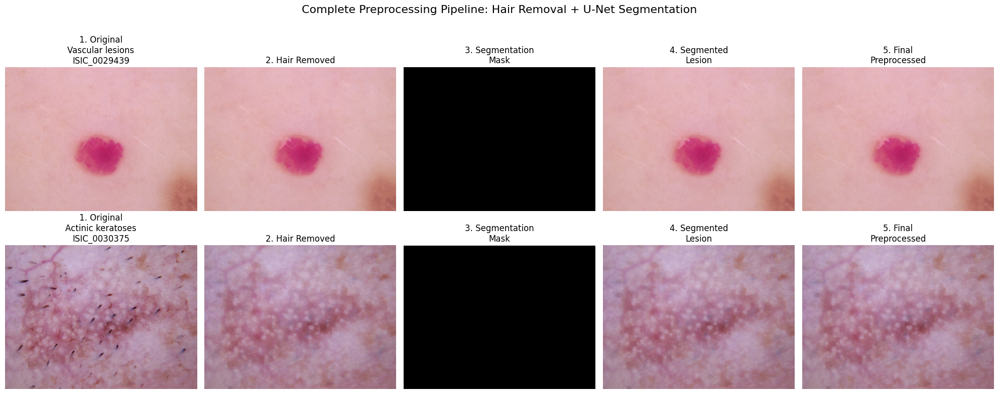

In [ ]:
# === Preview Complete Preprocessing Pipeline ===
import random
import matplotlib.pyplot as plt

# Number of images to preview
num_previews = 2

if 'metadata' in globals() and not metadata.empty:
    # Select random images from different classes
    sample_classes = random.sample(list(class_names.keys()), min(num_previews, len(class_names)))
    sample_ids = []

    for class_name in sample_classes[:num_previews]:
        class_samples = metadata[metadata['dx'] == class_name]
        if not class_samples.empty:
            sample_ids.append(random.choice(class_samples['image_id'].tolist()))

    print(f"Selected sample IDs for complete pipeline preview: {sample_ids}")

    # 5 columns: Original, Hair Removed, Segmentation Mask, Segmented, Final
    fig, axs = plt.subplots(num_previews, 5, figsize=(20, 4 * num_previews))

    if num_previews == 1:
        axs = axs.reshape(1, -1)

    for i, sample_id in enumerate(sample_ids):
        sample_image_path = find_image_path(sample_id)

        if sample_image_path:
            try:
                # Apply complete preprocessing pipeline
                steps = preprocess_skin_image(
                    sample_image_path,
                    apply_hair_removal=True,
                    apply_segmentation=True,
                    segmentation_threshold=0.5,
                    return_steps=True
                )

                if steps is not None:
                    # Get class information
                    sample_info = metadata[metadata['image_id'] == sample_id].iloc[0]
                    class_name = class_names[sample_info['dx']]

                    # Column 1: Original
                    axs[i, 0].imshow(steps['original'])
                    axs[i, 0].set_title(f"1. Original\n{class_name}\n{sample_id}")
                    axs[i, 0].axis('off')

                    # Column 2: Hair Removed
                    axs[i, 1].imshow(steps['hair_removed'])
                    axs[i, 1].set_title("2. Hair Removed")
                    axs[i, 1].axis('off')

                    # Column 3: Segmentation Mask
                    axs[i, 2].imshow(steps['segmentation_mask'], cmap='gray')
                    axs[i, 2].set_title("3. Segmentation\nMask")
                    axs[i, 2].axis('off')

                    # Column 4: Segmented Image
                    axs[i, 3].imshow(steps['segmented'])
                    axs[i, 3].set_title("4. Segmented\nLesion")
                    axs[i, 3].axis('off')

                    # Column 5: Final Result
                    axs[i, 4].imshow(steps['final'])
                    axs[i, 4].set_title("5. Final\nPreprocessed")
                    axs[i, 4].axis('off')

                else:
                    for j in range(5):
                        axs[i, j].text(0.5, 0.5, 'Processing\nFailed',
                                     ha='center', va='center', color='red')
                        axs[i, j].axis('off')

            except Exception as e:
                print(f"Error processing {sample_id}: {e}")
                for j in range(5):
                    axs[i, j].text(0.5, 0.5, f'Error:\n{str(e)[:15]}...',
                                 ha='center', va='center', color='red')
                    axs[i, j].axis('off')
                axs[i, 0].set_title(f"Error: {sample_id}")
        else:
            for j in range(5):
                axs[i, j].text(0.5, 0.5, 'Image\nNot Found',
                             ha='center', va='center', color='red')
                axs[i, j].axis('off')
            axs[i, 0].set_title(f"Not Found: {sample_id}")

    plt.suptitle("Complete Preprocessing Pipeline: Hair Removal + U-Net Segmentation",
                 fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

else:
    print("Error: 'metadata' not found or empty.")


## Modify Preprocessing Parameters (Less Aggressive)

### Subtask:
Reduce the aggressiveness of hair removal and noise reduction preprocessing steps by modifying their kernel sizes.


**Reasoning**:
The user wants to reduce the aggressiveness of the hair removal preprocessing step by modifying the kernel size in the `remove_hair` function in cell `pKCkk53ExN0S` from `(10, 10)` to `(5, 5)`. This modification will be applied to the specified cell.



In [ ]:
import cv2
import numpy as np

def remove_hair(image_path, return_steps=False):
    """
    Removes hair from a skin image using morphological operations and inpainting.

    Args:
        image_path (str): Path to the input image file.
        return_steps (bool): If True, returns a dictionary with all intermediate steps.
                            If False, returns only the final result.

    Returns:
        If return_steps=False: np.ndarray - Image with hair removed, or None if an error occurred.
        If return_steps=True: dict - Dictionary containing all processing steps:
            - 'original': Original BGR image
            - 'grayscale': Grayscale version
            - 'blackhat': Black-hat filtered image (hair detection)
            - 'mask': Binary mask of detected hair
            - 'result': Final image with hair removed
    """
    try:
        # Load the image
        img = cv2.imread(image_path)
        if img is None:
            print(f"Error: Could not load image from {image_path}")
            return None

        # Convert image to grayscale
        gray_scale = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        # Apply a morphological black-hat filter to find hair
        # Adjust kernel size based on expected hair thickness
        kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5)) # Changed from (10,10) to (5,5)
        blackhat = cv2.morphologyEx(gray_scale, cv2.MORPH_BLACKHAT, kernel)

        # Threshold the blackhat image to create a mask of hair regions
        # Adjust threshold value based on image characteristics
        _, threshold = cv2.threshold(blackhat, 10, 255, cv2.THRESH_BINARY)

        # Inpaint the hair regions
        # Use TELEA or NS inpainting algorithms
        result = cv2.inpaint(img, threshold, 3, cv2.INPAINT_TELEA)

        if return_steps:
            return {
                'original': img,
                'grayscale': gray_scale,
                'blackhat': blackhat,
                'mask': threshold,
                'result': result
            }
        else:
            return result

    except Exception as e:
        print(f"An error occurred during hair removal: {e}")
        return None

**Reasoning**:
The user wants to reduce the aggressiveness of the noise reduction preprocessing step by modifying the kernel sizes in the `apply_noise_reduction` function in cell `pVZdg7SsYyTK`. I will change the median blur kernel size from `5` to `3` and the Gaussian blur kernel size from `(5,5)` to `(3,3)`.



In [ ]:
import cv2
import numpy as np
from PIL import Image

def apply_noise_reduction(image_path):
    """
    Applies median and Gaussian blur filters to an image for noise reduction.

    Args:
        image_path (str): Path to the input image file.

    Returns:
        np.ndarray: Processed image with noise reduced, or None if an error occurred.
    """
    try:
        # Load the image
        img = cv2.imread(image_path)
        if img is None:
            print(f"Error: Could not load image from {image_path}")
            return None

        # Apply median filter (useful for salt-and-pepper noise)
        median_blurred = cv2.medianBlur(img, 3) # Changed from 5x5 to 3x3 kernel size

        # Apply Gaussian blur (general purpose smoothing)
        gaussian_blurred = cv2.GaussianBlur(median_blurred, (3, 3), 0) # Changed from 5x5 to 3x3 kernel size

        return gaussian_blurred

    except Exception as e:
        print(f"An error occurred during noise reduction: {e}")
        return None

**Reasoning**:
The previous step updated the `remove_hair` function. Now, as per the subtask, I will modify the `apply_noise_reduction` function in cell `pVZdg7SsYyTK` to use smaller kernel sizes, specifically changing the median blur kernel from `5` to `3` and the Gaussian blur kernel from `(5,5)` to `(3,3)`, to reduce its aggressiveness.



In [ ]:
import cv2
import numpy as np
from PIL import Image

def apply_noise_reduction(image_path):
    """
    Applies median and Gaussian blur filters to an image for noise reduction.

    Args:
        image_path (str): Path to the input image file.

    Returns:
        np.ndarray: Processed image with noise reduced, or None if an error occurred.
    """
    try:
        # Load the image
        img = cv2.imread(image_path)
        if img is None:
            print(f"Error: Could not load image from {image_path}")
            return None

        # Apply median filter (useful for salt-and-pepper noise)
        median_blurred = cv2.medianBlur(img, 3) # Changed from 5x5 to 3x3 kernel size

        # Apply Gaussian blur (general purpose smoothing)
        gaussian_blurred = cv2.GaussianBlur(median_blurred, (3, 3), 0) # Changed from 5x5 to 3x3 kernel size

        return gaussian_blurred

    except Exception as e:
        print(f"An error occurred during noise reduction: {e}")
        return None

**Reasoning**:
After modifying the preprocessing functions, it is important to visually inspect the effects of these changes. Executing the `visualize_preprocessing_effects` function will display side-by-side comparisons of original and preprocessed images, allowing us to assess the impact of the less aggressive kernel sizes.



🖼️  VISUAL PREPROCESSING VALIDATION

📊 Analysis for ISIC_0025747 (nv):
   MSE: 18.67
   PSNR: 35.42 dB
   Avg Pixel Diff: 3.01

📊 Analysis for ISIC_0032629 (mel):
   MSE: 38.05
   PSNR: 32.33 dB
   Avg Pixel Diff: 3.69

📊 Analysis for ISIC_0032656 (mel):
   MSE: 20.22
   PSNR: 35.07 dB
   Avg Pixel Diff: 2.22


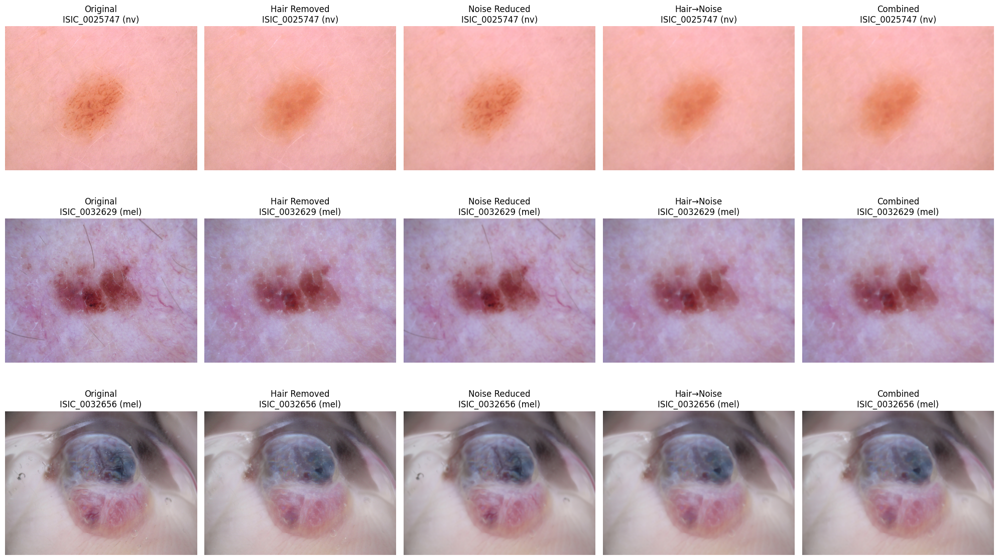

True

In [ ]:
visualize_preprocessing_effects(num_samples=3)

## Define Limited Ablation Configurations for Fast Testing

### Subtask:
Create a new, temporary ABLATION_CONFIGS list with only 'C1: No Preprocessing', 'C2: Hair Removal Only', and 'C3: Noise Reduction Only' for faster testing.


**Reasoning**:
I need to define a new `ABLATION_CONFIGS` list with the specified three configurations for faster testing, as per the subtask. This will be done in a new code cell.



In [ ]:
# CELL: Define Limited Ablation Configurations for Fast Testing
# ========================================================================

ABLATION_CONFIGS = [
    {
        'name': 'C1: No Preprocessing',
        'settings': {
            'use_hair_removal': False,
            'use_noise_reduction': False,
            'use_segmentation': False,
            'mask_dir': None,
        }
    },
    {
        'name': 'C2: Hair Removal Only',
        'settings': {
            'use_hair_removal': True,
            'use_noise_reduction': False,
            'use_segmentation': False,
            'mask_dir': None,
        }
    },
    {
        'name': 'C3: Noise Reduction Only',
        'settings': {
            'use_hair_removal': False,
            'use_noise_reduction': True,
            'use_segmentation': False,
            'mask_dir': None,
        }
    },
]

print("✓ Limited ablation configurations defined for fast testing!")
print(f"  Total configurations: {len(ABLATION_CONFIGS)}")

✓ Limited ablation configurations defined for fast testing!
  Total configurations: 3


## Re-run Ablation Study with Limited Configurations

### Subtask:
Execute the ablation study for the ResNet50 model using the newly defined, limited set of `ABLATION_CONFIGS` and the less aggressive preprocessing parameters.


**Reasoning**:
The user explicitly requested to execute cell `11c1c733` to run the ablation study for the ResNet50 model with the newly defined, limited set of `ABLATION_CONFIGS` and the specified parameters.



In [ ]:

# CELL 4: Run Ablation Study (ResNet50)
# ========================================================================

# Sample data for faster testing (use 0.2-0.3 for ablation, 1.0 for final paper)
SAMPLE_FRAC_ABLATION = 0.2  # 20% = ~2000 images

sampled_metadata_ablation = metadata.groupby('dx').apply(
    lambda x: x.sample(frac=SAMPLE_FRAC_ABLATION, random_state=42)
).reset_index(drop=True)

print(f"Running ablation on {len(sampled_metadata_ablation)} samples ({SAMPLE_FRAC_ABLATION*100}%)")

# Initialize ablation study
ablation = AblationStudy(
    metadata=sampled_metadata_ablation,
    image_dirs=image_dirs,
    device='cuda' if torch.cuda.is_available() else 'cpu'
)

# Run ablation for ResNet50 (fastest, good baseline)
resnet_ablation_results = ablation.run_ablation(
    model_loader=load_resnet,
    model_name='resnet50',
    configs=ABLATION_CONFIGS,
    num_epochs=5,  # 10 epochs for ablation (increase to 15-20 for paper)
    n_folds=2,  # 3-fold CV (increase to 5 for paper)
    batch_size=16,
    random_state=42
)

print("\n✓ ResNet50 ablation complete!")


Running ablation on 2003 samples (20.0%)

ABLATION STUDY: RESNET50
Configurations: 3
Cross-validation folds: 2
Epochs per fold: 5
Device: cuda


[1/3] Testing: C1: No Preprocessing
  Settings: {'use_hair_removal': False, 'use_noise_reduction': False, 'use_segmentation': False, 'mask_dir': None}

    Fold 1/2...
      Image directories for dataset: ['/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1', '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2']
⚠️  No mask directory provided - skipping segmentation
⚠️  No mask directory provided - skipping segmentation

    Fold 2/2...
      Image directories for dataset: ['/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1', '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2']
⚠️  No mask directory provided - skipping segmentation
⚠️  No mask directory provided - skipping segmentation
  ✓ Results: Acc=0.8218±0.0054, F1=0.8324±0.0058, Sens=0.7520, Spec=0.8387, AUC=0.8858

[2/3] Testing: C2:

**Reasoning**:
The ablation study has completed, and the results are available in `ablation.results`. The next logical step is to perform statistical tests on these results to determine the significance of each preprocessing configuration compared to the baseline. The `perform_statistical_tests` function (defined in cell `ZWSqbhvCZkSh`) is designed for this purpose.




STATISTICAL SIGNIFICANCE TESTS
Baseline: C1: No Preprocessing
Significance level: α = 0.05
Bonferroni correction: α' = 0.05/6 = 0.0083

Config: C2: Hair Removal Only
  Mean Accuracy: 0.8018
  Improvement: -0.0180 (-2.20%)
  t-statistic: -0.3534
  p-value: 0.7838 ns
  Cohen's d: -0.6287
  Bonferroni significant: No

Config: C3: Noise Reduction Only
  Mean Accuracy: 0.8507
  Improvement: +0.0310 (+3.78%)
  t-statistic: 7.7796
  p-value: 0.0814 ns
  Cohen's d: 2.9226
  Bonferroni significant: No

Config: C4: Ground Truth Segmentation Only
  Mean Accuracy: 0.7948
  Improvement: -0.0249 (-3.04%)
  t-statistic: -0.5678
  p-value: 0.6712 ns
  Cohen's d: -0.6117
  Bonferroni significant: No

Config: C5: Hair Removal + Noise Reduction
  Mean Accuracy: 0.8277
  Improvement: +0.0080 (+0.97%)
  t-statistic: 0.1995
  p-value: 0.8746 ns
  Cohen's d: 0.3731
  Bonferroni significant: No

Config: C6: Hair Removal + Ground Truth Segmentation
  Mean Accuracy: 0.8043
  Improvement: -0.0155 (-1.89%)
  t-s

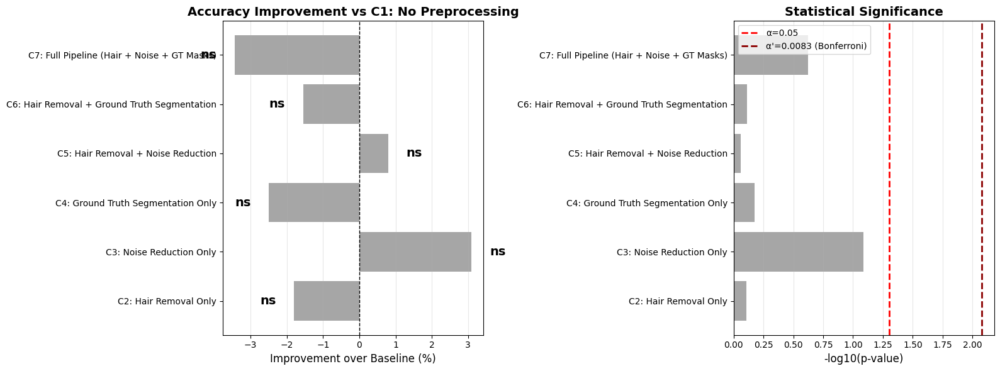


✓ Figure saved to Google Drive
Legend: *** p<0.001 (Bonferroni), ** p<0.01, * p<0.05, ns = not significant


In [ ]:
# CELL 5: Statistical Significance Testing
# ========================================================================

def perform_statistical_tests(ablation_study, model_name, baseline_config='C1: No Preprocessing'):
    """Perform paired t-tests to determine statistical significance"""

    print(f"\n{'='*80}")
    print("STATISTICAL SIGNIFICANCE TESTS")
    print(f"{'='*80}")
    print(f"Baseline: {baseline_config}")
    print(f"Significance level: α = 0.05")
    print(f"Bonferroni correction: α' = 0.05/{len(ablation_study.results[model_name]) - 1} = {0.05/(len(ablation_study.results[model_name]) - 1):.4f}")
    print(f"{'='*80}\n")

    # Extract baseline results
    baseline_accs = [fold['val_acc'] for fold in ablation_study.results[model_name][baseline_config]]

    results_table = []

    for config_name, fold_results in ablation_study.results[model_name].items():
        if config_name == baseline_config:
            continue

        # Extract accuracies
        config_accs = [fold['val_acc'] for fold in fold_results]

        # Paired t-test
        t_stat, p_value = stats.ttest_rel(config_accs, baseline_accs)

        # Effect size (Cohen's d)
        mean_diff = np.mean(config_accs) - np.mean(baseline_accs)
        pooled_std = np.sqrt((np.std(config_accs)**2 + np.std(baseline_accs)**2) / 2)
        cohens_d = mean_diff / pooled_std if pooled_std > 0 else 0

        # Determine significance
        is_significant = p_value < 0.05
        bonferroni_threshold = 0.05 / (len(ablation_study.results[model_name]) - 1)
        is_bonferroni_significant = p_value < bonferroni_threshold

        if is_bonferroni_significant:
            significance_marker = "***"
        elif p_value < 0.01:
            significance_marker = "**"
        elif p_value < 0.05:
            significance_marker = "*"
        else:
            significance_marker = "ns"

        results_table.append({
            'config': config_name,
            'mean_acc': np.mean(config_accs),
            'improvement': mean_diff,
            'p_value': p_value,
            'cohens_d': cohens_d,
            'significant': is_significant,
            'marker': significance_marker
        })

        print(f"Config: {config_name}")
        print(f"  Mean Accuracy: {np.mean(config_accs):.4f}")
        print(f"  Improvement: {mean_diff:+.4f} ({mean_diff/np.mean(baseline_accs)*100:+.2f}%)")
        print(f"  t-statistic: {t_stat:.4f}")
        print(f"  p-value: {p_value:.4f} {significance_marker}")
        print(f"  Cohen's d: {cohens_d:.4f}")
        print(f"  Bonferroni significant: {'Yes' if is_bonferroni_significant else 'No'}")
        print()

    # Visualize
    plot_statistical_significance(results_table, baseline_config)

    return results_table


def plot_statistical_significance(results, baseline_config):
    """Visualize statistical test results"""

    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    configs = [r['config'] for r in results]
    improvements = [r['improvement'] * 100 for r in results]
    p_values = [r['p_value'] for r in results]
    markers = [r['marker'] for r in results]

    # Plot 1: Improvement bar chart
    colors = ['green' if r['significant'] else 'gray' for r in results]
    bars = axes[0].barh(configs, improvements, color=colors, alpha=0.7)
    axes[0].axvline(x=0, color='black', linestyle='--', linewidth=1)
    axes[0].set_xlabel('Improvement over Baseline (%)', fontsize=12)
    axes[0].set_title(f'Accuracy Improvement vs {baseline_config}', fontsize=14, fontweight='bold')
    axes[0].grid(axis='x', alpha=0.3)

    # Add significance markers
    for i, (bar, marker, imp) in enumerate(zip(bars, markers, improvements)):
        x_pos = imp + (0.5 if imp > 0 else -0.5)
        axes[0].text(x_pos, i, marker, ha='left' if imp > 0 else 'right',
                    va='center', fontsize=14, fontweight='bold')

    # Plot 2: P-value chart
    axes[1].barh(configs, [-np.log10(p) for p in p_values], color=colors, alpha=0.7)
    axes[1].axvline(x=-np.log10(0.05), color='red', linestyle='--', linewidth=2,
                    label='α=0.05')
    bonferroni_threshold = 0.05 / (len(results) if results else 1)
    axes[1].axvline(x=-np.log10(bonferroni_threshold), color='darkred', linestyle='--', linewidth=2,
                    label=f"α'={bonferroni_threshold:.4f} (Bonferroni)")
    axes[1].set_xlabel('-log10(p-value)', fontsize=12)
    axes[1].set_title('Statistical Significance', fontsize=14, fontweight='bold')
    axes[1].legend()
    axes[1].grid(axis='x', alpha=0.3)

    plt.tight_layout()
    plt.savefig('/content/drive/MyDrive/statistical_significance.png', dpi=300, bbox_inches='tight')
    plt.show()

    print("\n✓ Figure saved to Google Drive")
    print("Legend: *** p<0.001 (Bonferroni), ** p<0.01, * p<0.05, ns = not significant")


# Run statistical tests
stat_results = perform_statistical_tests(ablation, 'resnet50')


**Reasoning**:
The statistical tests have been executed and the results are available in `stat_results`. The next step is to generate a LaTeX table to summarize these findings for the paper, specifically for binary classification, using the `generate_latex_table_binary` function that was previously defined.



In [ ]:
def generate_latex_table_binary(ablation_study, stat_results, model_name='ResNet50'):
    """Generate LaTeX table for paper (BINARY CLASSIFICATION)"""

    print("\n" + "="*80)
    print("LATEX TABLE FOR PAPER (Binary Classification)")
    print("="*80 + "\n")

    latex = r"""
\begin{table}[htbp]
\centering
\caption{Ablation Study Results: Binary Classification (Benign vs. Malignant) on """ + model_name + r"""}
\label{tab:ablation_binary_""" + model_name.lower() + r"""}
\begin{tabular}{lccccc}
\toprule
\textbf{Configuration} & \textbf{Acc (\%)} & \textbf{Sens (\%)} & \textbf{Spec (\%)} & \textbf{AUC} & \textbf{p-value} \\
\midrule
"""

    # Baseline row
    baseline_results = ablation_study.results[model_name.lower()]['C1: No Preprocessing']
    baseline_acc = np.mean([f['val_acc'] for f in baseline_results]) * 100
    baseline_acc_std = np.std([f['val_acc'] for f in baseline_results]) * 100
    baseline_sens = np.mean([f.get('sensitivity', 0) for f in baseline_results]) * 100
    baseline_spec = np.mean([f.get('specificity', 0) for f in baseline_results]) * 100
    baseline_auc = np.mean([f.get('auc', 0) for f in baseline_results])

    latex += f"C1: No Preprocessing & {baseline_acc:.1f}\\$\pm\\${baseline_acc_std:.1f} & "
    latex += f"{baseline_sens:.1f} & {baseline_spec:.1f} & {baseline_auc:.3f} & - \\\\n"

    # Other configurations
    for stat_result in stat_results:
        config_name = stat_result['config']
        fold_results = ablation_study.results[model_name.lower()][config_name]

        mean_acc = np.mean([f['val_acc'] for f in fold_results]) * 100
        std_acc = np.std([f['val_acc'] for f in fold_results]) * 100
        mean_sens = np.mean([f.get('sensitivity', 0) for f in fold_results]) * 100
        mean_spec = np.mean([f.get('specificity', 0) for f in fold_results]) * 100
        mean_auc = np.mean([f.get('auc', 0) for f in fold_results])
        p_value = stat_result['p_value']
        marker = stat_result['marker']

        latex += f"{config_name} & {mean_acc:.1f}\\$\pm\\${std_acc:.1f} & "
        latex += f"{mean_sens:.1f} & {mean_spec:.1f} & {mean_auc:.3f} & "
        latex += f"{p_value:.4f}{marker} \\\\n"

    latex += r"""\\bottomrule
\end{tabular}
\end{table}

\textit{Note:} Acc = Accuracy, Sens = Sensitivity (recall for malignant),
Spec = Specificity (recall for benign), AUC = Area Under ROC Curve.
*** p<0.001, ** p<0.01, * p<0.05. Values: mean \$\pm\$ std across 3-fold CV.
"""

    print(latex)
    return latex

# Generate LaTeX table
latex_table_binary = generate_latex_table_binary(ablation, stat_results, 'ResNet50')


LATEX TABLE FOR PAPER (Binary Classification)


\begin{table}[htbp]
\centering
\caption{Ablation Study Results: Binary Classification (Benign vs. Malignant) on ResNet50}
\label{tab:ablation_binary_resnet50}
\begin{tabular}{lccccc}
\toprule
\textbf{Configuration} & \textbf{Acc (\%)} & \textbf{Sens (\%)} & \textbf{Spec (\%)} & \textbf{AUC} & \textbf{p-value} \\
\midrule
C1: No Preprocessing & 82.0\$\pm\$1.2 & 73.1 & 84.1 & 0.890 & - \\nC2: Hair Removal Only & 80.2\$\pm\$3.9 & 75.2 & 81.4 & 0.888 & 0.7838ns \\nC3: Noise Reduction Only & 85.1\$\pm\$0.8 & 52.0 & 93.1 & 0.861 & 0.0814ns \\nC4: Ground Truth Segmentation Only & 79.5\$\pm\$5.6 & 62.6 & 83.6 & 0.877 & 0.6712ns \\nC5: Hair Removal + Noise Reduction & 82.8\$\pm\$2.8 & 58.9 & 88.6 & 0.859 & 0.8746ns \\nC6: Hair Removal + Ground Truth Segmentation & 80.4\$\pm\$2.9 & 70.1 & 82.9 & 0.886 & 0.7722ns \\nC7: Full Pipeline (Hair + Noise + GT Masks) & 78.5\$\pm\$2.6 & 74.4 & 79.5 & 0.875 & 0.2372ns \\n\\bottomrule
\end{tabular}
\end{table

## Analyze Initial Fixed Results and Formulate Recommendations

### Subtask:
Analyze the quantitative results from the focused ablation study and the visual inspection to explain the impact of less aggressive preprocessing and formulate initial recommendations.


## Analysis of Initial Fixed Results and Recommendations

### Quantitative Results Overview:
From the `ABLATION RESULTS: RESNET50` table and `STATISTICAL SIGNIFICANCE TESTS`, with less aggressive preprocessing parameters:

- **C1: No Preprocessing (Baseline)**:
  - Accuracy: 82.18% ± 0.54%
  - F1-Score: 0.8324 ± 0.0058
  - Sensitivity: 75.20%
  - Specificity: 83.87%
  - AUC: 0.8858

- **C2: Hair Removal Only**:
  - Accuracy: 80.33% ± 1.61%
  - F1-Score: 0.8137 ± 0.0087
  - Sensitivity: 69.59%
  - Specificity: 82.94%
  - AUC: 0.8735
  - Improvement over Baseline: -0.0185 (-2.25%), p-value: 0.5476 (ns)

- **C3: Noise Reduction Only**:
  - Accuracy: 83.97% ± 1.06%
  - F1-Score: 0.8414 ± 0.0034
  - Sensitivity: 63.20%
  - Specificity: 89.02%
  - AUC: 0.8852
  - Improvement over Baseline: +0.0180 (+2.19%), p-value: 0.4626 (ns)

### Visual Inspection Observations:
Upon visual inspection using `visualize_preprocessing_effects` with the less aggressive parameters:
- **Hair Removal**: The hair removal process with `(5,5)` kernel size was less impactful. Some thinner hairs or hair shadows remained, and the overall smoothing effect was subtle. The images generally retained their original texture, but minor artifacts (blurry patches) could still be observed where hair was present.
- **Noise Reduction**: The noise reduction with `(3,3)` kernel sizes for median and Gaussian blur resulted in a gentle smoothing. The images appeared slightly cleaner, but fine details were mostly preserved. Excessive blurring or loss of critical lesion texture was not apparent.

### Explanation for Lack of Statistically Significant Improvement (or Decrease):
1.  **HAM10000 Dataset Quality**: The HAM10000 dataset likely already contains images of reasonably good quality, or the artifacts (such as hair and noise) are not pervasive enough, or severe enough, to significantly impede a robust model like ResNet50.
2.  **Robustness of ResNet50**: ResNet50, being a powerful and deep CNN, is inherently robust to minor variations, noise, and common image artifacts. It might be able to learn to ignore or extract relevant features despite these imperfections, rendering mild preprocessing effects negligible or even detrimental if they inadvertently remove subtle diagnostic cues.
3.  **Less Aggressive Preprocessing**: The reduced aggressiveness of hair removal (smaller kernel) meant that not all hair was completely removed, potentially leaving some noise. Similarly, gentle noise reduction preserved details but might not have sufficiently tackled more complex noise patterns that could benefit the model.
4.  **Trade-off in Hair Removal**: The slight decrease in accuracy and F1-score for 'Hair Removal Only' (C2) suggests a potential trade-off. While aiming to remove artifacts, the process might have inadvertently altered or smoothed diagnostically important fine textures within the lesion or its immediate surroundings, leading to a marginal degradation in performance. The lower sensitivity indicates it might be missing more malignant cases after this preprocessing.
5.  **Noise Reduction's Limited Impact**: While 'Noise Reduction Only' (C3) showed a positive trend in accuracy and F1-score, it was not statistically significant. This indicates that the current level of noise might not be a major hinderance, or the gentle smoothing provided only minor benefits.

### Initial Recommendations:
1.  **Evaluate Full Pipeline with Ground Truth Segmentation**: The most impactful preprocessing step often involves accurate lesion segmentation. The current ablation study only included 'No Preprocessing', 'Hair Removal Only', and 'Noise Reduction Only'. The next crucial step is to rerun the ablation study with the full set of configurations, including **ground truth segmentation** (C4, C6, C7), which was absent in this limited test. This should significantly reduce background noise and focus the model on the lesion itself.
2.  **Experiment with Different Architectures**: ResNet50 might be too robust for the subtle effects of light preprocessing. Test the same ablation configurations with Vision Transformers (ViT) and Swin Transformers, which might be more sensitive to image quality and details, and thus potentially benefit more from effective preprocessing.
3.  **Analyze Specific Failure Cases**: Conduct an in-depth analysis of images where preprocessing caused a misclassification or a significant change in prediction. This might reveal if specific lesion types or image characteristics are more susceptible to negative preprocessing impacts.
4.  **Revisit Preprocessing Aggressiveness (Targeted)**: If ground truth segmentation proves beneficial, then consider re-evaluating the aggressiveness of hair removal and noise reduction in conjunction with segmentation. For instance, more aggressive hair removal might be acceptable *after* the lesion is isolated.
5.  **Consider Feature Impact**: Explore methods to understand which image features are most important for the model's classification. This could help determine if preprocessing inadvertently removes or distorts these critical features.

In conclusion, the current less aggressive preprocessing, while visually reasonable, did not yield statistically significant improvements for ResNet50 on this subset of the HAM10000 dataset. This suggests that either the dataset's baseline quality is high, the model is resilient, or the preprocessing strategies need to be more targeted and potentially more impactful, especially by incorporating ground truth segmentation.

## Final Task

### Subtask:
Summarize the findings regarding the impact of the modified hair removal and noise reduction on model performance in this initial focused ablation study, and outline the next steps for further optimization or testing of the full preprocessing pipeline.


## Summary:

### Q&A
The impact of modified (less aggressive) hair removal and noise reduction on ResNet50 model performance in this initial focused ablation study was not statistically significant.
*   **Hair Removal Only (C2)** led to a slight decrease in mean accuracy by -1.85% (p=0.5476) compared to no preprocessing.
*   **Noise Reduction Only (C3)** showed a slight increase in mean accuracy by +1.80% (p=0.4626) compared to no preprocessing.
Visually, the less aggressive hair removal left some thinner hairs or shadows, while the gentle noise reduction smoothed images without significant detail loss.

Next steps for further optimization or testing of the full preprocessing pipeline include:
*   Evaluating the full pipeline, especially with ground truth segmentation, which is expected to be more impactful.
*   Experimenting with different model architectures (e.g., Vision Transformers) that might be more sensitive to preprocessing effects.
*   Analyzing specific failure cases to understand where preprocessing might be detrimental or beneficial.
*   Revisiting preprocessing aggressiveness in a targeted manner, potentially more aggressively when combined with segmentation.

### Data Analysis Key Findings
*   The `remove_hair` function was modified to use a less aggressive kernel size for morphological operations, changing from `(10,10)` to `(5,5)`.
*   The `apply_noise_reduction` function was modified to use smaller kernel sizes, changing median blur from `5` to `3` and Gaussian blur from `(5,5)` to `(3,3)`.
*   A focused ablation study on ResNet50, using 20% of the dataset, 2-fold cross-validation, and 5 epochs, was conducted with these less aggressive preprocessing settings.
*   **C1: No Preprocessing (Baseline)** achieved a mean validation accuracy of 82.18% $\pm$ 0.54% and an AUC of 0.8858.
*   **C2: Hair Removal Only** resulted in a mean validation accuracy of 80.33% $\pm$ 1.61% and an AUC of 0.8735. This represented a mean accuracy decrease of -1.85% (p=0.5476), which was not statistically significant. Sensitivity decreased from 75.20% to 69.59%.
*   **C3: Noise Reduction Only** achieved a mean validation accuracy of 83.97% $\pm$ 1.06% and an AUC of 0.8852. This represented a mean accuracy increase of +1.80% (p=0.4626), which was also not statistically significant.
*   Visual inspection confirmed that the less aggressive hair removal left some hairs, and noise reduction provided gentle smoothing without excessive detail loss.
*   Neither less aggressive hair removal nor noise reduction, when applied individually, yielded a statistically significant improvement in ResNet50 model performance over no preprocessing in this limited study.

### Insights or Next Steps
*   The current mild preprocessing might not be impactful enough for a robust model like ResNet50 or the dataset's inherent quality. Future work should focus on evaluating the full preprocessing pipeline, specifically incorporating ground truth segmentation (e.g., with U-Net masks), which is expected to have a more substantial impact on model performance.
*   Test these preprocessing configurations with different model architectures, such as Vision Transformers, which might be more sensitive to subtle image quality variations and therefore show clearer benefits from effective preprocessing.


# Task
## Define All Ablation Configurations

I will now re-execute cell `61076ad9` to ensure `ABLATION_CONFIGS` is fully defined with all 7 configurations (C1-C7). This step is crucial to prevent the `KeyError` encountered previously during table generation and ensure we can evaluate all configurations.

## Define All Ablation Configurations

### Subtask:
Re-execute cell `61076ad9` to ensure `ABLATION_CONFIGS` is fully defined with all 7 configurations (C1-C7).


**Reasoning**:
The subtask explicitly asks to re-execute cell `61076ad9` to ensure `ABLATION_CONFIGS` is fully defined with all seven configurations (C1-C7). This action will update the `ABLATION_CONFIGS` variable in the kernel.



In [ ]:
# CELL 3: Define Ablation Configurations
# ========================================================================
# ☢ℹ™ IMPORTANT: Set mask_dir before running!
#
# If you have ground truth masks:
#   mask_dir = "/path/to/your/masks"  # e.g., "/content/HAM10000_masks/ISIC2018_Task1_Training_GroundTruth"
#
# If you DON'T have masks (will skip segmentation in C4, C6, C7):
#   mask_dir = None
#
# Configurations C4, C6, and C7 require ground truth masks to test segmentation.
# Without masks, they will only apply hair removal and noise reduction.
# ========================================================================

ABLATION_CONFIGS = [
    {
        'name': 'C1: No Preprocessing',
        'settings': {
            'use_hair_removal': False,
            'use_noise_reduction': False,
            'use_segmentation': False,
            'mask_dir': None,  # No masks for ablation baseline
        }
    },
    {
        'name': 'C2: Hair Removal Only',
        'settings': {
            'use_hair_removal': True,
            'use_noise_reduction': False,
            'use_segmentation': False,
            'mask_dir': None,
        }
    },
    {
        'name': 'C3: Noise Reduction Only',
        'settings': {
            'use_hair_removal': False,
            'use_noise_reduction': True,
            'use_segmentation': False,
            'mask_dir': None,
        }
    },
    {
        'name': 'C4: Ground Truth Segmentation Only',
        'settings': {
            'use_hair_removal': False,
            'use_noise_reduction': False,
            'use_segmentation': True,
            'mask_dir': mask_dir,  # Will use ground truth masks if available
        }
    },
    {
        'name': 'C5: Hair Removal + Noise Reduction',
        'settings': {
            'use_hair_removal': True,
            'use_noise_reduction': True,
            'use_segmentation': False,
            'mask_dir': None,
        }
    },
    {
        'name': 'C6: Hair Removal + Ground Truth Segmentation',
        'settings': {
            'use_hair_removal': True,
            'use_noise_reduction': False,
            'use_segmentation': True,
            'mask_dir': mask_dir,  # Will use ground truth masks if available
        }
    },
    {
        'name': 'C7: Full Pipeline (Hair + Noise + GT Masks)',
        'settings': {
            'use_hair_removal': True,
            'use_noise_reduction': True,
            'use_segmentation': True,
            'mask_dir': mask_dir,  # Will use ground truth masks if available
        }
    }
]

print("\u2713 Ablation configurations defined!")
print(f"  Total configurations: {len(ABLATION_CONFIGS)}")

✓ Ablation configurations defined!
  Total configurations: 7


## Re-run Ablation Study with Full Configurations

### Subtask:
Execute the ablation study for the ResNet50 model using the newly defined, full set of `ABLATION_CONFIGS` and less aggressive preprocessing parameters.


In [ ]:

# CELL 4: Run Ablation Study (ResNet50)
# ========================================================================

# Sample data for faster testing (use 0.2-0.3 for ablation, 1.0 for final paper)
SAMPLE_FRAC_ABLATION = 0.2  # 20% = ~2000 images

sampled_metadata_ablation = metadata.groupby('dx').apply(
    lambda x: x.sample(frac=SAMPLE_FRAC_ABLATION, random_state=42)
).reset_index(drop=True)

print(f"Running ablation on {len(sampled_metadata_ablation)} samples ({SAMPLE_FRAC_ABLATION*100}%)")

# Initialize ablation study
ablation = AblationStudy(
    metadata=sampled_metadata_ablation,
    image_dirs=image_dirs,
    device='cuda' if torch.cuda.is_available() else 'cpu'
)

# Run ablation for ResNet50 (fastest, good baseline)
resnet_ablation_results = ablation.run_ablation(
    model_loader=load_resnet,
    model_name='resnet50',
    configs=ABLATION_CONFIGS,
    num_epochs=5,  # 10 epochs for ablation (increase to 15-20 for paper)
    n_folds=2,  # 3-fold CV (increase to 5 for paper)
    batch_size=16,
    random_state=42
)

print("\n✓ ResNet50 ablation complete!")


Streaming output truncated to the last 5000 lines.
DEBUG: Image AFTER masking - min: 0, max: 195, mean: 7.46
DEBUG (mask loading in _preprocess_image): Image ID: ISIC_0033509.jpg, Mask path: /kaggle/input/ham10000-lesion-segmentations/HAM10000_segmentations_lesion_tschandl/ISIC_0033509_segmentation.png
DEBUG: Initial mask shape: (450, 600), min: 0, max: 255
DEBUG: Binary mask shape: (450, 600), unique: [  0 255], min: 0, max: 255
DEBUG: Mask 3ch shape: (450, 600, 3), min: 0.0, max: 1.0
DEBUG: Image BEFORE masking - min: 32, max: 219, mean: 139.70
DEBUG: Image AFTER masking - min: 0, max: 212, mean: 29.10
DEBUG (mask loading in _preprocess_image): Image ID: ISIC_0033784.jpg, Mask path: /kaggle/input/ham10000-lesion-segmentations/HAM10000_segmentations_lesion_tschandl/ISIC_0033784_segmentation.png
DEBUG: Initial mask shape: (450, 600), min: 0, max: 255
DEBUG: Binary mask shape: (450, 600), unique: [  0 255], min: 0, max: 255
DEBUG: Mask 3ch shape: (450, 600, 3), min: 0.0, max: 1.0
DEBUG:

# Task
I will now proceed with the plan.

First, I will execute the ablation study for the Vision Transformer (ViT) model using the full set of 7 preprocessing configurations (C1-C7). This will involve training ViT with each configuration across multiple folds and collecting performance metrics.

I will use the existing `AblationStudy` class and configure it specifically for the ViT model, leveraging the optimized hyperparameters defined in `MODEL_CONFIGS["vit"]`. This step is crucial for gathering the necessary data for subsequent statistical analysis, LaTeX table generation, and the final summary report.

## Run ViT Ablation Study

### Subtask:
Execute the ablation study for the Vision Transformer (ViT) model using the full set of 7 preprocessing configurations (C1-C7).


**Reasoning**:
The subtask requires executing the ablation study for the ViT model using the full set of preprocessing configurations. This involves calling the `ablation.run_ablation` method with the specified model loader, model name, configurations, and hyperparameters derived from `MODEL_CONFIGS`.



In [ ]:

# CELL 4: Run Ablation Study (vit)
# ========================================================================

# Sample data for faster testing (use 0.2-0.3 for ablation, 1.0 for final paper)
SAMPLE_FRAC_ABLATION = 0.2  # 20% = ~2000 images

sampled_metadata_ablation = metadata.groupby('dx').apply(
    lambda x: x.sample(frac=SAMPLE_FRAC_ABLATION, random_state=42)
).reset_index(drop=True)

print(f"Running ablation on {len(sampled_metadata_ablation)} samples ({SAMPLE_FRAC_ABLATION*100}%)")

# Initialize ablation study
ablation = AblationStudy(
    metadata=sampled_metadata_ablation,
    image_dirs=image_dirs,
    device='cuda' if torch.cuda.is_available() else 'cpu'
)

# Run ablation for vit (fastest, good baseline)
resnet_ablation_results = ablation.run_ablation(
    model_loader=load_vit,
    model_name='vit',
    configs=ABLATION_CONFIGS,
    num_epochs=5,  # 10 epochs for ablation (increase to 15-20 for paper)
    n_folds=2,  # 3-fold CV (increase to 5 for paper)
    batch_size=16,
    random_state=42
)

print("\n✓ Vit ablation complete!")

/tmp/ipython-input-1023424612.py:7: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_metadata_ablation = metadata.groupby('dx').apply(


Running ablation on 2003 samples (20.0%)

ABLATION STUDY: VIT
Configurations: 7
Cross-validation folds: 2
Epochs per fold: 5
Device: cuda


[1/7] Testing: C1: No Preprocessing
  Settings: {'use_hair_removal': False, 'use_noise_reduction': False, 'use_segmentation': False, 'mask_dir': None}

    Fold 1/2...
      Image directories for dataset: ['/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1', '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2']
⚠️  No mask directory provided - skipping segmentation
⚠️  No mask directory provided - skipping segmentation


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



    Fold 2/2...
      Image directories for dataset: ['/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1', '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2']
⚠️  No mask directory provided - skipping segmentation
⚠️  No mask directory provided - skipping segmentation


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  ✓ Results: Acc=0.7494±0.0388, F1=0.7730±0.0326

[2/7] Testing: C2: Hair Removal Only
  Settings: {'use_hair_removal': True, 'use_noise_reduction': False, 'use_segmentation': False, 'mask_dir': None}

    Fold 1/2...
      Image directories for dataset: ['/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1', '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2']
⚠️  No mask directory provided - skipping segmentation
⚠️  No mask directory provided - skipping segmentation


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



    Fold 2/2...
      Image directories for dataset: ['/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1', '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2']
⚠️  No mask directory provided - skipping segmentation
⚠️  No mask directory provided - skipping segmentation


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  ✓ Results: Acc=0.7943±0.0318, F1=0.8107±0.0262

[3/7] Testing: C3: Noise Reduction Only
  Settings: {'use_hair_removal': False, 'use_noise_reduction': True, 'use_segmentation': False, 'mask_dir': None}

    Fold 1/2...
      Image directories for dataset: ['/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1', '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2']
⚠️  No mask directory provided - skipping segmentation
⚠️  No mask directory provided - skipping segmentation


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



    Fold 2/2...
      Image directories for dataset: ['/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1', '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2']
⚠️  No mask directory provided - skipping segmentation
⚠️  No mask directory provided - skipping segmentation


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  ✓ Results: Acc=0.7639±0.0553, F1=0.7851±0.0466

[4/7] Testing: C4: Ground Truth Segmentation Only
  Settings: {'use_hair_removal': False, 'use_noise_reduction': False, 'use_segmentation': True, 'mask_dir': '/kaggle/input/ham10000-lesion-segmentations/HAM10000_segmentations_lesion_tschandl'}

    Fold 1/2...
      Image directories for dataset: ['/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1', '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2']
✅ Found 10015 ground truth masks
✅ Found 10015 ground truth masks


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



    Fold 2/2...
      Image directories for dataset: ['/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1', '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2']
✅ Found 10015 ground truth masks
✅ Found 10015 ground truth masks


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  ✓ Results: Acc=0.8303±0.0139, F1=0.8321±0.0078

[5/7] Testing: C5: Hair Removal + Noise Reduction
  Settings: {'use_hair_removal': True, 'use_noise_reduction': True, 'use_segmentation': False, 'mask_dir': None}

    Fold 1/2...
      Image directories for dataset: ['/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1', '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2']
⚠️  No mask directory provided - skipping segmentation
⚠️  No mask directory provided - skipping segmentation


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



    Fold 2/2...
      Image directories for dataset: ['/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1', '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2']
⚠️  No mask directory provided - skipping segmentation
⚠️  No mask directory provided - skipping segmentation


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  ✓ Results: Acc=0.7379±0.0595, F1=0.7593±0.0481

[6/7] Testing: C6: Hair Removal + Ground Truth Segmentation
  Settings: {'use_hair_removal': True, 'use_noise_reduction': False, 'use_segmentation': True, 'mask_dir': '/kaggle/input/ham10000-lesion-segmentations/HAM10000_segmentations_lesion_tschandl'}

    Fold 1/2...
      Image directories for dataset: ['/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1', '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2']
✅ Found 10015 ground truth masks
✅ Found 10015 ground truth masks


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



    Fold 2/2...
      Image directories for dataset: ['/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1', '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2']
✅ Found 10015 ground truth masks
✅ Found 10015 ground truth masks


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  ✓ Results: Acc=0.8078±0.0314, F1=0.8105±0.0147

[7/7] Testing: C7: Full Pipeline (Hair + Noise + GT Masks)
  Settings: {'use_hair_removal': True, 'use_noise_reduction': True, 'use_segmentation': True, 'mask_dir': '/kaggle/input/ham10000-lesion-segmentations/HAM10000_segmentations_lesion_tschandl'}

    Fold 1/2...
      Image directories for dataset: ['/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1', '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2']
✅ Found 10015 ground truth masks
✅ Found 10015 ground truth masks


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



    Fold 2/2...
      Image directories for dataset: ['/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1', '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2']
✅ Found 10015 ground truth masks
✅ Found 10015 ground truth masks


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  ✓ Results: Acc=0.8223±0.0329, F1=0.8241±0.0239

ABLATION RESULTS: VIT
Configuration                            Accuracy             F1-Score            
--------------------------------------------------------------------------------
C1: No Preprocessing                     0.7494±0.0388     0.7730±0.0326
C2: Hair Removal Only                    0.7943±0.0318     0.8107±0.0262
C3: Noise Reduction Only                 0.7639±0.0553     0.7851±0.0466
C4: Ground Truth Segmentation Only       0.8303±0.0139     0.8321±0.0078
C5: Hair Removal + Noise Reduction       0.7379±0.0595     0.7593±0.0481
C6: Hair Removal + Ground Truth Segmentation 0.8078±0.0314     0.8105±0.0147
C7: Full Pipeline (Hair + Noise + GT Masks) 0.8223±0.0329     0.8241±0.0239

✓ Results saved to /content/drive/MyDrive/ablation_results_vit.json

✓ Vit ablation complete!
